## Identify similar papers based cosine similarity

To test if we can automatically identify similar papers (based on abstracts) from existing ones, I start with universal-sentence-encoder which convert paper abstracts into vectors of size 512. Then I search for the top 5 similar papers with cosine similarity. 
See the example output below. Input dataset generated as method in notebook *Keyword window “polymerase + therapeut" R* and *Part 2 TFIDF Clustering at Abstract level* (a subset of CORD19 data, 1941 “polymerase” related paper abstracts) 

https://www.kaggle.com/leijiang1/keyword-window-polymerase-therapeut-r

https://www.kaggle.com/leijiang1/part-2-tfidf-clustering-at-abstract-level


For test 2, after manually reading the input, I think the original abstract focus on influenza medicine. My top results are focus on influenza. The reason I chose abstract level analysis is because I think use full body text for topic modeling could have the risk of picking up too much noise. Another point is I chose sentence encoder becasue we'd better not to tokenize medical words (it’s a domain specific property).

#### This method can also be used for a Question Answering system although the performance of which is still subject to evaluation.

I will manually read the output 20 papers for the question "What are clinical effective therapeutics or drugs for COVID-19?" and update.



### So the pros of my method is
My method used Transfer learning of universal-sentence-encoder which means I stand on the shoulder of giant. 🙂 

### cons of my method is 
need to manually read the outputs to validate if the results are solid.


### Universal Sentence Encoder family

There are a number of different Universal Sentence Encoders. I think universal-sentence-encoder-qa should be the best fit for the task of Question Answering.
However, I could not get it to run (ResourceExhaustedError).

embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/3") #this step takes long on local, fast on cloud. worked well


embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder-large/5") # took some time even on cloud about 1-2 min, got ResourceExhaustedError at next step
The universal-sentence-encoder-large model is trained with a Transformer encoder. try to run on cloud but got got ResourceExhaustedError# 


embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder-large/3?tf-hub-format=compressed") #try compressed large, got TypeError: 'AutoTrackable' object is not callable

embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder-qa/3") # ResourceExhaustedError  

### Use methods in combination

Furthermore, after finding the most similar papers/abstracts, we can use the Keyword window method described in previous posts to retrieve more detailed information. So these methods can be used in combination to achieve better results.



In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# Any results you write to the current directory are saved as output.

/kaggle/input/polymerasesubset/POLYMERASE_ABSTRACT_TFIDF_10clustersResultsWithOriginalABS.csv
/kaggle/input/CORD-19-research-challenge/metadata.csv
/kaggle/input/CORD-19-research-challenge/COVID.DATA.LIC.AGMT.pdf
/kaggle/input/CORD-19-research-challenge/json_schema.txt
/kaggle/input/CORD-19-research-challenge/metadata.readme
/kaggle/input/CORD-19-research-challenge/noncomm_use_subset/noncomm_use_subset/26aec9a28a4345276498c14e302ead7d96c7feee.json
/kaggle/input/CORD-19-research-challenge/noncomm_use_subset/noncomm_use_subset/252878458973ebf8c4a149447b2887f0e553e7b5.json
/kaggle/input/CORD-19-research-challenge/noncomm_use_subset/noncomm_use_subset/138e18baf12e4e92b67ab7dee321d2b149f236ed.json
/kaggle/input/CORD-19-research-challenge/noncomm_use_subset/noncomm_use_subset/e008bb9bd16411df2029bfbfd2df3fef72a7e575.json
/kaggle/input/CORD-19-research-challenge/noncomm_use_subset/noncomm_use_subset/ba581ccb585036d6220cfb461733c94584326d96.json
/kaggle/input/CORD-19-research-challenge/noncomm

/kaggle/input/CORD-19-research-challenge/noncomm_use_subset/noncomm_use_subset/0994b9aa851f17dc1c6af309973fe189118ab6c5.json
/kaggle/input/CORD-19-research-challenge/noncomm_use_subset/noncomm_use_subset/bb65c5259727bce9f1623452a0af39aa57f9b1bc.json
/kaggle/input/CORD-19-research-challenge/noncomm_use_subset/noncomm_use_subset/a41e8928ee5cb212550be0620946d6e62c34b001.json
/kaggle/input/CORD-19-research-challenge/noncomm_use_subset/noncomm_use_subset/da70e84ba93bb87634a681d7f61a44be543e8549.json
/kaggle/input/CORD-19-research-challenge/noncomm_use_subset/noncomm_use_subset/c5f2db5c9d68ec18bad931bbbc31bc535e5cb3a6.json
/kaggle/input/CORD-19-research-challenge/noncomm_use_subset/noncomm_use_subset/0f2e41a966ec7d622762dc64ba63009e00a69bd5.json
/kaggle/input/CORD-19-research-challenge/noncomm_use_subset/noncomm_use_subset/140e6d0298bfcd1e825a4b81dcabc50d1658357a.json
/kaggle/input/CORD-19-research-challenge/noncomm_use_subset/noncomm_use_subset/1c202f2c3924d86f516deecda1d47f55d08337da.json


/kaggle/input/CORD-19-research-challenge/biorxiv_medrxiv/biorxiv_medrxiv/83323659de2f2d5ed3ca6ada7cf137a8a17bb014.json
/kaggle/input/CORD-19-research-challenge/biorxiv_medrxiv/biorxiv_medrxiv/3c14c4c3a176c86833794029e787ce460c9d89dd.json
/kaggle/input/CORD-19-research-challenge/biorxiv_medrxiv/biorxiv_medrxiv/5b25c63b89586e93a09b5e213a20cfd9b0418b60.json
/kaggle/input/CORD-19-research-challenge/biorxiv_medrxiv/biorxiv_medrxiv/f3ff1ecae96700f41b83d2a034a3a959428388b0.json
/kaggle/input/CORD-19-research-challenge/biorxiv_medrxiv/biorxiv_medrxiv/106f10eaae4fb67aca5b2bd737ce2bf1c27fa243.json
/kaggle/input/CORD-19-research-challenge/biorxiv_medrxiv/biorxiv_medrxiv/b0aa77344d5726699361b0d3bf2dc9b45eff8b06.json
/kaggle/input/CORD-19-research-challenge/biorxiv_medrxiv/biorxiv_medrxiv/baabfb35a321ea12028160e0d2c1552a2fda2dd5.json
/kaggle/input/CORD-19-research-challenge/biorxiv_medrxiv/biorxiv_medrxiv/815745bf1b522d33fd7371cc9a6561a2a93ef87e.json
/kaggle/input/CORD-19-research-challenge/biorxiv

/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/9461c2fa9c2d30b0438e6922e1c3a31e7dd34d24.json
/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/a58c4de6acdb5e333840e07494c95b0e81b6e52e.json
/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/7f67490473a643ff59b8ad115149846bc36825ca.json
/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/9e0f14131900d5136cabf11f654a5cbb9d88ad48.json
/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/2a423f15be9162d939e0402df6f74c31ee2e9486.json
/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/d1f0b5426cd092d2418eebffd0f2146313ac4e11.json
/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/9ac6114492dec5eb4c4afe605b1a83c689df0dec.json
/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/c52ffa67fea523c74bd0c0f45033183f403692ed.json
/kaggle/input/CORD-19-research-challenge/comm_us

/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/feccc27dc3c4100c8080abda883969ec979956c9.json
/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/cf0d47062feee58725fffdbd8b91eec680237fc1.json
/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/2eb55c914df79a8b8cee977bac85d06eb07507d4.json
/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/85a6db45e29636f124b7b1adc5230dfca7b37f9f.json
/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/de33cc55be6bb27a8f52e33fe21836c670252e28.json
/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/19ddf65d65d5e172ac3ceda4662b68769633dbe6.json
/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/90ec39a617ee62026fcf75b3b0eb3624ecba733f.json
/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/5bbf8689ab8b16eeb47592fc469a390f63fa232e.json
/kaggle/input/CORD-19-research-challenge/comm_us

/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/348e9d5eb25a7d8b2b9597d7a24642eb67abc034.json
/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/87d23553b1e4abc9f23750121d6259b10da73387.json
/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/7a17153175a6479a419d62e63b6625186f6b86a0.json
/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/eefddcf51f8426ecaa9e3ace144dadfb34a74cf5.json
/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/bd7f96581b36339bff8aca7e50e1b91f333fc00e.json
/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/785f1bfe60d4c4773e6492752396fc4ce8f61865.json
/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/f87c8bfc787731a80acd6bf082c748c41afb8a4a.json
/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/266da81290486b68fea7c553e21fa6a5d46aa6b7.json
/kaggle/input/CORD-19-research-challenge/comm_us

/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/7d5094e206f1773dc21d879809ddb1a7fccaa2ba.json
/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/0b530925f860fe1a3191519482c19e8240834caf.json
/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/f7ff81d2d3ae773aa28836cc485617983d7499ef.json
/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/4465b8957219de75fb5b7f7ed57069405572cf00.json
/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/0c58c5ce46bfa52188d231685cc1c6a440840b85.json
/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/4e86bcd31bd05b5c131e397b7d3a74fe4020bb0b.json
/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/b8e80e078c91d674918e69168da4085a9e176053.json
/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/46c464442591d7777212f7ee389bcbfa362ddc8e.json
/kaggle/input/CORD-19-research-challenge/comm_us

/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/5a2360e93ec038502133c97cf78a114c012e5df4.json
/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/a64149dbac768a5fac5c4ca620c09c2dea2e2bf0.json
/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/c2749a18c00e1668167a5f65d6d9ff7896f25465.json
/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/1dd7096290bcbcc5aa830706c5396155ef51bd39.json
/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/347f19fee8147e17a853627c99decbeada4660dc.json
/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/e7a4eae5bc97a5dc97189e3faa40ef9a91bb3207.json
/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/339f0cd12ca08506c22c8b62eb4b3283a437271a.json
/kaggle/input/CORD-19-research-challenge/comm_use_subset/comm_use_subset/84e3663e6544caf4cac64a937e7e3f6159717c3c.json
/kaggle/input/CORD-19-research-challenge/comm_us

/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/df00dae042a148c2be3d0d1aa08d75c142f467fa.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/e1d54d1ec033522012a4f994961fec6582c17ce6.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/7684a38d0d7d2c6e65a82b43ec39ffa64fda2297.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/e79e1ca39f35850879540728a90d38ffe36ddb04.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/b715b120180b24a6efb23ca38fb3bdea33ac3e40.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/437829e3b844b1cca575750a22807243e974dd21.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/99186ccec4a11241e890c8175a3b4cf05686c24e.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/9b888ba75d7dbaaabcf5beaa505595e7f63f0341.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_l

/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/8ca1a1c3ca665b86971a5d9d9da6fec6f71edaf2.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/a3b33938d545cefc44815cdf03f5e5c3f1a233c3.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/ab7eef656f3114a9e31fa5eb2df4280687add37a.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/34c4da743e331ca5eb25d59fdd855698d3639a1a.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/c55d7bb4051bb35c71287d43a62b2b3300ee6885.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/e3af2ca43010f59c3d1bb731abd011e3dd0fc51c.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/9af31da4521b51c620568c287a5711d71b6242dd.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/99ad07c4a0fdcc24df76b723ff978c84076c56ac.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_l

/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/ed46961388c67f6331206558a7f261817dd6e6ac.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/fc9f4ba0a657fb6fe7c562097f43162406151a7e.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/6672c2511a824775afb14665b1714c275fa440c3.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/3bdbfc6bd6fed91d09261c5cffbd5fe6483dc368.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/89c57d5561ec6e36387dbd41ea562eb6d5263dd9.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/608f11c80d206e1ca59ef5683a1b31d689c79102.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/403e8d91187db0d88ced77f2104266187a211c33.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/5b86e6307a43623963d73738a991a2f37e91488b.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_l

/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/203e7b5f755b1366c29b27e1ebcfb86237be7cca.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/65a6cb6c93e202dd114fa870f43bdedc0e2d1962.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/4cb678948f6791f5fb4bd0f8b2ca1856fa8c2320.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/9d31c6d8c0aa29eee2fc6c4bddcb8db6fd050d1f.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/93a9ce5dc65920bc235049037d9c03b211395c57.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/adaab431554087bf59b391f6b588f675666fc163.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/22fedac215550efbec7acb5582b5a205ef2e1672.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/2cbf0c99c7d0ea1b6418efc0037b46f21d205895.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_l

/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/2a91b72f3d1826077a827f3632af9b82904f17dd.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/ddff43b2dc51c88c59b110df02735bcaf5fbc760.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/254e92d852316717a7b3d4ddb33c10c28af98f55.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/40b19e61122433538ff22a68b0f7d4ff4f5d0821.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/0f9a9bcd7f82dc2e386aa78be1dc311be95e314b.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/daba4448568c1ac24b1e9d9410ac999a90ec6768.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/a9cfae66923576d73664e087f48e4a6a44bb1db7.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/defd33a14b2808e7dfc16a42333612ea6625be3b.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_l

/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/b1bb2403837df337ef7fa75a252c9eba2be6e29a.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/830d94b4a696c1926324cd013b6d557faa2eebf0.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/a74944158323fa32e8b9f9428ea116dc27c64b7e.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/92ed78b59ef7bb72e474b24b0ebf17a46f311979.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/a8f2ef3519d018dc2bc06999a4dcefe7ab6538cf.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/6d2492de654b3ed2af74151a9ff7f1dea0eadca8.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/3f78a6fa7d8e731fe72c25d105133e0ad126da7d.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/e804c69a56260774f663e3948a5e926a4d7f647f.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_l

/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/0cd3094f458d8dd679c9050ef72d401d41162272.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/d01a3aa9bfabf76255cad83bb3aef2e5773f2d1c.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/9dbbd99bf146dd20f2e16be53fa7605cb6c03cd8.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/1be944b5ecb82fea11b242d7170ef1eeeb27c1cd.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/fb1d8b1b3da007c27d6b18c0ed358e37a1b844d9.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/766e7342b2fe0db048fd28af319606ca1fb53849.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/3ed670f60a7be2e3e2a991ea8af1fdd5fa5e2b2c.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/a9abb3db5313ed216d36a6997fb39a7eb6ee418f.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_l

/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/42f3e7ac9ddbf33112249d7b6c07d1e82e4382bd.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/cf9c3a76781c522b7e04f74b4d55e5e697999752.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/9127740196cb4abcd32f1c4947ca9b1766738ae5.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/144e25dac178c0cdf69c63796078a98dded8538f.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/67e14e52cccec13912ed117ddcad3eaabe6464d1.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/a12e03389c81fb37e9902079169dea981f1f9226.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/41bcfec1feb9282623f5ca07d16a20d82ba116b4.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/2169d2cfff2a604bb8dc484edb6a591e007e94a7.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_l

/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/62b7f419bb3a4af2f439778b85c0b2582461053a.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/61e3a9e97cc0cd4e09add2a6cc45861a57283fcd.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/916d45569ec3b63c19a0ee9be8de36f502993a46.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/02016f5da58f97adbf8d99660991cd31c9fc0564.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/d268877551cde701225d92c4c89098d69173e8d9.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/7789c6bf9d516bb61967c9a1e994deb92cca4b1a.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/36c812f4ba52e1f796ac059d2e9d409f2087f557.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/1ac070de6fe30924deb4ea2b0b8259884bde7121.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_l

/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/a526fb64b1ab4c06c7e5e1d484301b47498260e5.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/3af77b0b615ee8f8d64d286a8e631ddf6cbdf98f.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/5dffeb429624a9aa9aa5bceba892e37671620220.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/dd4647c38d85133300ac6ad803a408371de989ff.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/8fec60b11ae29068a0955cfd73721543de6b5c08.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/bcf1bc15c1b56c4dd0cc08b1eaa1cee1a6411e0e.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/f3bad835871894b8382f3b9de3da2db989e0e1fb.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/854ced2c6f9f116e0e21e5f0b8344d76931d94a3.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_l

/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/91ea675435091540b209fe4fc354ee1212fa2a25.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/ab0c7dec09cd27954e7f45caacfd45fef11404bf.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/7ee83287692dd2e39ce626028890e121639abbfc.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/a04e4f843ca510866408f472a01bda26e0d80a83.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/ba16c81b988de5d1e2ee20956f1fbdd864fd36f5.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/3531cb91249c59e74d1cfa5dbc99807fa416f4a3.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/043e7349256914851dfb0cc087bfbd7a10396a3a.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_license/6e5ff0f99e4a069dadc4d36cf881b1f6bce05674.json
/kaggle/input/CORD-19-research-challenge/custom_license/custom_l

In [2]:
import pandas as pd 
df = pd.read_csv('/kaggle/input/polymerasesubset/POLYMERASE_ABSTRACT_TFIDF_10clustersResultsWithOriginalABS.csv')
df.head()

,index,ABS,0,1,2,3,4,5,6,7,...,G1,G2,G3,G4,G5,G6,G7,G8,G9,G10
0,1,abstract astrocytes produce granulocytemacroph...,-0.050448,0.017385,-0.039777,-0.067159,-0.029633,0.074573,-0.050444,-0.010799,...,0,0,0,0,0,1,0,0,0,0
1,2,abstract replication of avian infectious bronc...,-0.128422,-0.084803,0.084813,-0.013748,0.006486,0.128668,0.032655,0.066775,...,0,0,0,0,0,1,0,0,0,0
2,3,abstract the infectivity of vesicular stomatit...,-0.095019,-0.032279,0.017571,-0.065860,0.001315,0.048199,-0.031072,0.010103,...,0,0,0,0,0,1,0,0,0,0
3,4,abstract two temporally and enzymatically dist...,-0.134657,-0.086097,0.026415,-0.027553,-0.020280,-0.044637,-0.013312,-0.033345,...,0,0,0,0,0,0,1,0,0,0
4,5,abstract rnadependent rna polymerase rdrp acti...,-0.222713,-0.100353,0.107456,-0.079828,0.030818,-0.091040,-0.014809,0.012756,...,0,0,0,0,0,0,1,0,0,0


In [5]:
df.shape

(1941, 42)

In [6]:
df.isnull().sum()

index    0
ABS      0
0        0
1        0
2        0
3        0
4        0
5        0
6        0
7        0
8        0
9        0
10       0
11       0
12       0
13       0
14       0
15       0
16       0
17       0
18       0
19       0
20       0
21       0
22       0
23       0
24       0
25       0
26       0
27       0
28       0
29       0
G1       0
G2       0
G3       0
G4       0
G5       0
G6       0
G7       0
G8       0
G9       0
G10      0
dtype: int64

In [20]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [32]:
from collections import Counter
import matplotlib.pyplot as plt
import numpy as np
from nltk.corpus import stopwords
import matplotlib
from nltk.tokenize import word_tokenize
from nltk import edit_distance
import nltk
import matplotlib.pyplot as plt
%matplotlib inline

In [25]:
outString = ' '.join(df["ABS"])
print (outString)

abstract astrocytes produce granulocytemacrophage colonystimulating factor gmcsf and support the survival and proliferation of microglia to study the functions of gmcsf in the central nervous system cns we examined the effects of gmcsf on cytokine production by glial cells gmcsf induced interleukin6 il6 production by microglia but not by astrocytes in a dosedependent manner as assessed by bioassay and the detection of il6 mrna by reverse transcriptasepolymerase chain reaction rtpcr analysis gmcsf did not induce tumor necrosis factor tnfa or il1 in microglia and astrocytes whereas lipopolysaccharide induced all these cytokines the induction of il6 by gmcsf in microglia was completely inhibited by antibodies to gmcsf neither il3 nor macrophagecsf mcsf induced il6 production in microglia given that il1 and tnf monokines derived from microglia induce il6 production in astrocytes but not in microglia results indicate that astrocytes and microglia may mutually regulate il6 production by diff

In [22]:
def stems(words, method) :
    prtr = nltk.stem.PorterStemmer()
    snob = nltk.stem.SnowballStemmer('english')
    lema = nltk.wordnet.WordNetLemmatizer()
    
    word_to_stem = stopwords_removal(words)

    stem = [w for w in word_to_stem]
    stem = []
    
    if method == 'porter' :
        for w in word_to_stem:
            stem.append(prtr.stem(w))
 
    elif method == 'snowball': 
        for w in word_to_stem:
            stem.append(snob.stem(w))

    return (stem)

In [23]:
def stopwords_removal(words) :
    stop_word = set(stopwords.words('english'))
    word_token = word_tokenize(words)
    output_sentence = [words for word in word_token if not word in stop_word]
    output_sentence = []
    for w in word_token:
        if w not in stop_word:
            output_sentence.append(w)
    return(output_sentence)


In [30]:
stopwords_output = stopwords_removal(outString)
for w in stopwords_output:
    print(w+"|",end=' ')

abstract| astrocytes| produce| granulocytemacrophage| colonystimulating| factor| gmcsf| support| survival| proliferation| microglia| study| functions| gmcsf| central| nervous| system| cns| examined| effects| gmcsf| cytokine| production| glial| cells| gmcsf| induced| interleukin6| il6| production| microglia| astrocytes| dosedependent| manner| assessed| bioassay| detection| il6| mrna| reverse| transcriptasepolymerase| chain| reaction| rtpcr| analysis| gmcsf| induce| tumor| necrosis| factor| tnfa| il1| microglia| astrocytes| whereas| lipopolysaccharide| induced| cytokines| induction| il6| gmcsf| microglia| completely| inhibited| antibodies| gmcsf| neither| il3| macrophagecsf| mcsf| induced| il6| production| microglia| given| il1| tnf| monokines| derived| microglia| induce| il6| production| astrocytes| microglia| results| indicate| astrocytes| microglia| may| mutually| regulate| il6| production| different| cytokines| abstract| replication| avian| infectious| bronchitis| virus| permissive| 

region| rna| avian| coronavirus| infectious| bronchitis| virus| ibv| vitro| transcription| translation| studies| region| indicated| two| orfs| likely| translated| one| polyprotein| ribosomal| frameshifting| mechanism| thus| predicted| molecular| weight| gene| 1| product| 800000| da| sequence| orf| 1| b| similar| corresponding| orf| ibv| contrast| orf| 1| two| viruses| differ| size| high| degree| divergence| amino| acid| sequence| analysis| suggested| orf| 1| contains| several| functional| domains| including| two| hydrophobic| membraneanchoring| domains| three| cysteinerich| domains| also| contains| picornaviral| 3clike| protease| domain| two| papainlike| protease| domains| presence| protease| domains| suggests| polyprotein| likely| processed| multiple| protein| products| contrast| orf| 1b| contains| polymerase| helicase| zincfinger| motifs| sequence| studies| suggested| mhv| gene| 1| product| involved| rna| synthesis| product| processed| autoproteolytically| translation| study| complet

 calves| 94| positive| group| rotavirus| unexpectedly| high| number| calves| 38| calves| 81| positive| group| b| rotavirus| samples| examined| polyacrylamide| gel| electrophoresis| page| rotavirus| found| 21| calves| group| electropherotype| among| 25| page| positive| samples| 21| calves| 17| 68| short| electropherotype| 4| 28| long| electropherotype| 4| 28| contained| short| long| electropherotype| rotaviruses| group| b| short| long| electropherotype| group| rotaviruses| found| normal| diarrheic| calves| abstract| report| cloning| expression| characterization| biologically| active| feline| tumour| necrosis| factor| ftnf| messenger| rna| extracted| feline| peritoneal| macrophage| cultures| used| synthesize| cdna| polymerase| chain| reaction| pcr| amplification| pcr| products| cloned| plasmid| vector| pcrii| sequenced| showing| 993| homology| published| ftnf| gene| sequence| subcloning| vector| pgex2t| subsequent| expression| resulted| 43| kda| fusion| protein| ftnf| glutathione| strans

glycoproteins| located| internally| primary| translation| product| demonstrated| interfere| translocation| glycosylation| yields| biologically| active| proteins| usefulness| sequences| direct| internal| initiation| extended| using| emcv| utr| express| two| three| orfs| polycistronic| mrnas| abstract| envelope| glycoprotein| e| flaviviruses| exposed| surface| virion| responsible| eliciting| neutralizing| antibody| ab| response| well| protective| immunity| host| report| describe| method| fine| mapping| linear| sequence| e| protein| dengue| virus| type2| den2| recognized| typespecific| neutralizing| monoclonal| ab| mab| 3h5| first| escherichia| coli| expression| vector| containing| heatinducible| p| l| promoter| used| synthesize| several| truncated| nearfull| length| e| polypeptides| reactivities| polypeptides| polyclonal| mouse| hyperimmune| sera| well| 3h5| mab| revealed| location| 3h5binding| site| within| region| 166| amino| acids| aa| aa| 255| 422| fine| mapping| series| targeted| de

 demonstration| presence| virusspecific| igm| antibodies| significant| increase| levels| specific| igg| antibodies| immunoassays| commonly| used| serological| assays| pointofcare| tests| poc| tests| antigens| antibodies| also| becoming| common| diagnostic| use| order| reach| best| diagnostic| efficiency| patient| important| select| suitable| method| using| right| sample| collected| right| time| abstract| region| messenger| rna| mrna| molecule| precedes| coding| sequence| gene| called| leader| sequence| region| also| known| five| prime| untranslated| region| figure| 1| mrna| leader| sequences| propensity| forming| secondary| structures| stemloops| base| pairing| complementary| sequences| involved| regulation| gene| expression| eukaryotes| prokaryotes| eukaryotes| leader| sequence| may| vary| nucleotides| 1000| nucleotides| prokaryotes| leader| sequences| usually| short| times| contain| attenuator| segment| translated| shortleader| peptide| leader| peptide| functions| terminate| transcri

light| causative| agent| serology| culture| staining| molecular| techniques| polymerase| chain| reaction| specific| examination| panbacterial| panfungal| examinations| examined| relevant| chapter| guidetext| combines| clinical| presentation| course| csf| findings| usuaful| tool| diagnosis| neuroinfections| abstract| chapter| provides| comprehensive| update| various| technological| developments| field| biothreat| agent| detection| attempted| provide| reader| basic| information| starting| culture| considered| gold| standard| diagnosis| immunological| assays| like| immunochromatographic| test| ict| includes| lateral| flow| rapid| strip| test| flow| spot| test| molecular| assays| polymerase| chain| reaction| pcr| realtime| rtpcr| isothermal| gene| amplification| assays| nextgeneration| sequencing| ngs| technology| etc| one| major| highlight| chapter| includes| biomonitoring| aerosol| generation| technologies| also| provided| information| sensor| technologies| nanomaterials| biosensors| var

 ou| en| pool| pour| les| marqueurs| directs| antignes| gnomes| et| indirects| anticorps| de| virus| majeurs| la| succession| dtapes| de| purification| des| principes| actifs| tapes| de| partition| dtapes| dinactivation| des| virus| traitement| solvantdtergent| chauffage| et| dtapes| ddies| spcifiquement| llimination| des| virus| nanofiltration| au| cours| du| procd| de| fabrication| permet| de| rduire| considrablement| le| risque| viral| cette| rduction| peut| tre| estime| quantitativement| lors| des| tudes| de| validation| par| preuves| de| surcharge| chelle| rduite| les| contrles| virologiques| sur| produits| intermdiaires| ou| sur| produits| finis| permettent| de| conforter| la| scurit| virale| dun| mdicament| lorsque| les| contributions| des| deux| premiers| lments| qualit| de| la| matire| premire| et| procd| de| fabrication| paraissent| insuffisants| le| dveloppement| des| principes| et| des| techniques| de| scurisation| des| mdicaments| dorigine| biologique| permet| dsormais| de

better| methods| needed| differentiate| sars| nonsars| illness| initial| presentation| study| objectives| report| efficacy| findings| largescale| preventive| screening| program| severe| acute| respiratory| syndromeassociated| coronavirus| sarscov| using| amplification| virus| nasopharyngeal| swab| nps| obtained| healthcare| workers| hcws| design| prospective| observational| study| setting| medical| center| taiwan| participants| two| hundred| thirty| hcws| intervention| nps| examination| presence| sarscov| two| nested| reverse| transcriptionpolymerase| chain| reaction| rtpcr| assays| measurements| results| outbreak| severe| acute| respiratory| syndrome| sars| nps| polymerase| chain| reaction| screening| hcws| sarscov| performed| sarscov| examined| two| nested| rtpcrs| quantitative| rtpcr| serumspecific| antibodies| assessed| enzyme| immunoassay| indirect| immunofluorescence| monitored| 230| hcws| including| 217| firstline| hcws| 13| nonfirstline| hcws| one| hundred| ninety| firstline| h

 infection| two| adult| cats| housed| separate| animal| shelter| facilities| cats| acute| onset| illness| progressed| death| less| 24h| postmortem| examination| revealed| rhinitis| meningitis| sez| demonstrated| nasal| cavity| brain| polymerase| chain| reaction| sequence| analysis| 500| base| pair| region| 16s| rrna| gene| confirmed| identity| bacterium| summary| twenty| 1dayold| specific| pathogen| free| chicks| 20| 1dayold| commercially| derived| turkey| poults| inoculated| brazilian| strain| turkey| coronavirus| tcov| study| pathogenicity| virus| distribution| 14| days| postinoculation| histopathology| immunohistochemistry| reverse| transcriptase| polymerase| chain| reaction| sequencing| 214| dpi| tcov| antigens| detected| paranasal| sinus| lachrymal| accessory| gland| harderian| gland| infected| chicks| ileum| ileocaecal| junction| caecum| infected| poults| lymphocytic| inflammation| present| tissues| tcov| reisolated| pooled| tissue| suspensions| nasal| concha| harderian| gland| p

virus| detected| evaluated| bacterial| sepsis| findings| argue| respiratory| viral| testing| infants| suspected| sepsis| using| optimal| molecular| assays| establish| accurate| diagnoses| prevent| transmission| inform| antibiotic| stewardship| efforts| immunocompetent| toddler| came| medication| attention| gastroenteritis| complicated| encephalopathy| hepatitis| multiplexed| testing| using| polymerase| chain| reaction| meningitis| panel| positive| human| herpesvirus| 6| hhv6| clinical| correlation| quantitative| hhv6| polymerase| chain| reaction| metagenomic| nextgeneration| sequencing| supported| likely| diagnosis| primary| hhv6b| infection| abstract| objectives| study| association| human| rhinovirus| hrv| respiratory| syncytial| virus| rsv| human| coronavirus| infections| children| aged| 6| months| 12| years| otitis| media| effusion| ome| determine| long| hrv| rna| detected| hrv| infection| methods| middle| ear| effusion| mee| samples| collected| time| tympanostomy| tube| placement| 

 also| revealed| decreased| blood| zinc| level| diarrhoea| dogs| irrespective| involvement| canine| parvovirus| abstract| footandmouth| disease| virus| fmdv| causative| agent| footandmouth| disease| severe| clinically| acute| vesicular| disease| clovenhoofed| animals| rna| interference| rnai| mechanism| silencing| gene| expression| posttranscriptionally| exploited| rapid| antiviral| strategy| identify| efficacious| small| interfering| rnas| sirnas| inhibit| replication| fmdv| candidate| sirnas| corresponding| fmdv| vp1| gene| designed| synthesized| vitro| using| t7| rna| polymerase| reporter| assays| five| sirnas| showed| significant| sequencespecific| silencing| effects| expression| vp1egfp| fusion| protein| plasmid| pvp1egfpn1| cotransfected| sirna| 293t| cells| furthermore| using| rtqpcr| viral| titration| viability| assay| identified| vp1sirna517| vp1sirna113| vp1sirna519| transiently| acted| potent| inhibitors| fmdv| replication| bhk21| cells| infected| fmdv| addition| variations|

309| bats| 13| species| captured| 20| different| locations| rural| areas| hong| kong| 16month| period| coronaviruses| amplified| anal| swabs| 37| 12| bats| rtpcr| phylogenetic| analysis| rnadependentrnapolymerase| pol| helicase| genes| revealed| six| novel| coronaviruses| six| different| bat| species| addition| two| previously| described| coronaviruses| among| six| novel| coronaviruses| four| group| 1| coronaviruses| batcov| hku2| chinese| horseshoe| bat| batcov| hku6| ricketts| bigfooted| bat| batcov| hku7| greater| bentwinged| bat| batcov| hku8| lesser| bentwinged| bat| two| group| 2| coronaviruses| batcov| hku4| lesser| bamboo| bats| batcov| hku5| japanese| pipistrelles| astonishing| diversity| coronaviruses| observed| bats| abstract| penaeus| monodon| shrimp| collected| across| indopacific| region| 19972004| screened| presence| yellow| headrelated| viruses| phylogenetic| analyses| amplified| orf1b| gene| segments| identified| least| six| distinct| genetic| lineages| genotypes| geno

 terminal| portion| polymerase| polyprotein| releasing| 28kda| protein| designated| p28| identify| cleavage| site| papainlike| cysteine| proteinase| isolated| peptide| adjacent| p28| determined| amino| terminus| sequence| edman| degradation| reaction| report| proteolysis| occurs| gly247| val248| dipeptide| bond| determine| role| amino| acid| residues| surrounding| cleavage| site| introduced| total| 42| sitespecific| mutations| residues| spanning| p5| p3| positions| assessed| effects| mutations| processing| p28| vitro| transcription| translation| system| substitutions| gly247| p1| position| arg246| p2| position| resulted| dramatic| decrease| proteolytic| activity| mutations| arg243| p5| position| also| led| considerable| reduction| p28| cleavage| contrast| substitutions| amino| acids| gly244| p4| tyr245| p3| val248| p1| lys249| p2| pro250| p3| little| effect| amount| p26| released| work| identified| gly247val248| cleavage| site| release| p28| aminoterminal| protein| murine| coronavirus|

mucosa| detected| reliably| nasopharyngeal| secretions| rhinovirus| colds| occur| year| round| peak| illness| fall| typespecific| serum| antibody| correlates| protection| infection| fact| least| 100| different| immunotypes| makes| development| effective| vaccine| unlikely| chapter| presents| various| techniques| detection| rhinovirus| sampling| cell| culture| polymerase| chain| reaction| publisher| summary| coronaviruses| recently| emerged| important| group| animal| human| pathogens| share| distinctive| replicative| cycle| unique| characteristics| replication| coronaviruses| include| generation| 3| coterminalnested| set| five| six| subgenomic| mrnas| appears| direct| synthesis| one| protein| two| virusspecific| rna| polymerase| activities| identified| many| distinctive| features| coronavirus| infection| coronavirusinduced| diseases| may| result| properties| two| coronavirus| glycoproteins| intracellular| budding| site| may| important| establishment| maintenance| persistent| infections|

 legionnaires| disease| triad| diagnosed| legionnaires| disease| hospitalized| adults| caps| extrapulmonary| findings| atypical| cap| relative| bradycardia| accompanied| three| ie| triad| following| otherwise| unexplained| relative| lymphopenia| earlymildly| elevated| serum| transaminases| sgotsgpt| highly| increased| ferritin| levels| 2| n| hypophosphatemia| diagnostic| legionnaires| disease| triad| provides| clinicians| rapid| way| clinically| diagnose| legionnaires| disease| pending| legionella| test| results| results| accuracy| diagnostic| legionnaires| disease| triad| confirmed| 9| cases| legionnaires| disease| subsequent| legionella| diagnostic| testing| conclusions| diagnostic| legionnaires| disease| triad| particularly| useful| situations| rapid| clinical| syndromic| diagnosis| needed| ie| h1n1| pandemic| abstract| clinical| serological| pathological| abnormalities| observed| holstein| cows| naturally| infected| bovine| lentivirus| 1| bovine| immunodeficiency| virus| biv| infec

permits| rapid| identification| virus| present| combining| rtpcr| taqman| genotyping| probes| suspect| rabies| virus| isolates| identified| single| closed| tube| system| prevents| potential| pcrproduct| carry| contamination| abstract| norwalklike| viruses| nlvs| genetically| diverse| group| human| caliciviruses| common| cause| epidemic| gastroenteritis| detected| typically| stool| reverse| transcription| rtpcr| electron| microscopy| em| application| rapid| nucleic| acid| sequencebased| amplification| nasba| assay| detection| nlv| rna| stool| described| using| nuclisens| basic| kit| primers| probes| nlv| basic| kit| assay| based| rna| polymerase| region| prototype| nlv| norwalk| virus| nv| genome| could| consistently| detect| 104| rtpcr| detectable| units| nv| rna| stool| filtrate| compared| directly| rtpcr| dilution| series| nv| stool| filtrate| nuclisens| basic| kit| assay| equally| sensitive| crossreactivity| studies| representative| panel| enteric| pathogens| negative| applied| 15| 

 syndrome| virus| infection| abstract| early| 2008| drug| susceptibility| surveillance| influenza| viruses| europe| revealed| influenza| viruses| subtype| h1n1| circulating| winter| season| 2007| 2008| resistant| neuraminidase| inhibitor| oseltamivir| resistance| arises| due| histidine| tyrosine| substitution| neuraminidase| active| site| h275y| n1| nomenclature| current| methods| detect| mutation| involve| endpoint| reverse| transcription| polymerase| chain| reaction| followed| nucleotide| sequencing| accurate| approach| limitation| timeconsuming| labourintensive| expensive| herein| describe| onestep| allelic| discrimination| assay| rapidly| 2h| detects| resistance| mutation| sensitivity| assay| low| 10| copies| per| reaction| capable| detecting| antiviral| resistance| mutation| mixture| wild| type| h275| mutant| h275y| targets| abstract| routine| laboratory| diagnosis| infectious| salmon| anaemia| virus| isav| infection| primarily| reverse| transcription| polymerase| chain| reaction|

different| assays| revealed| realtime| pcr| sensitive| ha| conventional| pcr| allow| detection| low| titers| cpv| 2| infected| dogs| abstract| coronavirus| rna| synthesis| sophisticated| process| performed| viral| multienzymatic| replicase| complex| together| cellular| factors| key| enzyme| replication| complex| rna| dependent| rna| polymerase| rdrp| study| replication| coronavirus| genome| six| monoclonal| antibodies| mabs| specific| transmissible| gastroenteritis| virus| tgev| rdrp| generated| characterized| histagged| rdrp| expressed| baculovirus| purified| used| immunogen| produce| mabs| tgev| rdrp| recognized| mabs| context| virus| infection| immunofluorescence| analysis| western| blot| epitope| mapping| pepscan| indicated| rdrp| mabs| recognized| four| nonoverlapping| linear| epitopes| located| 62amino| acid| region| nterminal| domain| suggesting| region| may| constitute| immunodominant| domain| availability| tgev| rdrp| mabs| instrumental| study| coronavirus| replication| analyz

 distemper| virus| cdv| highly| contagious| fatal| systemic| disease| freeliving| captive| carnivores| worldwide| accurate| rapid| simple| detection| cdv| critical| improve| disease| management| prevent| outbreaks| study| visible| incubation| instrumentfree| reversetranscription| recombinase| polymerase| amplification| assay| combined| lateral| flow| strip| lfs| rtrpa| developed| detect| cdv| using| primers| lateral| flow| lf| probe| specific| nucleocapsid| n| protein| gene| cdv| lfs| rtrpa| assay| performed| closed| fist| using| body| heat| 15| min| products| visible| naked| eyes| lfs| within| 5| min| assay| could| detect| cdv| crossreaction| viruses| tested| using| vitro| transcribed| cdv| rna| template| analytical| sensitivity| 94| 101| copies| per| reaction| result| realtime| rtpcr| assay| performance| evaluated| testing| 32| nasaloropharyngeal| swab| samples| cdv| rna| positive| rate| 620| 2032| lfs| rtrpa| result| realtime| rtpcr| assay| performance| lfs| rtrpa| comparable| realt

hrv| infections| also| associated| lower| respiratory| tract| syndromes| individuals| cystic| fibrosis| bronchitis| underlying| respiratory| disorders| anzueto| niederman| ms| 2003| diagnosis| treatment| rhinovirus| respiratory| infections| chest| 123| 5| 16641672| gern| je| busse| ww| 1999| association| rhinovirus| infections| asthma| clin| microbiol| rev| 12| 1| 918| pitkaranta| arruda| e| malmberg| h| hayden| fg| 1997| detection| rhinovirus| sinus| brushings| patients| acute| communityacquired| sinusitis| reverse| transcriptionpcr| j| clin| microbiol| 35| 17911793| pitkaranta| virolainen| jero| j| arruda| e| hayden| fg| 1998| detection| rhinovirus| respiratory| syncytial| virus| coronavirus| infections| acute| otitis| media| reverse| transcriptase| polymerase| chain| reaction| pediatrics| 102| 291295| rotbart| ha| 2002| treatment| picornavirus| infections| antivir| res| 53| 8398| date| effective| antiviral| therapies| approved| either| prevention| treatment| diseases| caused| hrv| i

 east| respiratory| syndrome| merscov| emerged| arabian| peninsula| giving| still| ongoing| epidemic| associated| high| fatality| rate| covs| thus| considered| major| health| threat| especially| true| vaccine| specific| therapeutic| available| either| sars| merscov| therefore| new| drugs| need| identified| order| develop| antiviral| treatments| limiting| cov| replication| study| focus| nsp14| protein| plays| key| role| virus| replication| methylates| rna| cap| structure| n7| position| guanine| developed| highthroughput| n7mtase| assay| based| homogenous| time| resolved| fluorescence| htrf| screened| chemical| libraries| 2000| compounds| sarscov| nsp14| 20| compounds| inhibiting| sarscov| nsp14| evaluated| ic50| determination| specificity| assessed| toward| flavivirus| human| cap| n7mtases| results| reveal| three| classes| compounds| 1| molecules| inhibiting| several| mtases| well| dengue| virus| polymerase| activity| unspecifically| 2| pan| mtases| inhibitors| targeting| viral| cellula

two| large| overlapping| orfs| orf1a| orf1b| encoding| polyproteins| pp1a| pp1b| respectively| sequence| analysis| identified| conserved| domains| within| predicted| sequences| pp1a| pp1b| sequence| alignments| protein| secondary| structure| prediction| data| suggest| presence| 3clike| serine| protease| domain| similarity| arterivirus| 3clike| serine| protease| single| papainlike| cysteine| protease| domain| similarity| picornavirus| leader| protease| adrp| appr1| domain| unique| coronaviridae| also| located| botv| pp1a| addition| several| hydrophobic| domains| identified| typical| nidovirus| replicase| within| pp1b| sequence| polymerase| helicase| domains| identified| well| sequences| predicted| involved| ribosomal| frameshifting| including| conserved| slippery| sequence| uuuaaac| two| potential| pseudoknot| structures| abstract| review| focuses| monophyletic| group| animal| rna| viruses| united| order| nidovirales| order| includes| distantly| related| coronaviruses| toroviruses| roni

 complex| viral| rnp| provides| necessary| context| l| protein| carries| biosynthetic| processes| rna| replication| gene| transcription| decades| research| provided| good| understanding| molecular| processes| underlying| rna| synthesis| rna| replication| gene| transcription| two| families| viruses| review| provide| global| view| common| features| well| differences| molecular| biology| bunyaviridae| arenaviridae| also| describe| structures| protein| proteinrna| complexes| far| determined| viral| families| mainly| focusing| l| protein| discuss| implications| understanding| mechanisms| viral| rna| replication| gene| transcription| within| architecture| viral| rnps| also| taking| account| cellular| context| processes| occur| finally| discuss| implications| structural| findings| development| antiviral| drugs| treat| human| diseases| caused| members| bunyaviridae| arenaviridae| families| abstract| coronaviruses| arteriviruses| distantly| related| human| animal| pathogens| belong| order| nido

childhood| diarrhea| astroviruses| also| identified| cause| major| outbreaks| diarrhea| vomiting| different| serotypes| human| astrovirus| defined| based| immune| electron| microscopy| neutralization| tests| typespecific| enzyme| immune| assays| eias| eight| different| serotypes| identified| shown| differences| sequences| reverse| transcriptionpolymerase| chain| reactions| rtpcr| products| region| within| open| reading| frame| 2| orf2| correlated| precisely| antigenic| types| determined| typespecific| eia| publisher| summary| viruses| water| usually| present| concentrations| low| detection| direct| analysis| virological| investigation| water| samples| always| multistage| process| involving| concentration| viruses| present| followed| appropriate| detection| procedure| several| approaches| detection| viruses| part| concentrate| may| inoculated| cell| cultures| detect| infectious| cytopathogenic| virus| done| quantitative| fashion| virus| enumerated| count| reported| plaqueforming| units|

 transmission| middle| east| respiratory| syndromecoronavirus| merscov| among| health| care| workers| hcws| patients| documented| mortality| rate| approximating| 36| propose| advanced| infection| control| measures| aic| used| conjunction| basic| infection| control| measures| bic| help| reduce| pathogen| transmission| bic| include| standard| transmissionbased| precautions| aic| initiatives| implemented| within| center| enhance| effectiveness| bic| objective| study| effectiveness| combining| bic| aic| prevent| transmission| merscov| hcws| methods| retrospective| observational| study| undertaken| aic| measures| include| administrative| support| daily| rounds| infection| control| risk| assessment| timely| screening| isolation| specimen| analysis| collaboration| epidemic| planning| stockpiling| implementation| contingency| plans| full| personal| protective| equipment| use| advanced| airway| management| use| realtime| electronic| isolation| flagging| system| infection| prevention| control| t

intensive| care| unit| icu| increased| 15fold| southern| winter| compared| characteristics| spanish| series| first| icu| admissions| july| series| published| canada| australianew| zealand| october| 2009| unlike| situation| spain| half| admissions| canada| australianew| zealand| due| primary| viral| pneumonia| bacterial| pneumonia| much| frequent| series| young| people| many| comborbidities| frequently| affected| population| common| comorbidities| obesity| chronic| pulmonary| disease| pregnancy| heart| disease| diagnosis| reversetranscriptase| polymerase| chain| reaction| falsenegative| rate| 10| shock| acute| renal| insufficiency| frequent| spanish| series| total| 1030| patients| required| icu| admission| 6| 10| patients| required| mechanical| ventilation| high| frequency| failure| noninvasive| ventilation| 75| mortality| similar| among| series| 1425| higher| patients| requiring| mechanical| ventilation| 30| early| oseltamivir| administration| 48h| symptom| onset| associated| better| o

 ralisation| important| du| fait| du| manque| dautomatisation| cet| inconvnient| est| rduit| en| cas| dutilisation| de| techniques| damplification| gnique| multiplex| dont| un| exemple| de| ralisation| est| prsent| dans| cet| article| abstract| among| frequent| potential| respiratory| pathogens| mycoplasma| pneumoni| chlamydia| pneumoni| legionella| pneumophila| difficult| isolate| usual| laboratory| techniques| culture| serologic| tests| adapted| molecular| biology| tools| able| amplify| specific| genomic| target| allow| diagnosis| day| time| consuming| process| proposed| technique| allows| diagnosis| three| bacteriaes| hours| time| using| multiplex| singletube| polymerase| chain| reaction| rsum| les| coronavirus| humains| hcov| ont| impliqus| dans| la| survenue| dinfections| respiratoires| nosocomiales| chez| les| nouveauns| plusieurs| cas| dinfections| nonatales| ont| mis| en| vidence| cette| tude| pilote| recherche| lexistence| dune| ventuelle| transmission| maternoftale| des| hcov

infection| prophylaxis| strategy| abstract| norovirus| nov| classified| 6| genogroups| gigvi| present| study| identified| novel| feline| nov| fnov| m491| strain| cterminal| rnadependent| rna| polymerase| fnov| m491| strain| highly| homologous| giv| fnov| giv| lion| norovirus| whereas| vp1| highly| homologous| gvi| canine| nov| cnov| based| results| simplot| analysis| fnov| m491| strain| may| produced| recombination| giv2| fnov| gvi1| cnov| addition| specific| pathogenfree| cats| inoculated| fnov| genepositivefecal| samples| developed| diarrhea| symptoms| viral| gene| detected| feces| blood| abstract| survey| canine| bocavirus| cbov| infection| 83| korean| dogs| showing| several| clinical| signs| collected| different| provinces| january| 2013| july| 2014| using| polymerase| chain| reaction| pcr| situ| hybridization| cbovs| detected| intestine| andor| lung| samples| 8| dogs| 96| reveal| genetic| characteristics| cbovs| partial| complete| regions| cbovs| sequenced| phylogenetic| trees| 8|

 admitted| mers| corona| virus| infected| patients| abstract| severe| acute| respiratory| syndrome| sars| condition| associated| substantial| morbidity| mortality| coronavirus| associated| severe| emerging| disease| pattern| suggesting| droplet| contact| transmission| april| june| 2003| institute| adolfo| lutz| received| 16| respiratory| secretions| hospitalized| patients| recent| history| travel| area| local| transmission| sars| rapid| antigen| detection| influenza| b| parainfluenza| types| 1| 2| 3| respiratory| syncytial| virus| adenovirus| electron| microscopy| polymerase| chain| reaction| pcr| reverse| transcription| pcr| rtpcr| serologic| assay| performed| virus| isolation| attempts| performed| hep2| vero| mdck| ncih292| mrc5| llcmk2| frhk4| influenza| virus| type| apanama200799| h3n2| anew| caledonia2099| h1n2| identified| abstract| 1| seroepidemiological| analysis| influenza| pandemics| 19862003| shizuoka| prefecture| japan| revealed| differences| geographical| annual| seasonal|

p| 0009| human| adenovirus| p| 0001| finally| nxtag| assay| identified| pneumoniae| 32| 44| 727| pcrpositive| samples| however| concordance| realtime| pcr| results| low| assays| conclusion| results| indicate| nxtag| assay| overcomes| limitations| previous| luminex| assays| although| studies| needed| complete| evaluation| new| assay| abstract| since| discovery| middle| east| respiratory| syndrome| coronavirus| merscov| novel| betacoronavirus| first| isolated| characterized| 2012| merscov| realtime| reverse| transcriptase| polymerase| chain| reaction| rrtpcr| assays| represent| one| rapidly| expanding| commercial| tests| however| absence| extensive| evaluations| assays| positive| clinical| material| different| sources| evaluating| diagnostic| effectiveness| remains| challenging| describe| diagnostic| performance| evaluation| 3| common| commercial| merscov| rrtpcr| assays| large| panel| n| 234| upper| respiratory| tract| specimens| collected| outbreak| episode| saudi| arabia| assays| comp

 sequence| within| 20| min| 40| c| realtime| rpa| 37| c| lfd| rpa| lfd| rpa| could| work| temperatures| 30| 35| c| could| completed| within| 1030| min| significant| differences| observed| comparing| results| realtime| rpa| lfd| rpa| realtime| pcr| pcr| methods| showed| cross| reactivity| chlamydia| abortus| toxoplasma| gondii| salmonella| typhimurium| escherichia| coli| conclusion| rpa| useful| convenient| field| point| care| test| brucellosis| abstract| currently| diagnosis| human| respiratory| coronavirus| infection| either| slow| insensitive| paper| describes| nested| polymerase| chain| reaction| assays| detection| human| coronaviruses| oc43| 229e| specificity| sensitivity| assays| determined| applied| detection| viruses| nasal| aspirates| assays| rapid| sensitive| cell| culture| may| replace| latter| diagnostic| method| choice| abstract| infectious| bronchitis| virus| ibv| prototype| coronavirus| family| enveloped| singlestranded| rna| virus| genome| size| approximately| 276| kilob

could| become| essential| tool| healthcare| centers| tackle| infectious| disease| outbreaks| identified| either| dna| ribonucleic| acid| abstract| infectious| exacerbations| chronic| obstructive| pulmonary| disease| copd| reported| occur| viral| bacterial| pathogens| study| 35| exacerbations| associated| isolation| nontypeable| haemophilus| influenzae| sputum| identified| part| prospective| longitudinal| study| samples| patients| subjected| immunoassays| identify| new| immune| response| homologous| isolate| nontypeable| h| influenzae| accurately| assess| bacterial| etiology| patients| also| studied| carefully| evidence| viral| infection| using| viral| culture| serology| polymerase| chain| reactionbased| assays| sixteen| 35| exacerbations| 457| associated| evidence| acute| viral| infection| 11| 35| exacerbations| 314| associated| development| new| serum| igg| homologous| nontypeable| h| influenzae| overall| evidence| infection| respiratory| virus| nontypeable| h| influenzae| seen| 24| 3

 plus| leve| tait| le| virus| respiratoire| syncytial| vrs| n| 28| 400| suivi| par| le| rhinovirus| n| 24| 343| parmi| les| enfants| sans| symptmes| respiratoires| 426| taient| infects| par| un| ou| plusieurs| virus| aucune| diffrence| de| dure| dhospitalisation| de| dure| de| ventilation| mcanique| na| mise| en| vidence| en| fonction| du| virus| dtect| la| principale| limite| de| cette| tude| est| lanalyse| par| pcr| beaucoup| plus| sensible| que| dautres| mthodes| de| dtection| notamment| chez| des| sujets| asymptomatiques| sur| le| plan| respiratoire| cette| tude| rvle| cependant| un| taux| lev| dinfections| respiratoires| causes| par| des| virus| chez| les| enfants| qui| ne| prsentent| pas| de| symptmes| respiratoires| leur| admission| en| unit| de| ranimation| et| soins| continus| elle| suggre| un| intrt| du| dpistage| de| ces| infections| virales| ladmission| des| enfants| et| un| bnfice| lextension| des| mesures| disolement| pour| tous| les| enfants| en| ranimation| pdiatrique| 

healthy| children| enrolled| controls| nasopharyngeal| swabs| analyzed| identify| virus| reverse| transcription| polymerase| chain| reaction| blood| samples| taken| quantify| regulatory| cytokine| concentrations| including| interleukin| il35| il10| transforming| growth| factor| tgf1| using| bioplex| immunoassay| enzymelinked| immunosorbent| assay| results| rsv| disease| associated| great| regulatory| cytokine| response| healthy| children| among| 89| rsvinfected| patients| serum| il35| p| 0001| il10| p| 006| significantly| elevated| comparison| healthy| controls| young| children| 0| age| 6| months| rsv| infection| significantly| lower| il35| il10| expression| needed| oxygen| therapy| severe| disease| comparing| older| children| 12| age| 24| months| comparing| mild| group| expression| levels| il10| significantly| lower| children| moderate| severe| disease| p| 012| p| 005| respectively| levels| il10| inversely| associated| total| duration| rsv| infection| symptoms| r| 0311| p| 019| conclu

 routine| microbiological| analysis| veterinary| clinical| samples| however| advances| sample| preparation| together| increasing| availability| specific| gene| sequences| probably| lead| widespread| diagnostic| use| pcr| future| pcr| likely| strong| impact| epidemiology| treatment| prevention| animal| infectious| diseases| abstract| prevalence| phylogeny| feline| coronaviruses| studied| urban| cat| populations| sampling| 113| clinically| healthy| cats| rectal| swab| samples| subjected| nested| reversetranscription| polymerase| chain| reaction| specific| conservative| nucleocapsid| region| virus| genome| 30| sampled| animals| proved| positive| presence| feline| coronaviruses| nucleotide| sequences| amplified| 440| bp| products| determined| aligned| phylogenetic| analysis| revealed| noticeable| genetic| clusters| among| prevalent| feline| coronaviruses| surveyed| geographic| area| findings| hopefully| contribute| elucidation| epidemiology| feline| infectious| peritonitis| abstract| zika|

possible| underestimation| viral| load| using| artus| biotech| standard| summary| objective| examined| feasibility| combining| communication| email| selfcollection| nasal| swabs| prospective| detection| acute| respiratory| infections| nonmedical| setting| methods| study| conducted| among| convenience| sample| employees| n| 53| research| institution| december| 2009april| 2010| realtime| data| occurrence| acute| respiratory| symptoms| nasal| selfswab| collected| prospectively| automated| weekly| emails| reminder| mechanism| reverse| transcription| polymerase| chain| reaction| rtpcr| used| detect| respiratory| viral| pathogens| swabs| results| fiftyone| 53| participants| completed| study| study| design| well| accepted| thirty| 57| participants| reported| least| one| episode| acute| respiratory| infection| returned| nasal| swab| study| period| eight| participants| reported| two| episodes| majority| difficulties| taking| selfswab| preferred| swabbing| study| personnel| participants| obtaine

 technologies| furthermore| warrants| use| introduction| standardized| materials| well| participation| international| quality| control| programs| finally| use| internal| control| throughout| whole| procedure| ensures| accuracy| results| generated| also| necessary| enable| precise| quantification| results| determine| detection| thresholds| accurately| since| many| targets| clinical| implications| laboratories| might| prefer| use| universal| internal| controls| inhouse| developed| assays| introduced| clinical| virology| abstract| background| etiologic| agent| severe| acute| respiratory| syndrome| sars| recently| identified| positive| singlestranded| rna| ssrna| coronavirus| sarscov| little| known| dynamic| changes| viral| replicative| form| sars| cases| objectives| evaluate| whether| sarscov| infect| replicate| peripheral| blood| mononuclear| cells| pbmcs| infected| persons| reveal| dynamic| changes| virus| course| disease| study| design| peripheral| blood| mononuclear| cells| collected|

statistically| significant| difference| mucoid| serous| effusions| rate| virus| detection| fortythree| percent| bilateral| cases| showed| contralateral| difference| viral| finding| conclusions| results| suggest| common| respiratory| viruses| associated| ome| children| whether| viruses| causative| etiologic| factors| mee| persistence| merely| remnants| previous| infections| known| abstract| background| rapid| specific| molecular| tests| identification| recently| identified| pandemic| influenza| ah1n1| 2009| virus| well| rapid| molecular| tests| identify| antiviral| resistant| strains| urgently| needed| objectives| evaluated| performance| two| novel| reverse| transcriptase| polymerase| chain| reactions| rtpcrs| targeting| specifically| hemagglutinin| neuraminidase| pandemic| influenza| ah1n1| virus| combination| conserved| matrix| pcr| addition| investigated| performance| novel| discrimination| rtpcr| detection| h275y| resistance| mutation| neuraminidase| gene| study| design| clinical| p

frequently| detected| viruses| coinfection| rates| also| higher| however| disease| severity| lower| respiratory| tract| differ| respiratory| viral| infections| regardless| whether| single| infection| dual| infection| rhinovirus| respiratory| virus| conclusions| seasonal| distribution| seen| virus| significant| differences| clinical| symptoms| children| studied| infection| rhinoviruses| common| occurrence| children| hypothesized| factors| related| disease| severity| mainly| underlying| conditions| children| abstract| background| may| 2015| imported| case| middle| east| respiratory| syndrome| coronavirus| merscov| infection| occurred| china| rapid| reliable| diagnosis| suspected| cases| necessary| objectives| external| quality| assessment| eqa| program| molecular| detection| merscov| organized| national| center| clinical| laboratories| nccl| study| design| ms2| viruslike| particles| vlps| encapsulating| specific| rna| sequences| merscov| prepared| positive| specimens| assessment| panel| 

affected| h7n9| 2013| two| rapidly| flourishing| cosmopolitan| megacities| increasing| human| population| poultry| consumption| outbreaks| cities| located| along| avian| migratory| route| pearl| river| delta| yangtze| river| delta| whether| widespread| use| h5n1| vaccine| east| asiawith| suboptimum| biosecurity| measures| live| poultry| markets| farmspredisposed| emergence| h7n9| virus| subtypes| needs| investigation| h7n9| seems| readily| transmitted| poultry| people| h5n1| still| unclear| abstract| recently| published| experimental| results| indicated| aurintricarboxylic| acid| ata| could| selectively| inhibit| sarscov| replication| inside| host| cells| greater| 1000| times| inhibition| suggested| ata| could| developed| potent| antiviral| drug| extend| experimental| observation| incorporated| protein| structural| studies| positivenegative| controls| investigate| potential| binding| modessites| ata| onto| rnadependent| rna| polymerase| rdrp| sarscov| pathogenic| positivestrand| rnavir

 animals| acute| gastroenteritis| detected| healthy| animals| 0119| sequence| nearly| 3kb| portion| 3| end| genome| encompassing| rnadependent| rna| polymerase| rdrp| capsid| region| orf1| orf2| determined| three| strains| distinctive| genetic| feature| canine| savs| 4nucleotide| nt| interval| orf1| orf2| two| strains| bari407607ita| bari25307ita| closely| related| rdrp| capsid| regions| strain| an210d09usa| 904939| nt| strain| bari502007ita| displayed| 710720| nt| identity| group| canine| savs| 760| strain| an19609usa| overall| findings| indicate| canine| savs| detected| italy| may| represent| distinct| capsid| types| although| currently| known| savs| segregate| novel| proposed| genogroup| tentatively| named| gxiii| abstract| screening| collection| fecal| samples| young| cats| housed| three| different| shelters| south| italy| noroviruses| novs| found| 348| 62| specimens| animals| enteritis| signs| detected| samples| collected| healthy| cats| 057| upon| sequence| analysis| short| rnade

que| se| atribuyen| infecciones| respiratorias| que| afectan| fundamentalmente| la| poblacin| infantil| objetivos| conocer| la| incidencia| de| infecciones| por| metapneumovirus| en| lactantes| hospitalizados| como| sus| caractersticas| clnicas| la| posible| presencia| de| coinfecciones| con| otros| agentes| virales| pacientes| mtodos| estudio| prospectivo| realizado| de| septiembre| junio| de| 2003| en| todos| los| nios| menores| de| 2| aos| ingresados| en| la| unidad| de| lactantes| del| hospital| severo| ochoa| de| legans| madrid| por| infeccin| respiratoria| la| deteccin| de| agentes| virales| se| realiz| mediante| recogida| de| aspirado| nasofarngeo| realizacin| de| inmunofluorescencia| directa| yo| reaccin| en| cadena| de| la| polimerasatranscripcin| inversa| rtpcr| descripcin| de| las| caractersticas| clnicas| epidemiolgicas| de| los| procesos| respiratorios| de| los| pacientes| con| deteccin| positiva| para| metapneumovirus| humano| resultados| ingresaron| 200| lactantes| con| 

mainstay| diagnosis| merscov| rtpcr| limitations| including| long| turnaround| time| lack| common| measurements| correlations| viral| load| vl| recommended| screen| merscov| using| rtpcr| upstream| envelope| gene| upe| followed| confirmation| presence| one| following| genes| open| reading| frame| 1a| 1b| genes| nucleocapsid| n| gene| scientists| looking| implement| viral| sequencing| negative| samples| rtpcr| beleive| exposed| another| level| testing| using| sequencing| rnadependent| rna| polymerase| rdrp| gene| n| gene| case| positive| result| diagnostic| also| important| maintain| contineous| random| sequencing| merscov| samples| able| pick| early| viral| mutations| serological| assays| still| widely| routinely| performed| lot| studies| looking| implement| method| routine| patients| testings| rsum| les| infections| respiratoires| sont| un| problme| de| sant| publique| leur| cause| en| est| majoritairement| virale| chez| le| jeune| enfant| la| mise| au| point| de| techniques| de| dtec

 available| detection| methods| coronavirus| nucleic| acid| anticipated| assist| researchers| clinicians| developing| better| techniques| timely| effective| detection| coronavirus| infection| abstract| reverse| genetics| classical| swine| fever| virus| csfv| currently| based| transfection| vitro| transcribed| rna| viral| genomic| cdna| clone| inefficient| timeconsuming| study| aimed| develop| improved| method| rapid| recovery| csfv| directly| cloned| cdna| fulllength| genomic| cdna| csfv| shimen| strain| flanked| t7| promoter| hepatitis| delta| virus| ribozyme| t7| terminator| sequences| cloned| lowcopy| vector| pok12| producing| pokshimenrzt| direct| transfection| pokshimenrzt| pkt7| cells| pk15derived| cell| line| stably| expressing| bacteriophage| t7| rna| polymerase| allowed| csfv| rescued| rapidly| efficiently| ie| least| 12| h| faster| 316fold| greater| viral| titer| compared| vitro| transcriptionbased| rescue| system| furthermore| progeny| virus| rescued| pkt7| cells| indistingu

personal| protective| equipment| ppe| protocols| ophthalmology| clinicsn| 14765454| december| 2019| coronavirus| disease| 2019| covid19| pneumonia| formerly| known| 2019| novel| coronavirus| 2019ncov| broke| wuhan| china| study| present| serial| ct| findings| 40yearold| female| patient| covid19| pneumonia| presented| symptoms| fever| chest| tightness| fatigue| diagnosed| covid19| infection| confirmed| realtime| reversetranscriptasepolymerase| chain| reaction| ct| showed| rapidly| progressing| peripheral| consolidations| groundglass| opacities| lungs| treatment| lesions| shown| almost| absorbed| leaving| fibrous| lesions| rapid| diagnostics| vaccines| therapeutics| important| interventions| management| 2019| novel| coronavirus| 2019ncov| outbreak| timely| systematically| review| potential| interventions| including| middle| east| respiratory| syndromecoronavirus| merscov| severe| acute| respiratory| syndrome| sarscov| guide| policymakers| globally| prioritization| resources| research| de

 prior| parallel| initial| positive| rtpcr| results| 42| 2457| cases| showed| improvement| followup| chest| ct| scans| rtpcr| results| turning| negative| conclusion| chest| ct| high| sensitivity| diagnosis| covid19| chest| ct| may| considered| primary| tool| current| covid19| detection| epidemic| areas| novel| zoonotic| coronavirus| outbreak| spreading| world| pandemic| disease| defined| novel| coronavirus| disease| 2019| covid19| sustained| severe| acute| respiratory| syndrome| coronavirus| 2| sarscov2| current| gold| standard| etiological| diagnosis| sarscov2| infection| real| time| reverse| transcription| polymerase| chain| reaction| rrtpcr| respiratory| tract| specimens| diagnostic| accuracy| technique| shall| considered| foremost| prerequisite| overall| potential| rtpcr| vulnerabilities| include| general| preanalytical| issues| identification| problems| inadequate| procedures| collection| handling| transport| storage| swabs| collection| inappropriate| inadequate| material| quality

effective| measures| covid19| women| third| trimester| objective| report| first| case| neonatal| pneumonia| 2019ncov| infection| experience| successfully| diagnosis| treatment| late| pregnancy| woman| novel| coronavirus| pneumonia| critical| type| xinyang| city| methods| successfully| diagnosis| treatment| woman| 38| weeks| singleton| pregnancy| complicated| novel| coronavirus| pneumonia| critical| type| case| neonatal| pneumonia| 2019ncov| infection| retrospectively| analyzed| results| single| male| successfully| delivered| 38week| gestation| mother| cesarean| section| third| level| protection| operation| room| delivery| woman| diagnosed| 2019ncov| infection| day| 2| delivery| dyspnea| severe| hypoxemia| soon| developed| invasive| mechanical| ventilation| given| active| rescue| treatment| delivery| woman| taken| line| successfully| condition| stable| pharyngeal| swab| specimen| neonate| sent| examination| 3| days| birth| positive| novel| coronavirus| nucleic| acid| fluorescence| rever

 human| pathogen| associated| various| diseases| elucidate| underlying| mechanisms| examined| interplay| ups| cvb3| focusing| role| ubiquitination| viral| lifecycle| methodologyprincipal| findings| assessed| situ| hybridization| western| blot| plaque| assay| showed| proteasome| inhibition| decreased| cvb3| rna| replication| protein| synthesis| viral| titers| hela| cells| apparent| changes| 20s| proteasome| activities| following| cvb3| infection| however| found| viral| infection| led| accumulation| proteinubiquitin| conjugates| accompanied| decreased| protein| expression| free| ubiquitin| implicating| important| role| ubiquitination| upsmediated| viral| replication| using| smallinterfering| rna| demonstrated| genesilencing| ubiquitin| significantly| reduced| viral| titers| possibly| downregulation| protein| ubiquitination| subsequent| alteration| protein| function| andor| degradation| inhibition| deubiquitinating| enzymes| apparently| enhances| inhibitory| effects| proteasome| inhibitor

increased| 23| 948fold| respectively| deleted| virus| difference| could| explain| earlier| observations| enhanced| virulence| frankfurt1| hamsters| compared| sarscoronavirus| reference| strains| identifies| sarscov| 7b| protein| attenuating| factor| sarscoronavirus| genome| attenuation| focused| early| phase| infection| invivo| orf| 7b| might| contributed| delayed| accumulation| virus| patients| suggested| limited| spread| sars| epidemic| search| cellular| genes| upregulated| vaccinia| virus| vv| infection| differential| displayreverse| transcriptionpolymerase| chain| reaction| ddrtpcr| assays| used| examine| expression| mrnas| mockinfected| vvinfected| hela| cells| two| mitochondrial| genes| proteins| part| electron| transport| chain| generates| atp| nd4| co| ii| upregulated| vv| infection| upregulation| nd4| level| vv| infection| confirmed| western| blotting| analysis| upregulation| nd4| reduced| mapk| inhibitor| apigenin| demonstrated| elsewhere| inhibit| vv| replication| induction|

pt| low| concentrations| 2| zn2| 2| pt| inhibits| replication| sarscoronavirus| sarscov| equine| arteritis| virus| eav| cell| culture| rna| synthesis| two| distantly| related| nidoviruses| catalyzed| rnadependent| rna| polymerase| rdrp| core| enzyme| multiprotein| replication| transcription| complex| rtc| using| activity| assay| rtcs| isolated| cells| infected| sarscov| eavthus| eliminating| need| pt| transport| zn2| across| plasma| membranewe| show| zn2| efficiently| inhibits| rnasynthesizing| activity| rtcs| viruses| enzymatic| studies| using| recombinant| rdrps| sarscov| nsp12| eav| nsp9| purified| e| coli| subsequently| revealed| zn2| directly| inhibited| vitro| activity| nidovirus| polymerases| specifically| zn2| found| block| initiation| step| eav| rna| synthesis| whereas| case| sarscov| rdrp| elongation| inhibited| template| binding| reduced| chelating| zn2| mgedta| inhibitory| effect| divalent| cation| could| reversed| provides| novel| experimental| tool| vitro| studies| molecu

promoter| activated| stat3| simultaneously| bound| promoter| exon| 1| gfap| meanwhile| olig2| exported| nuclei| cytoplasm| suggested| threedimensional| higherorder| structure| provoked| stat3| binding| promoter| proximal| coding| regions| stat3| recruited| cbpp300| exon| 1| targeted| promoter| histone| h3k9| h3k14| acetylation| cbpp300mediated| histone| modification| facilitates| chromatin| remodeling| thereby| enhancing| h3k4| trimethylation| recruitment| rna| polymerase| ii| activate| gfap| gene| transcription| conclusionssignificance| results| provide| evidence| exchange| repressor| activator| complexes| epigenetic| modifications| critical| strategies| cellular| differentiation| lineagespecific| gene| expression| background| apriljuly| 2009| outbreak| h1n12009| scotland| west| scotland| specialist| virology| centre| wossvc| glasgow| tested| 16| 000| clinical| samples| h1n12009| patients| clinically| diagnosed| h1n12009| 9| positive| study| sought| determine| respiratory| pathogens| 

 education| influenza| transmission| addition| hospital| infection| control| investigation| evaluated| distributions| airborne| adenovirus| mycoplasma| pneumoniae| public| areas| pediatric| department| childrens| hospital| northern| taiwan| airborne| viral| bacterial| concentrations| evaluated| twice| week| year| using| filter| sampling| airflow| rate| 12| liters| per| minute| eight| hours| pediatric| outpatient| department| 24| hours| pediatric| emergency| room| realtime| polymerase| chain| reaction| assays| conducted| analysis| approximately| 18| air| samples| pediatric| emergency| room| found| contain| adenovirus| approximately| fortysix| percent| air| samples| pediatric| outpatient| department| contained| mycoplasma| pneumoniae| dna| products| high| detection| rates| airborne| adenovirus| dna| obtained| july| august| pediatric| public| areas| airborne| mycoplasma| pneumoniae| detected| july| pediatric| emergency| room| peak| levels| found| august| january| pediatric| outpatient| de

associated| genomic| rna| forming| viral| ribonucleoproteins| vrnps| together| polymerase| l| direct| viral| replication| transcription| virion| formation| requires| recruitment| vrnps| budding| sites| process| arenavirus| matrixlike| protein| z| plays| major| role| therefore| proper| npnp| npz| interactions| required| generation| infectious| progeny| work| demonstrate| role| amino| acid| residue| d471| selfassociation| lymphocytic| choriomeningitis| virus| nucleoprotein| lcmvnp| amino| acid| substitutions| position| abrogate| np| oligomerization| affecting| ability| mediate| replication| transcription| minigenome| reporter| plasmid| however| ability| interact| z| protein| counteract| cellular| interferon| response| bind| dsrna| analogs| retained| additionally| also| document| dominant| negative| effect| d471g| mutation| viral| infection| suggesting| np| selfassociation| excellent| target| development| new| antivirals| arenaviruses| bacteriophages| likely| abundant| entities| aquatic| 

 host| innate| immunity| yet| elucidated| study| genes| control| response| primary| porcine| alveolar| macrophages| pams| main| target| pcv2| profiled| vitro| results| pams| successfully| infected| pcv2wh| strain| evidenced| quantitative| realtime| polymerase| chain| reaction| qpcr| immunofluorescence| assay| ifa| results| infectionrelated| differential| gene| expression| investigated| using| pig| microarrays| us| pig| genome| coordination| program| validated| realtime| pcr| enzymelinked| immunosorbent| assay| elisa| microarray| analysis| 24| 48| hours| postinfection| hpi| revealed| 266| 175| unique| genes| respectively| differentially| expressed| false| discovery| rate| 005| foldchange| 2| six| genes| differentially| expressed| 24| 48| hpi| upregulated| genes| principally| related| immune| response| cytokine| activity| locomotion| regulation| cell| proliferation| apoptosis| cell| growth| arrest| antigen| procession| presentation| downregulated| genes| mainly| involved| terpenoid| bios

damage| caused| lesions| thymines| study| investigates| mechanisms| cells| process| mn2mediated| dna| damage| using| yeast| cerevisiae| strains| sensitive| mn2| defective| base| excision| repair| glutathione| synthesis| superoxide| dismutase| mutants| mn2| caused| dosedependent| increase| accumulation| mutations| using| can1| lys210a| mutator| assays| spectrum| can1| mutants| indicates| exposure| mn| results| accumulation| base| substitutions| frameshift| mutations| sensitivity| cells| mn2| well| mutagenic| effect| reduced| nacetylcysteine| glutathione| mg2| data| suggest| mn2| causes| oxidative| dna| damage| requires| base| excision| repair| processing| mn| interferes| polymerase| fidelity| status| base| excision| repair| may| provide| biomarker| sensitivity| individuals| manganese| background| infectious| cdna| clones| prerequisite| directed| genetic| manipulation| rna| viruses| strategy| facilitate| manipulation| rescue| classical| swine| fever| viruses| csfvs| fulllength| cdnas| pr

 outcome| patient| 1| compared| patient| 2| promote| type1| interferon| ifn| particularly| ifn| response| double| stranded| rna| dsrna| merscov| absence| ifn| known| promote| antigen| presentation| response| viruses| impairs| development| robust| antiviral| adaptive| th1| immune| response| response| mediated| il12| ifn| decreases| viral| clearance| levels| mediators| decreased| patient| 1| finally| confirm| previous| vitro| findings| merscov| drive| il17| production| humans| host| recognition| viral| dsrna| determines| outcome| early| stage| merscov| infection| highlight| critical| role| ifn| initial| stage| orchestrate| robust| immune| response| bring| substantial| arguments| indication| early| ifn| treatment| merscov| infection| quantitative| realtime| polymerase| chain| reaction| qrtpcr| one| widely| used| methods| study| gene| expression| profiles| requires| appropriate| normalization| accurate| reliable| results| although| several| genes| commonly| used| reference| genes| gapdh| a

interfering| di| rna| strands| furthermore| using| aforementioned| techniques| along| northern| blot| assay| specifically| defined| cisacting| rna| elements| within| 3terminal| 55| nucleotides| nts| function| synthesis| strand| bcov| di| rna| major| findings| follows| nts| 5| 39| within| 3terminal| 55| nts| cisacting| elements| responsible| strand| bcov| di| rna| synthesis| ii| nts| 3| 34| within| 3terminal| 55| nts| cisacting| elements| required| strand| bcov| di| rna| synthesis| iii| nucleotide| species| 3most| position| 1| important| critical| strand| bcov| di| rna| synthesis| results| demonstrate| 3terminal| 55| nts| bcov| di| rna| harbor| cisacting| rna| elements| required| strand| di| rna| synthesis| extend| knowledge| mechanisms| coronavirus| replication| method| headtotail| ligation| qrtpcr| employed| study| may| also| applied| identify| cisacting| elements| required| strand| rna| synthesis| coronaviruses| background| coronaviruses| diverse| group| rna| virus| 1960| six| strain

 tgfb1| codon| 10| codon| 25| tnfa| 308| 238| il2| 330| 166| il4| 1098| 590| 33| il6| 174| nt565| il10| 1082| 819| 592| patients| sensitive| dust| mites| control| group| methods| total| 254| patients| grouped| atopic| nonatopic| according| sensitivity| evaluated| prick| test| cytokine| genotyping| polymerase| chain| reactionsequence| specific| primers| pcrssp| method| using| cytokine| genotyping| kit| results| comparison| individuals| allergic| dermatophagoides| farinae| dermatophagoides| pteronyssinus| blomia| tropicalis| nonatopic| control| group| showed| significant| differences| allele| genotype| frequencies| regulatory| regions| cytokine| genes| important| evidence| il4| 590| tc| 102| vs| 431| odd| ratio| 015| p| 52| 108| pc| 00000011| 95| confidence| interval| 95ci| 007032| tt| genotypes| 429| vs| 138| 469| p| 25| 106| pc| 0000055| 95ci| 242909| associations| observed| proinflammatory| cytokines| il1a| 889| tt| c| il2| 330| gt| tt| antiinflammatory| cytokines| il4ra| 1902| g| il4

associated| modified| cellular| membrane| compartments| recombinant| rnadependent| rna| polymerases| rdrps| human| norovirus| murine| norovirus| mnv| found| preferentially| recognize| rna| segments| contain| promoter| short| template| sequence| subgenomic| rna| synthesis| promoter| template| sequence| contribute| stable| rdrp| binding| accurate| initiation| subgenomic| rnas| efficient| rna| synthesis| using| method| combines| rna| crosslinking| mass| spectrometry| residues| near| template| channel| mnv| rdrp| found| contact| hairpin| rna| motif| mutations| hairpin| contact| site| mnv| rdrp| reduced| mnv| replication| virus| production| cells| work| demonstrates| specific| recognition| norovirus| subgenomic| promoter| binding| viral| rdrp| background| better| knowledge| distribution| respiratory| viruses| rvs| adolescents| adults| communityacquired| pneumonia| cap| needed| methods| investigate| rvs| etiology| among| adolescents| adults| cap| according| age| pneumonia| severity| index| p

 many| fundamental| cellular| processes| importance| keeping| rdna| transcription| tight| control| reflected| fact| deranged| pol| transcription| feature| cancer| human| disorders| review| discuss| multiple| aspects| rdna| function| including| relationship| pol| transcription| proliferative| capacity| role| pol| transcription| mediating| nucleolar| structure| integrity| rdnanucleolar| interactions| genome| influence| heterochromatin| global| genome| stability| furthermore| discuss| perturbations| structure| rdna| loci| might| contribute| human| disease| cases| independent| effects| ribosome| biogenesis| neopterin| produced| activated| monocytes| macrophages| dendritic| cells| upon| stimulation| interferon| gamma| produced| tlymphocytes| quantification| neopterin| body| fluids| achieved| standard| highperformance| liquid| chromatography| radioimmunoassays| enzymelinked| immunosorbent| assays| neopterin| levels| predict| hivrelated| mortality| efficiently| clinical| manifestations| succe

 surgical| biopsy| performed| confirm| diagnosis| boop| background| longterm| treatment| chronic| hepatitis| b| chb| nucleostide| analogs| results| emergence| drugresistant| hepatitis| b| virus| hbv| harboring| mutations| polymerase| p| gene| phyllanthus| extract| antihbv| activity| however| antiviral| activity| lamivudine| lmvresistant| mutants| examined| methods| hbv| harboring| lmvresistant| mutations| rtm204i| rtm204v| rtm204s| p| gene| ymdd| 203tyrosinemethionineaspartateaspartate206| reverse| transcriptase| rt| active| site| generated| sensitivity| phyllanthus| urinaria| koreanis| extract| examined| southern| blotting| realtime| pcr| used| determine| concentration| plant| extract| required| inhibit| hbv| dna| synthesis| 50| 90| ec50| ec90| respectively| enzymelinked| immunosorbent| assay| used| measure| ec50| hbv| surface| antigen| hbsag| hbv| core| antigen| hbcag| secretion| 50| cytotoxic| concentration| extract| measured| 345dimethylthiazol2yl25diphenyltetrazolium| bromide| ass

 model| poliovirus| given| results| surprising| nucleotide| incorporation| rate| nucleobase| fidelity| sabin| rdrp| similar| wildtype| enzyme| although| sabin| rdrp| less| selective| nucleotides| modified| sugar| groups| suggest| sabin| amino| acid| changes| ie| d53n| y73h| k250e| help| reestablish| nucleotide| incorporation| rates| nucleotide| discrimination| near| wildtype| levels| may| requirement| propagation| virus| efficacy| vaccine| strain| results| also| suggest| nucleobase| fidelity| sabin| rdrp| likely| contribute| viral| attenuation| background| globally| pneumonia| leading| cause| morbidity| mortality| children| highest| burden| experienced| subsaharan| africa| asia| however| dearth| information| etiology| severe| acute| respiratory| illness| sari| africa| including| niger| methods| implemented| retrospective| study| part| national| influenza| sentinel| surveillance| niger| randomly| selected| sample| nasopharyngeal| specimens| collected| children| 5| years| age| hospitaliz

severe| liver| injury| hypoxic| hepatitis| hh| type| acute| severe| liver| injury| characterized| abrupt| massive| increase| serum| aminotransferases| resulting| anoxic| centrilobular| necrosis| liver| cells| intensive| care| unit| icu| prevalence| hh| 12| report| 18| 2112| incidence| hh| largest| singlecentre| cohort| icu| patients| ah7n9| infection| hh| patients| presented| multiple| organ| failure| mof| involving| respiratory| cardiac| circulatory| renal| failure| history| chronic| heart| disease| admission| severe| liver| impairment| found| peak| alanine| aminotransferase| alt| aspartate| aminotransferase| ast| values| 937| 1281| ul| 3117| 3029| ul| respectively| two| patients| unfortunately| patients| died| due| deterioration| mof| postmortem| biopsy| case| 1| confirmed| presence| centrilobular| necrosis| liver| realtime| reverse| transcription| polymerase| chain| reaction| ah7n9specific| genes| negative| excluded| ah7n9related| hepatitis| incidence| hh| ah7n9| patients| similar| 

 confirm| rnadependent| rna| polymerase| fidelity| recombination| inversely| correlated| mutator| findings| suggest| defective| interference| resulting| higher| recombination| rates| may| detrimental| rna| virus| mutators| increase| mutational| burden| importance| replication| adaptation| evolution| rna| viruses| rely| large| part| lowfidelity| rnadependent| rna| polymerase| viruses| artificially| modified| polymerases| decrease| fidelity| mutator| viruses| attenuated| vivo| demonstrating| important| role| fidelity| viral| fitness| however| attenuation| attributed| solely| modification| viral| mutation| rate| accumulation| detrimental| point| mutations| work| described| additional| phenotype| mutator| viruses| increased| recombination| rate| leading| defective| interfering| particle| di| overproduction| dis| known| inhibitory| effect| viral| replication| work| suggests| fidelity| variants| may| attenuated| vivo| via| several| mechanisms| important| implications| development| fidelity| 

serbia| neither| aujeszkys| disease| eradication| national| vaccination| programme| domestic| pigs| since| clinical| symptoms| aujeszkys| disease| specific| important| establish| link| clinical| signs| presence| adv| active| infection| wild| boars| aim| study| investigate| possibility| active| infection| within| wild| boar| showing| signs| adv| also| examine| relationship| isolates| domestic| pigs| wild| boar| mind| virus| previously| isolated| wild| boars| serbia| report| first| isolation| suid| herpesvirus| 1| species| serbia| results| tissue| serum| samples| 40| wild| boars| eastern| serbia| examined| evidence| aujeszkys| disease| ad| suid| herpesvirus| 1| shv1| cause| ad| isolated| pk15| cell| line| three| tissue| samples| inducing| cytopathic| effect| cpe| syncytia| forming| viral| genome| detected| polymerase| chain| reaction| pcr| eight| samples| genetic| analysis| us4| us9| ul495| partial| sequences| showed| high| homology| adv| isolates| wild| boars| isolates| wild| boars| dom

culture| created| plasmid| carrying| prototype| 1947| uganda| mr766| zikv| genome| stable| bacteria| could| produce| high| levels| infectious| virus| mammalian| cells| direct| delivery| dna| furthermore| growth| properties| rescued| virus| closely| resembled| viral| isolate| derived| model| system| provide| simple| effective| means| study| zikv| genetics| impact| viral| replication| pathogenesis| previously| shown| ifit1| primarily| responsible| antiviral| action| interferon| ifn| alphabeta| parainfluenza| virus| type| 5| piv5| selectively| inhibiting| translation| piv5| mrnas| report| piv2| piv5| mumps| virus| muv| sensitive| ifit1| nonrubulavirus| members| paramyxoviridae| piv3| sendai| virus| sev| canine| distemper| virus| cdv| resistant| ifit1| sensitivity| piv5| rescued| coinfection| ifit1resistant| virus| piv3| demonstrating| piv3| specifically| inhibit| antiviral| activity| ifit1| inhibition| piv5| mrnas| regulated| cisacting| elements| developed| vitro| translation| system| usi

chinese| lzc| chhnzz2011| sdm| korean| sm98| strains| well| japanese| 83p5| mk| strains| addition| isolates| differed| attenuated| vaccine| strains| cv777| used| china| dr13| used| korea| according| derived| amino| acid| sequence| analysis| detected| one| novel| variant| pedv| viz| chhnly| 4aa| insertiondeletion| rssst| position| 375| 1aa| deletion| position| 430| compared| cv777| attenuated| strain| mutations| located| receptor| binding| domain| orf3| gene| analyses| showed| prevalent| pedv| isolates| variants| isolated| strains| differed| genetically| vaccine| strains| conclusions| findings| illustrated| existence| genetic| diversity| among| geographically| distinct| pedv| strains| study| provided| impetus| conduct| research| pedv| receptor| binding| protein| new| efficacious| vaccines| design| electronic| supplementary| material| online| version| article| doi101186s1298501606468| contains| supplementary| material| available| authorized| users| interferon| ifn| often| used| sensitizi

 single| infections| 126560| 225| multiple| infections| single| viral| infections| statistically| significant| differences| demographics| clinical| findings| disease| severity| outcome| found| children| different| viral| etiologies| however| clinically| recognizable| pattern| established| virusspecific| multivariate| analysis| variables| correlated| longer| hospital| stay| use| oxygen| nebulizer| therapy| irrespective| viral| pathogen| children| rtpcr| positive| test| results| significant| higher| disease| severity| fever| length| hospital| stay| days| extra| oxygen| supply| days| antibiotic| treatment| children| negative| rtpcr| test| result| children| single| versus| children| multiple| positive| rtpcr| test| results| differences| significant| conclusions| disease| severity| management| outcome| pediatric| ari| associated| specific| virus| single| multiple| viral| ari| significantly| differ| regard| clinical| outcome| patient| management| general| pediatrics| rtpcr| assays| restricte

routine| screening| sexually| active| women| young| men| considered| research| testing| feasibility| linkagetocare| urgently| needed| control| infection| calicivirus| rabbit| haemorrhagic| disease| virus| rhdv| widely| used| australia| biocontrol| agent| manage| wild| european| rabbit| oryctolagus| cuniculus| populations| however| widespread| herd| immunity| limits| effectiveness| currently| used| strain| capm| v351| overcome| developed| experimental| platform| selection| characterisation| novel| rhdv| strains| rhdv| replicate| cell| culture| variant| viruses| selected| serially| passaging| highly| virulent| rhdv| field| isolate| immunologically| nave| laboratory| rabbits| passively| immunised| 1824| hours| postchallenge| neutralising| monoclonal| antibody| seven| passages| two| amino| acid| substitutions| p2| domain| capsid| protein| became| fixed| within| virus| population| furthermore| synonymous| substitution| within| coding| sequence| viral| polymerase| appeared| also| maintained|

 2| 20| adults| 10| 6| 14| children| 43| overall| 12| adults| 34| 18| children| 67| managed| correctly| without| antibiotics| virus| detection| p| 001| taking| biomarkers| radiologic| presentations| antibiotic| pretreatment| account| impact| rtpcr| appropriateness| therapy| clinically| viral| infections| increased| 100| children| 62| adults| conclusions| substantial| reduction| unnecessary| antibiotic| prescriptions| seems| possible| appropriate| application| rtpcr| results| respiratory| tract| infections| encouraged| background| human| adenovirus| type| 55| reemerging| human| respiratory| pathogen| associated| several| respiratory| infections| outbreaks| military| school| populations| study| describe| first| hadv55associated| hospital| outbreak| documented| guangdong| china| methods| active| surveillance| conducted| involved| neurosurgical| inpatient| department| staff| patients| involved| neurosurgical| department| surveyed| symptoms| fever| 38c| enlarged| tonsils| outbreak| period| 

serology| odd| days| control| primary| outcome| length| hospital| stay| secondary| outcomes| impact| use| antimicrobials| readmissions| allcause| mortality| length| ward| stay| turnaround| time| tat| time| result| admission| results| 606| eligible| patients| 545| 899| included| 211| control| arm| 334| intervention| arm| 20| control| arm| patients| 24| intervention| arm| patients| rp| detected| poc| testing| associated| primary| outcome| measure| length| stay| reduced| tat| 395| h| 190| h| p| 0001| prescribing| decision| differed| study| arms| p| 0001| antivirals| given| intervention| associated| reduction| median| time| first| dose| 36| h| allowed| appropriate| treatment| mycoplasma| infection| conclusions| found| association| respiratory| pcr| poc| testing| length| stay| secondary| outcomes| except| antimicrobial| prescribing| decision| probably| due| delay| initiating| filmarray| testing| despite| poc| testing| allowed| timecritical| antivirals| given| significantly| faster| appropri

 country| due| part| contaminated| livestock| trailers| objective| study| test| efficacy| accelerated| hydrogen| peroxide| ahp| disinfectant| inactivating| pedv| swine| feces| metal| surfaces| freezing| conditions| one| 1524| x| 1524| x| 254| cm| aluminum| coupon| contaminated| swine| feces| randomly| matched| one| pig| experimental| unit| eight| treatment| groups| representing| two| ahp| concentrations| 116| 132| 10| propylene| glycol| solution| two| contact| times| 10| c| freezer| 40| min| 60| min| two| levels| fecal| contamination| 5| ml| 10| ml| addition| negative| positive| control| groups| evaluated| forty| 3weekold| pigs| intragastrically| inoculated| contents| coupons| treatment| used| bioassay| determine| infectivity| pedv| treatment| infectivity| determined| detection| virus| nucleocapsid| n| genebased| quantitative| realtime| reverse| transcription| polymerase| chain| reaction| rtqpcr| rectal| swabs| collected| inoculated| pigs| days| three| seven| postinoculation| results| 

impact| respiratory| virus| infection| adult| patients| hcap| methods| patients| admitted| hcap| cap| january| december| 2016| tertiary| referral| hospital| korea| prospectively| enrolled| virus| identification| performed| using| reversetranscription| polymerase| chain| reaction| rtpcr| results| among| 452| enrolled| patients| 224| hcap| 228| cap| samples| respiratory| viruses| collected| sputum| endotracheal| aspirate| 430| 951| patients| nasopharyngeal| specimens| 22| 49| patients| eightyseven| 192| patients| viral| infection| proportion| viral| infection| significantly| lower| hcap| cap| group| 138| vs| 246| p| 0004| hcap| cap| groups| influenza| common| respiratory| virus| followed| enterorhinovirus| seasonal| distributions| respiratory| viruses| also| similar| groups| hcap| group| viral| infection| resulted| similar| length| hospital| stay| inhospital| mortality| viralbacterial| coinfection| bacterial| infection| cap| group| showed| similar| results| conclusions| prevalence| viral

 2008| december| 31st| 2015| reverse| transcriptionpolymerase| chain| reaction| rtpcr| analysis| performed| 8| respiratory| viruses| viral| pathogen| could| excluded| origin| severe| pneumonia| baseline| characteristics| laboratory| results| microbiological| findings| clinical| outcomes| patients| analyzed| results| 2347| patients| admitted| medical| icu| 515| underwent| rtpcr| respiratory| viruses| 69| positive| results| detection| rate| higher| winter| community| onset| patients| history| recent| chemotherapy| low| platelet| count| additional| bronchoscopic| sampling| along| upper| respiratory| specimen| increased| yield| viral| detection| respiratory| syncytial| virus| common| pathogen| detected| influenza| common| virus| bacterial| coinfection| respiratory| virus| detection| led| changes| clinical| management| onethird| patients| conclusions| detection| viral| pathogens| patients| severe| pneumonia| rare| common| certain| group| patients| invasive| sampling| rtpcr| helpful| detecti

seasonality| trends| hpiv| type| compared| community| hospital| groups| associations| hpiv| type| demographics| clinical| characteristics| illness| severity| assessed| results| hpiv| detected| 69| 4| 1753| community| surveillance| participants| median| age| 92| years| 680| hospitalized| patients| median| age| 68| years| seasonality| hpiv| types| 13| agreed| previously| described| patterns| hpiv4| occurred| annually| late| summer| fall| community| cohort| 22| 32| participants| sought| medical| care| 9| 13| reported| antibiotic| use| 20| 29| reported| 1| day| missed| work| school| among| hospitalized| patients| 24| 4| chronic| conditions| multivariable| ordinal| logistic| regression| demonstrated| increased| severity| illness| significantly| associated| hpiv4| chronic| cardiovascular| respiratory| conditions| children| age| 65| years| chronic| respiratory| conditions| adults| conclusions| hpiv4| presented| late| summer| early| fall| annually| associated| increased| severity| illness| hos

 nsps| autophagy| provide| new| insights| improve| understanding| involvement| prrsv| nsps| autophagy| process| electronic| supplementary| material| online| version| article| 101186s129850191116x| contains| supplementary| material| available| authorized| users| background| emerging| antimicrobial| resistance| significant| threat| human| health| however| methods| rapidly| diagnosing| antimicrobial| resistance| generally| require| multiday| culturebased| assays| macrolide| efflux| gene| mefa| provides| resistance| erythromycin| azithromycin| known| laterally| transferred| among| wide| range| bacterial| species| methods| use| recombinase| polymerase| assay| rpa| detect| antimicrobial| resistance| gene| mefa| raw| lysates| without| nucleic| acid| purification| validate| results| performed| broth| dilution| assays| assess| antimicrobial| resistance| erythromycin| ampicillin| negative| control| results| validate| detection| mefa| raw| lysates| streptococcus| pyogenes| pneumoniae| salivarius|

rls| identification| component| technologies| incorporation| reliable| affordable| sample| preparation| pathogen| na| amplificationdetection| integrated| platform| suitable| rls| necessary| first| step| toward| achieving| overarching| goal| reducing| infectious| diseaseassociated| morbidity| mortality| globally| current| study| evaluate| performance| six| novel| na| extraction| technologies| different| developers| using| blinded| panels| stool| sputum| blood| spiked| variable| amounts| qualitycontrolled| dna| andor| rnabased| microbes| extraction| efficiencies| semiquantitatively| assessed| using| validated| realtime| reverse| transcription| rtpcr| assays| specific| microbe| comparing| targetspecific| rtpcr| results| obtained| reference| na| extraction| methods| technologies| ranked| based| overall| diagnostic| accuracy| analytical| sensitivity| specificity| sample| input| output| volumes| total| processing| time| userrequired| manual| steps| cost| estimates| also| examined| suitabilit

 may| serve| potential| biomarker| diagnosis| sinfh| promising| therapeutic| target| infection| mammalian| cells| vesicular| stomatitis| virus| vsv| results| inhibition| cellular| translation| viral| translation| proceeds| efficiently| vsv| rna| synthesis| occurs| entirely| within| cytoplasm| transcription| viral| polymerase| produces| 5| mrnas| structurally| indistinct| cellular| mrnas| respect| 5| capstructure| 3polyadenylate| tail| using| global| approach| massively| parallel| sequencing| total| cytoplasmic| monosome| polysomeassociated| mrna| interrogate| impact| vsv| infection| hela| cells| translation| analysis| sequence| reads| different| fractions| shows| 60| total| cytoplasmic| polysomeassociated| reads| map| 5| viral| genes| 6| hours| postinfection| time| point| robust| host| cell| translational| shutoff| observed| consistent| overwhelming| abundance| viral| mrna| polysome| fraction| reads| mapping| cellular| genes| reduced| cellular| mrnas| remain| polysomeassociated| follow

collection| international| committee| virus| taxonomy| ictv| chose| total| 49| rdrps| representatives| locating| hallmark| residues| rdrp| catalytic| motifs| referencing| structural| functional| information| literature| able| estimate| n| cterminal| boundaries| catalytic| module| rdrps| turn| serve| reference| points| predict| additional| functional| regions| beyond| catalytic| module| interestingly| large| number| virus| families| may| additional| regions| fused| rdrp| nterminus| regions| cterminal| side| rdrp| current| knowledge| additional| regions| either| threedimensional| 3d| structure| function| quite| limited| five| rdrpstructure| available| virus| families| positivestrand| rna| viruses| flaviviridae| family| 3d| structural| information| resolved| regions| hence| future| efforts| solve| fulllength| rdrp| structures| containing| regions| dissect| functional| contribution| necessary| improve| overall| understanding| rdrp| proteins| evolutionarily| integrated| group| analyses| may

 young| infants| objective| although| alveolar| macrophages| play| key| role| respiratory| immunity| livestock| studies| mechanism| differentiation| survival| alveolar| macrophages| lacking| therefore| undertook| investigate| changes| lipid| metabolism| survival| rate| using| 3d431| macrophages| dudleya| brittonii| used| traditional| asthma| treatment| methods| 3d431| macrophages| used| vitro| porcine| alveolar| macrophages| model| cells| activated| exposure| phorbol| 12myristate| 13acetate| pma| dudleya| brittonii| extraction| performed| distilled| water| evaluating| cell| survival| rate| performed| watersoluble| tetrazolium| salt| cell| viability| assay| growth| curve| analysis| confirm| cell| death| cell| cycle| intracellular| reactive| oxygen| species| ros| levels| measured| using| flow| cytometric| analysis| applying| fluorescence| dye| dichlorofluorescein| diacetate| propidium| iodide| furthermore| also| evaluated| cellular| lipid| accumulation| oil| red| staining| fatty| acid| s

poses| significant| threat| human| populations| worldwide| iridoid| glycosides| principal| bioactive| components| gardenia| jasminoides| j| ellis| fruit| exhibit| antiviral| activity| several| strains| iav| present| study| evaluated| protective| effect| fructus| gardeniae| iridoid| glycoside| extracts| iges| iav| cytopathogenic| effectcpe| mtt| plaque| formation| assay| vitro| examined| reduction| pulmonary| index| pi| restoration| body| weight| reduction| mortality| increases| survival| time| vivo| host| factor| pact| provides| protection| pathogenic| influenza| virus| interacting| iav| polymerase| activating| ifni| response| verify| whether| iges| suppress| iav| replication| pactdependent| manner| iav| rna| replication| expression| pact| phosphorylation| eif2| a549| cells| detected| levels| ifn| pact| pkr| mouse| lung| tissues| determined| activity| iav| polymerase| evaluated| pactcompromised| cells| results| indicated| iges| sufficiently| alleviated| cell| damage| suppressed| iav| r

 sars| coronavirus| sarscov| rna| genome| catalyzed| rdrp| domain| cterminal| part| nonstructural| protein| 12| nsp12| one| 16| replicase| subunits| however| thus| far| fulllength| nsp12| proven| refractory| expression| bacterial| systems| hindered| biochemical| characterization| coronavirus| rna| synthesis| rdrptargeted| antiviral| drug| design| describe| combined| strategy| involving| bacterial| expression| nsp12| fusion| protein| vivo| cleavage| generate| purify| stable| sarscov| nsp12| 106| kda| natural| nterminus| cterminal| hexahistidine| tag| recombinant| protein| possesses| robust| vitro| rdrp| activity| well| significant| dnadependent| activity| may| facilitate| future| inhibitor| studies| sarscov| nsp12| primer| dependent| homo| heteropolymeric| templates| supporting| likeliness| close| enzymatic| collaboration| intriguing| rna| primase| activity| recently| proposed| coronavirus| nsp8| study| specific| sequences| within| three| genes| 3d| vp4| 2b| footandmouth| disease| virus

monoclonal| antibodies| specific| felv| p27| develop| rapid| diagnostic| test| enhanced| sensitivity| specificity| among| antibodies| identified| two| clones| hybridomas| 8f8b5| 8g7d1| specifically| bound| felv| suitable| diagnostic| kit| affinity| constants| 8f8b5| 8g7d1| 035| 109| 086| 109| respectively| investigate| diagnostic| abilities| rapid| kit| using| antibodies| performed| several| clinical| studies| assessment| analytical| sensitivity| revealed| detection| threshold| rapid| diagnostic| test| 2| ngml| recombinant| p27| 125| 104| iuml| felv| evaluating| 252| cat| sera| samples| kit| found| kappa| value| 088| compared| polymerase| chain| reaction| pcr| indicating| significant| correlation| data| rapid| diagnostic| test| pcr| sensitivity| specificity| kit| 952| 2021| 985| 257261| respectively| results| demonstrated| rapid| diagnostic| test| would| suitable| diagnostic| tool| rapid| detection| felv| infection| cats| background| studies| prospectively| assessed| viral| etiologies|

 serotype| shift| however| detection| several| respiratory| pathogens| notably| rhinovirus| observed| increasing| proportions| majority| undiagnosed| clinical| syndromes| meningoencephalitis| common| inflammatory| disorder| central| nervous| system| dogs| clinically| infectious| noninfectious| causes| present| study| multiplex| quantitative| realtime| polymerase| chain| reaction| mqpcr| panel| optimized| detection| eight| canine| neurologic| pathogens| blastomyces| dermatitidis| cryptococcus| spp| neospora| caninum| borrelia| burgdorferi| bartonella| spp| toxoplasma| gondii| ehrlichia| canis| canine| distemper| virus| cdv| mqpcr| panel| subsequently| applied| 53| cerebrospinal| fluid| csf| samples| collected| dogs| analytic| sensitivity| ie| limit| detection| expressed| molecules| per| 1| l| recombinant| vector| 38| cdv| 37| ehrlichia| canis| 37| bartonella| spp| 38| borrelia| burgdorferi| 37| blastomyces| dermatitidis| 37| cryptococcus| spp| 38| neospora| caninum| 37| toxoplasma| gond

slaughterhouses| 42| tracheal| samples| 42| flocks| local| chickens| field| collected| infectious| bronchitis| virus| ibv| gene| detection| reverse| transcription| polymerase| chain| reaction| using| nucleocapsidspecific| primers| spikespecific| primers| prevalence| broiler| flocks| 394| 2666| local| chicken| flocks| 119| 542| several| ibvs| similar| japan| detected| taiwan| onedirection| neutralization| revealed| reference| antisera| offer| protection| ibvs| similar| japan| background| parainfluenza| viruses| piv| shown| contribute| substantially| pediatric| hospitalizations| united| states| however| date| systematic| surveillance| estimate| burden| among| pediatric| outpatients| methods| august| 2010| july| 2014| outpatient| health| care| providers| enumerated| patient| populations| 13| states| jurisdictions| participating| influenza| incidence| surveillance| project| conducted| surveillance| patients| influenzalike| illness| ili| respiratory| specimens| collected| first| 10| ili| pa

 patients| adenovirus| enterovirus| respiratory| syncytial| virus| infection| well| among| infected| younger| age| compared| ast| levels| alt| levels| better| indicators| severity| nonspecific| reactive| hepatitis| canine| infectious| respiratory| disease| complex| cirdc| viruses| detected| dogs| respiratory| illness| canine| influenza| virus| civ| canine| parainfluenza| virus| cpiv| canine| distemper| virus| cdv| canine| respiratory| coronavirus| crcov| canine| adenovirus| type| 2| cadv2| canine| herpesvirus| 1| cahv1| associated| cirdc| allow| diagnosis| two| conventional| multiplex| polymerase| chain| reactions| pcr| developed| simultaneously| identify| four| rna| two| dna| viruses| associated| cirdc| two| multiplex| pcr| assays| validated| 102| respiratory| samples| collected| 51| dogs| respiratory| illness| sensitivity| specificity| determination| comparison| conventional| simplex| pcr| rapid| threeantigen| test| kit| six| viruses| detected| either| individual| multiple| infection

scientific| advisor| consulting| fee| purpose| aim| study| evaluate| whether| infants| rhinovirus| rv| infectioninduced| wheezing| respiratory| syncytial| virus| rsv| infectioninduced| wheezing| different| cytokine| profiles| acute| stage| methods| infants| lower| respiratory| tract| infection| lrti| september| 2011| may| 2012| 88| confirmed| using| reverse| transcription| polymerase| chain| reaction| hospitalized| systemic| interferongamma| ifn| interleukin| il2| il12| il4| il5| il13| tregtype| cytokine| il10| responses| examined| multiplex| assay| using| acute| phase| serum| samples| results| 88| patients| 38| rv| infection| rv| group| 50| rsv| infection| rsv| group| rv| group| ifn| il10| concentrations| higher| patients| patients| without| wheezing| p0022| p0007| respectively| rsv| group| differences| ifn| il10| concentrations| reach| statistical| significance| patients| patients| without| wheezing| p0105| p0965| respectively| ifn| il10| concentrations| significantly| different| rv|

 upregulation| caspase| expression| poly| adpribose| polymerase| cleavage| addition| juglanin| markedly| attenuated| p38jnk| signaling| inactivated| phosphoinositide| 3kinaseprotein| kinase| b| pathway| suppressed| uvbinduced| nfb| activation| taken| together| results| indicated| possibility| applying| juglanin| combination| uvb| potential| therapeutic| strategy| preventing| skin| cancer| determining| fitness| viral| genotypes| become| standard| practice| virology| essential| evaluate| evolutionary| potential| darwinian| fitness| defined| advantage| given| genotype| respect| reference| one| complex| property| captures| single| figure| differences| performance| every| stage| viral| infection| extent| viral| fitness| result| specific| molecular| interactions| host| factors| regulatory| networks| infection| identify| host| genes| functional| classes| whose| expression| depends| viral| fitness| compared| transcriptomes| tobacco| plants| infected| seven| genotypes| tobacco| etch| potyvirus|

122| rsv| type| b| rsv| clinical| outcome| serious| 47| 19| moderate| 155| 64| mild| 41| 17| serious| outcomes| included| hospital| admission| n| 29| emergency| department| visit| n| 13| pneumonia| n| 23| associated| lower| respiratory| tract| symptoms| enrollment| visit| moderate| outcomes| included| receipt| new| antibiotic| prescription| n| 144| 59| bronchodilatornebulizer| n| 45| 19| systemic| corticosteroids| n| 28| 12| relative| risk| serious| outcome| significantly| increased| persons| aged| 75| years| vs| 6064| years| chronic| obstructive| pulmonary| disease| congestive| heart| failure| average| seasonal| incidence| 139| cases10| 000| significantly| higher| persons| cardiopulmonary| disease| compared| others| rate| ratio| 189| 95| confidence| interval| 144248| conclusions| rsv| causes| substantial| outpatient| illness| lower| respiratory| tract| involvement| serious| outcomes| common| older| patients| cardiopulmonary| disease| background| shark| new| antigen| receptor| variable

 reaction| patients| methods| conducted| retrospective| study| outpatients| communityacquired| pneumonia| fever| clinic| peking| university| third| hospital| collected| sputum| throat| swabs| patients| diagnosed| communityacquired| pneumonia| multiplex| realtime| reverse| transcriptionpolymerase| chain| reaction| performed| 20| pathogens| including| 9| viruses| 3| atypical| pathogens| 8| bacteria| results| 232| outpatients| enrolled| study| 153| patients| 659| positive| test| results| 267| viruses| 194| atypical| pathogens| 198| bacteria| mycoplasma| pneumoniae| infection| detected| highest| frequency| 190| exceeding| streptococcus| pneumoniae| infection| commonly| identified| viral| pathogens| ifvs| 151| pivs| 34| rhv| 26| commonly| identified| bacteria| streptococcus| pneumoniae| 91| haemophilus| influenza| 65| klebsiella| pneumoniae| 26| conclusion| study| suggests| viruses| commonly| detected| outpatients| cap| ifvs| common| viruses| especially| flu| season| patients| viral| infect

33| 44| specimens| veal| calf| farms| two| 2| specimens| pig| farms| data| show| nlv| infections| recently| thought| restricted| humans| occur| often| calves| sometimes| pigs| zoonotic| transmission| proven| findings| suggest| calves| pigs| may| reservoir| hosts| nlvs| bat| coronaviruses| btcovs| thought| precursors| severe| acute| respiratory| syndrome| coronavirus| detected| btcovs| 2| bat| species| trinidad| phylogenetic| analysis| rnadependent| rna| polymerase| gene| helicase| confirmed| group| 1| coronaviruses| objective| human| bocavirus| hbov| recently| discovered| parvovirus| associated| acute| respiratory| tract| infections| children| objective| present| study| determine| frequency| clinical| relevance| hbov| infection| adult| patients| acute| exacerbation| chronic| obstructive| pulmonary| disease| aecopd| methods| retrospectively| tested| 212| copd| patients| 141| 665| aecopd| 71| 335| stable| disease| nasal| lavage| induced| sputum| obtained| presence| hbov| deoxyribonucleic

 genomic| biologic| features| realtime| reverse| transcriptionpolymerase| chain| reaction| rtpcr| assay| developed| rapidly| detect| severe| acute| respiratory| syndromeassociated| coronavirus| sarscov| assay| based| multiple| primer| probe| sets| located| different| regions| sarscov| genome| could| discriminate| sarscov| human| animal| coronaviruses| potential| detection| limit| 10| genomic| copies| per| reaction| realtime| rtpcr| assay| sensitive| conventional| rtpcr| assay| culture| isolation| proved| suitable| detect| sarscov| clinical| specimens| application| assay| aid| diagnosing| sarscov| infection| outbreak| severe| acute| respiratory| syndrome| sars| humans| associated| new| coronavirus| reported| southeast| asia| europe| north| america| early| 2003| address| speculations| virus| originated| domesticated| animals| domestic| species| susceptible| virus| inoculated| 6weekold| pigs| chickens| intravenously| intranasally| ocularly| orally| 106| pfu| sarsassociated| coronavirus| s

background| understanding| viral| etiology| agespecific| incidence| acute| respiratory| infections| infants| help| identify| risk| groups| inform| vaccine| delivery| communitybased| data| lacking| tropical| settings| methods| one| thousand| four| hundred| seventyeight| infants| urban| ho| chi| minh| city| 981| infants| semirural| district| southern| vietnam| enrolled| birth| followed| 1| year| age| acute| respiratory| infection| ari| episodes| identified| clinicbased| illness| surveillance| hospital| admissions| selfreports| nasopharyngeal| swabs| collected| infants| respiratory| symptoms| tested| 14| respiratory| pathogens| using| multiplex| reverse| transcriptionpolymerase| chain| reaction| results| estimated| incidence| ari| 542| 2691| per| 1000| infantyears| hospitalization| rates| ari| 81| 138| per| 1000| infantyears| urban| semirural| cohorts| respectively| clinic| hospitalbased| surveillance| however| selfreported| ari| episodes| 15fold| higher| semirural| versus| urban| cohort|

 monoplex| polymerase| chain| reaction| pcr| multiplex| pcr| results| viral| etiological| agents| detected| 20| cases| 208| 76| patients| 792| definite| viral| aetiology| abundant| virus| detected| rhinovirus| 36| 273| followed| 21| 159| positive| rsv| 12| 91| positive| hmpv| 6| 45| positive| adenovirus| 3| 23| positive| influenza| b| atypical| bacterial| causes| mycoplasma| positive| 9| 68| cases| one| case| positive| bordetella| parapertussis| viral| atypical| bacteria| co| infection| detected| 14| 106| cases| conclusion| results| suggest| coinfection| bacteria| atypical| bacteria| children| acute| respiratory| tract| infection| common| coinfection| induce| serious| illness| multiplex| reversetranscriptase| polymerase| chain| reaction| become| essential| tool| epidemiological| studies| fill| gap| clinical| presentation| definitive| diagnosis| crimeancongo| hemorrhagic| fever| virus| cchfv| infection| result| severe| hemorrhagic| syndrome| antiviral| interventions| available| date| ce

details| recent| research| involving| members| polyadpribose| polymerase| parp| family| proteins| among| 17| recognized| members| family| human| enzyme| parp1| extensively| studied| resulting| number| known| biological| metabolic| roles| review| focused| roles| played| parp| enzymes| hostpathogen| interactions| diseases| associated| inflammatory| response| mammalian| cells| several| parps| specific| roles| antiviral| response| perhaps| best| illustrated| parp13| also| termed| zinc| finger| antiviral| protein| zap| plant| stress| responses| immunity| also| regulated| polyadpribosylation| parps| promote| inflammatory| responses| stimulating| proinflammatory| signal| transduction| pathways| lead| expression| cytokines| cell| adhesion| molecules| hence| parp| inhibitors| show| promise| treatment| inflammatory| disorders| conditions| inflammatory| component| diabetes| arthritis| stroke| functions| correlated| biophysical| characteristics| parp| family| enzymes| work| important| providing| c

 viruses| detected| included| human| coronaviruses| n26| 87| oc43| n19| 63| c229e| n7| 23| rhinovirus| n20| 6| adenoviruses| n8| 26| parainfluenza| viruses| n7| 23| respiratory| syncytial| virus| n3| 1| bocaviruses| n2| 06| clinical| features| observed| pathogen| positive| pathogen| negative| patients| differ| significantly| eighteen| influenza| positive| patients| treated| oseltamivir| interpretation| conclusions| pilgrims| returning| mass| gatherings| often| afflicted| respiratory| pathogens| potential| facilitate| transmission| respiratory| pathogens| across| international| borders| study| reinforces| need| better| infection| prevention| control| measures| vaccination| health| education| cough| etiquette| hand| hygiene| hostinfluenza| virus| interplay| transcript| level| extensively| characterized| epithelial| cells| yet| studies| simultaneously| characterize| human| host| influenza| virus| iav| genomes| infected| human| bronchial| epithelial| beas2b| cells| two| seasonal| iavh3n2| 

effective| wsm2| introduced| several| wheat| cultivars| mitigation| losses| caused| wsmv| require| enhanced| knowledge| biology| wcm| biotypes| wsmv| new| improved| virus| detection| techniques| development| resistance| traditional| molecular| breeding| adaptation| cultural| management| tactics| account| climate| change| background| ebola| virus| ebov| neutralizing| antibody| plasma| may| reduce| viral| load| following| administration| plasma| patients| ebola| virus| disease| evd| measurement| antibodies| complex| methods| antiebov| antibody| measured| 2| neutralization| 2| enzymelinked| immunosorbent| assays| elisas| convalescent| plasma| ecp| 100| evd| survivor| donors| liberia| viral| load| assessed| repetitively| patients| evd| participating| clinical| trial| enhanced| standard| care| plus| ecp| results| 4| antiebov| assays| highly| concordant| detection| ebov| antibody| antibodies| detected| plasma| specimens| obtained| 15| 100| donors| including| 7| documented| ebovpositive| reve

 six| truncated| lengths| hepis| promoter| regulatory| sequences| cloned| pgl3basic| vector| reverse| transcriptionquantitative| polymerase| chain| reaction| rtqpcr| dual| luciferase| reporter| assays| performed| results| rtqpcr| demonstrated| hepis| expression| levels| differed| across| four| breast| cancer| cell| lines| results| dual| luciferase| reporter| assays| revealed| activities| reporter| gene| fragments| spanning| 1334373| 1203373| 1060373| 899373| bp| higher| compared| reporter| gene| fragments| spanning| 759373| 279373| bp| search| transcription| factor| database| transfac| identified| numerous| octamer| transcription| factor1| oct1| nuclear| factor| nfb| cjun| transcription| factor| binding| sites| located| hepis| promoter| phepis| furthermore| results| revealed| mutations| oct1| 12361223| bp| nfb| 11861176| bp| cjun| 856846| bp| sites| human| phepis| resulted| decrease| luciferase| activity| chromatin| immunoprecipitation| assay| revealed| oct1| nfb| cjun| bound| phepis| 

lowerfidelity| w237i| w237ilf| w237llf| mutant| viruses| exhibited| lower| ribavirin| resistance| interestingly| variant| viruses| showed| heterogeneous| slightly| delayed| growth| kinetics| primary| porcine| kidney| cells| significantly| attenuated| mouse| infection| experiments| data| demonstrate| single| virus| either| increased| decreased| rdrp| fidelity| attenuates| virus| growth| animals| desirable| feature| development| safer| genetically| stable| vaccine| candidates| importance| footandmouth| disease| fmd| devastating| disease| affecting| livestock| worldwide| using| structural| biochemical| analyses| identified| fmdv| 3dpol| mutations| affect| polymerase| fidelity| recombinant| fmdvs| containing| substitutions| 3dpol| tryptophan| residue| 237| genetically| stable| displayed| plaque| phenotypes| growth| kinetics| similar| wildtype| virus| cell| culture| demonstrate| viruses| harboring| either| w237fhf| substitution| w237ilf| w237llf| mutations| highly| attenuated| animals| stud

 evidence| rna| mutagen| resistance| arises| modulation| rdrp| give| insight| consequences| altered| fidelity| flaviviruses| nucleotide| addition| cycle| nucleic| acid| polymerases| includes| 2| major| events| prechemistry| active| site| closure| leading| addition| one| nucleotide| product| chain| postchemistry| translocation| step| moving| polymerase| active| site| one| position| downstream| template| viral| rnadependent| rna| polymerases| rdrps| structural| biochemical| evidences| suggest| 2| events| tightly| coupled| unlike| situation| observed| afamily| polymerases| bacteriophage| t7| rna| polymerase| recently| rdrp| translocation| intermediate| crystal| structure| enterovirus| 71| shed| light| translocation| may| controlled| elements| within| rdrp| catalytic| motifs| series| poliovirus| apo| rdrp| crystal| structures| explicitly| suggest| motif| b| loop| may| assist| movement| template| strand| late| stages| transcription| implications| rdrp| catalysistranslocation| uncoupling| re

 host| survival| upon| viral| infections| robust| expression| type| ifns| ifn| induction| antiviral| state| critically| depend| amplification| ifn| signal| via| type| ifn| receptor| ifnar| small| amount| type| ifn| produced| early| upon| virus| infection| binds| ifnar| activates| selfenhancing| positive| feedback| loop| resulting| induction| large| protective| amounts| ifn| unexpectedly| found| robust| systemic| ifn| expression| upon| infection| ifnar| knockout| mice| orthomyxovirus| thogoto| virus| thov| ifnarindependent| ifn| production| required| vivo| conditions| achieved| vitro| infection| using| replicationincompetent| thovderived| viruslike| particles| demonstrate| ifnarindependent| type| ifn| induction| depends| viral| polymerase| activity| largely| independent| viral| replication| discover| cell| type| responsible| effect| used| type| ifn| reporter| mice| identified| cd11b| f480| myeloid| cells| within| peritoneal| cavity| infected| animals| main| source| ifnarindependent| typ

 denv| growth| infected| cells| first| report| viral| protein| whose| nucleolar| targeting| ability| rapidly| modulated| extracellular| stimuli| suggesting| denv| ability| detect| respond| dynamically| extracellular| environment| importance| infections| dengue| virus| denv| threaten| 40| worlds| population| yet| approved| vaccine| antiviral| therapeutic| treat| infections| understanding| molecular| details| govern| effective| viral| replication| key| development| novel| antiviral| strategies| describe| first| time| dynamic| trafficking| denv| nonstructural| protein| 5| ns5| subnuclear| compartment| nucleolus| demonstrate| ns5s| targeting| nucleolus| occurs| response| acidic| ph| identify| key| amino| acid| residues| within| ns5| responsible| demonstrate| mutation| severely| impairs| production| infectious| denv| overall| study| identifies| unique| subcellular| trafficking| event| suggests| denv| able| detect| respond| dynamically| environmental| changes| porcine| reproductive| respirat

liver| ip| injection| rats| clinically| attainable| concentrations| conclusion| implications| vitisin| b| one| potent| hcv| helicase| inhibitors| identified| far| vitisin| b| thus| prime| candidate| developed| first| hcv| drug| derived| natural| products| norovirus| nov| positivesense| singlestranded| rna| virus| causes| acute| gastroenteritis| responsible| 200000| deaths| per| year| worldwide| effective| vaccine| treatment| available| recent| studies| shown| nucleoside| analogs| favipiravir| t705| 2cmethylcytidine| 2cmc| inhibit| nov| replication| vitro| animal| models| precise| mechanism| action| unknown| evaluated| molecular| interactions| nucleoside| triphosphates| nov| rnadependent| rna| polymerase| novpol| enzyme| responsible| replication| transcription| nov| genomic| rna| found| t705| ribonucleoside| triphosphate| rtp| 2cmc| triphosphate| 2cmctp| equally| inhibited| human| mouse| novpol| activities| concentrations| resulting| 50| maximum| inhibition| ic50s| low| micromolar| rang

 viruses| upper| respiratory| tract| patients| cap| concurrently| enrolled| asymptomatic| controls| realtime| reversetranscriptase| polymerase| chain| reaction| compared| agestratified| prevalence| virus| patients| cap| controls| used| multivariable| logistic| regression| calculate| attributable| fractions| afs| results| enrolled| 1024| patients| cap| 759| controls| detections| influenza| respiratory| syncytial| virus| human| metapneumovirus| substantially| common| patients| cap| ages| controls| afs| near| 10| parainfluenza| coronaviruses| also| common| among| patients| cap| af| 05075| rhinovirus| associated| cap| among| adults| af| 093| children| af| 002| adenovirus| associated| cap| among| children| 2| years| old| af| 077| conclusions| probability| virus| detected| realtime| reversetranscriptase| polymerase| chain| reaction| patients| cap| contributed| symptomatic| disease| varied| age| group| specific| virus| detections| influenza| respiratory| syncytial| virus| human| metapneumovir

produced| cal| paxfsinfected| mice| cal| wtinfected| mice| despite| lower| level| virus| replication| lungs| data| indicate| pax| pandemic| h1n1| virus| strong| impact| viral| growth| host| innate| acquired| immune| responses| influenza| virus| importance| virusinduced| host| protein| shutoff| considered| major| factor| allowing| viruses| evade| innate| acquired| immune| recognition| provide| evidence| 2009| h1n1| influenza| virus| protein| pax| plays| role| virus| replication| inhibition| host| antiviral| response| means| host| protein| synthesis| shutoff| activity| vitro| vivo| also| demonstrated| growth| cal| paxfs| attenuated| lungs| infected| animals| mutant| induced| stronger| humoral| response| cal| wt| findings| clearly| highlight| importance| pax| counteracting| host| innate| acquired| immune| responses| influenza| virus| important| global| pathogen| work| demonstrates| inhibition| pax| expression| influenza| virus| vaccine| strains| may| provide| novel| way| safely| attenuati

 caused| different| viruses| resulted| varied| plt| count| changes| systematic| research| plt| count| changes| related| viral| infections| required| flavivirus| ns5| natural| fusion| methyltransferase| mtase| rnadependent| rna| polymerase| rdrp| analogous| dnadependent| rna| polymerases| ns5| polymerase| initiates| rna| synthesis| de| novo| mechanism| makes| transition| processive| elongation| phase| however| whether| mtase| affects| polymerase| activities| intramolecular| interactions| remain| elusive| solving| crystal| structure| japanese| encephalitis| virus| jev| ns5| recently| identified| mtaserdrp| interface| containing| set| six| hydrophobic| residues| highly| conserved| among| flaviviruses| dissect| functional| relevance| interface| made| series| jev| ns5| constructs| mutations| hydrophobic| residues| andor| nterminal| first| 261| residues| residues| first| 303| residues| deleted| compared| wildtype| wt| ns5| fulllength| ns5| variants| exhibited| consistent| downregulation| ini

notified| middle| east| respiratory| syndrome| coronavirus| merscov| infections| occurred| across| saudi| arabia| focus| jeddah| hypotheses| explain| outbreak| pattern| include| increased| surveillance| increased| zoonotic| transmission| nosocomial| transmission| changes| viral| transmissibility| well| diagnostic| laboratory| artifacts| methods| diagnostic| results| jeddah| regional| laboratory| analyzed| viruses| jeddah| outbreak| viruses| occurring| time| riyadh| alkharj| madinah| fully| partially| sequenced| set| 4| singlenucleotide| polymorphisms| distinctive| jeddah| outbreak| determined| additional| viruses| viruses| riyadh| jeddah| isolated| studied| cell| culture| results| 481| samples| received| per| day| reverse| transcription| polymerase| chain| reaction| rtpcr| testing| laboratory| proficiency| assessment| suggested| positive| negative| results| reliable| fortynine| percent| 168| positivetesting| samples| jeddah| outbreak| stemmed| king| fahd| hospital| viruses| jeddah| mon

confounders| rationale| respiratory| syncytial| virus| rsv| streptococcus| pneumoniae| major| respiratory| pathogens| coinfection| rsv| pneumoniae| associated| severe| often| fatal| pneumonia| molecular| basis| remains| unclear| objectives| determine| interaction| rsv| pneumococci| enhances| pneumococcal| virulence| methods| used| confocal| microscopy| western| blot| identify| receptors| involved| direct| binding| rsv| pneumococci| effects| studied| vivo| vitro| models| infection| human| ciliated| respiratory| epithelial| cell| cultures| infected| rsv| 72| hours| challenged| pneumococci| pneumococci| collected| 2| hours| exposure| changes| gene| expression| determined| using| quantitative| realtime| polymerase| chain| reaction| measurements| main| results| following| incubation| rsv| purified| g| protein| pneumococci| demonstrated| significant| increase| inflammatory| response| bacterial| adherence| human| ciliated| epithelial| cultures| markedly| increased| virulence| pneumonia| model

mortality| globally| comprehensive| incidence| epidemiologic| etiologic| data| needed| update| prevention| control| strategies| methods| conducted| active| populationbased| surveillance| hospitalized| cases| acute| lower| respiratory| tract| infections| alri| among| children| 5| years| age| rural| thailand| alri| cases| systematically| sampled| etiology| study| tested| nasopharyngeal| specimens| polymerase| chain| reaction| children| without| alri| enrolled| controls| outpatient| clinics| results| identified| 28543| hospitalized| alri| cases| 2005| 2010| among| 49| chest| radiographs| 63| findings| consistent| pneumonia| identified| 2| study| radiologists| hospitalized| alri| incidence| rate| 5772| per| 100000| childyears| 95| confidence| interval| 5707| 5837| higher| boys| versus| girls| incidence| rate| ratio| 138| 95| confidence| interval| 135141| children| 623| months| age| versus| age| groups| incidence| rate| ratio| 176| 95| confidence| interval| 169184| viruses| commonly| detect

 develop| disease| hypothesized| distinct| molecular| signatures| copd| emphysema| peripheral| blood| mononuclear| cells| pbmcs| current| former| smokers| test| hypothesis| identified| validated| pbmc| gene| expression| profiles| smokers| without| copd| generated| expression| data| 136| subjects| copdgene| study| using| affymetrix| u133| 20| microarrays| affymetrix| santa| clara| ca| multiple| linear| regression| adjustment| covariates| gender| age| body| mass| index| family| history| smoking| status| packyears| used| identify| candidate| genes| ingenuity| pathway| analysis| used| identify| candidate| pathways| candidate| genes| validated| 149| subjects| according| multiplex| quantitative| realtime| polymerase| chain| reaction| included| 75| subjects| previously| profiled| pathways| differentially| expressed| subjects| copd| emphysema| included| play| role| immune| system| inflammatory| responses| sphingolipid| ceramide| metabolism| twentysix| 46| candidate| genes| eg| foxp1| tcf7| asa

viral| p27| replication| protein| within| virusinduced| large| punctate| structures| er| membrane| found| inhibition| nucleotide| exchange| activity| arf1| using| inhibitor| brefeldin| bfa| disrupted| assembly| viral| replicase| complex| p27mediated| er| remodeling| also| showed| bfa| treatment| expression| dominant| negative| arf1| mutants| compromised| rcnmv| rna| replication| protoplasts| interestingly| expression| dominant| negative| mutant| sar1| key| regulator| biogenesis| copii| vesicles| er| exit| sites| also| compromised| rcnmv| rna| replication| results| suggest| replication| rcnmv| depends| host| membrane| traffic| machinery| please| cite| paper| wathen| et| al| 2012| antivirals| seasonal| pandemic| influenzafuture| perspectives| influenza| respiratory| viruses| 7suppl| 1| 7680| antiviral| drugs| continue| important| option| treatment| influenza| disease| likely| option| early| phases| pandemic| however| limited| number| drug| classes| licensed| treatment| influenza| raises|

 regulatory| sequence| 5ucuaaac3| phylogenetic| analysis| showed| rbcov| hku14| formed| distinct| branch| among| betacoronavirus| subgroup| coronaviruses| closely| related| separate| species| betacoronavirus| 1| comparison| conserved| replicase| domains| showed| rbcov| hku14| possessed| 90| amino| acid| identities| members| betacoronavirus| 1| adpribose| 1phosphatase| adrp| nidoviral| uridylatespecific| endoribonuclease| nendou| indicating| rbcov| hku14| represent| separate| species| rbcov| hku14| also| possessed| genomic| features| distinct| betacoronavirus| subgroup| coronaviruses| including| unique| ns2a| region| variable| number| small| open| reading| frames| orfs| recombination| analysis| revealed| possible| recombination| events| evolution| rbcov| hku14| members| betacoronavirus| 1| may| occurred| crossspecies| transmission| molecular| clock| analysis| using| rnadependent| rna| polymerase| rdrp| genes| dated| recent| common| ancestor| rbcov| hku14| around| 2002| suggesting| virus

2006| belonged| genotype| c| 1| 2004| 8| 2008| 2011| belonged| recombinant| genotype| molecular| clock| analysis| using| spike| nucleocapsid| genes| dated| recent| common| ancestor| genotypes| 1950s| genotype| b| c| 1980s| genotype| b| 1990s| genotype| c| late| 1990s| early| 2000s| recombinant| genotype| strains| detected| early| 2004| represents| first| study| describe| natural| recombination| hcovoc43| evolution| different| genotypes| time| leading| emergence| novel| genotype| associated| pneumonia| elderly| population| adenoassociated| virus| aav| widely| considered| nonpathogenic| clinical| epidemiology| virus| limited| use| polymerase| chain| reaction| assays| investigated| incidence| clinical| significance| aav| viremia| population| consecutive| recipients| hematopoietic| cell| transplant| hct| four| 28| 145| patients| developed| aav| viremia| hct| viremia| low| level| transient| patients| two| patients| admitted| hospital| died| proximity| aav| viremia| 7| weeks| diagnosis| deat

 nrs| laboratory| enhances| nrmediated| transcription| rna| polymerase| ii| recent| study| shown| pnrc| also| stimulates| rna| polymerase| iiidependent| transcription| interaction| subunit| rpc39| rna| polymerase| iii| report| pnrc| accumulates| nucleolus| depletion| small| interfering| rna| sirna| impairs| prerrna| transcription| rna| polymerase| identified| sequence| position| 94101| 94pkkrrkkk101| pnrc| nucleolar| localization| sequence| nols| fusion| sequence| gfp| directed| gfp| nucleolus| characterization| nols| revealed| stretches| six| successive| basic| residues| sufficient| function| nols| coimmunoprecipitation| assays| demonstrated| nols| necessary| sufficient| mediate| association| pnrc| b23nucleophosmin| moreover| b23| depletion| sirna| disrupted| accumulation| pnrc| nucleolus| together| study| indicates| pnrc| novel| nucleolar| protein| might| involved| regulation| prerrna| synthesis| localizes| nucleolus| interaction| b23| via| nols| study| also| suggests| stretches| six

wt| sgmrna| defective| genome| outbreak| norovirus| nov| infection| identified| kennel| sequence| analysis| short| fragment| polymerase| complex| indicated| clonal| origin| strains| similar| prototype| canine| nov| strain| giv2bari170074ita| 947| nucleotide| identity| findings| demonstrate| canine| nov| circulates| dogs| greece| spread| easily| across| group| animals| background| volunteer| challenge| studies| provided| detailed| data| viral| shedding| respiratory| tract| course| experimental| influenza| virus| infection| comparable| quantitative| data| naturallyacquired| infections| methods| communitybased| study| hong| kong| 2008| followed| initially| well| individuals| quantify| trends| viral| shedding| based| culture| reverse| transcription| polymerase| chain| reaction| rtpcr| course| illness| associated| seasonal| influenza| b| virus| infection| results| trends| symptom| scores| closely| matched| changes| molecular| viral| loads| measured| rtpcr| influenza| influenza| b| influenza

 clearing| ribosomes| initiating| replication| 3| translational| enhancer| turnip| crinkle| virus| tcv| overlaps| internal| tshaped| structure| tss| binds| 60s| ribosomal| subunits| higherorder| structure| region| examined| alteration| critical| sequences| revealing| novel| interactions| htype| pseudoknot| upstream| residues| tss| internal| terminal| loops| upstream| hairpin| results| suggest| tss| forms| stable| scaffold| allows| simultaneous| interactions| external| sequences| base| pairings| sides| large| internal| symmetrical| loop| binding| tcv| rnadependent| rna| polymerase| rdrp| region| potentiates| widespread| conformational| shift| substantial| rearrangement| tss| region| including| element| required| efficient| ribosome| binding| degrading| rdrp| caused| rna| resume| original| conformation| suggesting| initial| conformation| thermodynamically| favored| results| suggest| 3| end| tcv| folds| compact| highly| interactive| structure| allowing| rdrp| access| multiple| elements| i

persistent| disease| compared| regressed| p| 0025| nuclear| localization| nanog| confirmed| confocal| microscopy| immunoblotting| choriocarcinoma| cell| lines| significant| inverse| correlation| nanog| immunoreactivity| apoptotic| index| assessed| m30| cytodeath| antibody| p| 0012| stable| knockdown| nanog| choriocarcinoma| cell| line| jeg3| shrna| approach| increased| apoptosis| observed| relation| enhanced| caspases| polyadpribose| polymerase| activities| nanog| knockdown| also| associated| decreased| mobility| invasion| jeg3| downregulation| matrix| metalloproteases| 2| 9| findings| suggest| nanog| involved| pathogenesis| clinical| progress| gestational| trophoblastic| disease| likely| effect| apoptosis| cell| migration| invasion| flaviviruses| major| cause| infectious| disease| humans| dengue| virus| causes| estimated| 50| million| cases| febrile| illness| year| including| increasing| number| cases| hemorrhagic| fever| west| nile| virus| recently| spread| mediterranean| basin| west

replication| competence| mice| mediated| polymerase| complex| rather| viral| envelope| suggest| altered| regulation| viral| gene| expression| favor| adaptation| new| host| species| since| outbreak| severe| acute| respiratory| syndrome| sars| averted| 2004| many| novel| coronaviruses| recognized| different| species| including| humans| bats| provided| diverse| assemblages| coronaviruses| suggesting| may| natural| reservoir| continued| virological| surveillance| proven| best| way| avert| infectious| disease| source| provide| first| description| previously| unidentified| coronavirus| lineage| detected| wild| asian| leopard| cats| prionailurus| bengalensis| chinese| ferret| badgers| melogale| moschata| virological| surveillance| southern| china| partial| genome| analysis| revealed| typical| coronavirus| genome| unique| putative| accessory| gene| organization| phylogenetic| analyses| revealed| envelope| membrane| nucleoprotein| structural| proteins| two| conserved| replicase| domains| putati

populations| 15| provinces| china| reveal| approximately| 65| bats| diverse| species| distributed| throughout| region| harbor| coronaviruses| full| genomes| four| coronavirues| bats| sequenced| analyzed| phylogenetic| analyses| spike| envelope| membrane| nucleoprotein| structural| proteins| two| conserved| replicase| domains| putative| rnadependent| rna| polymerase| rna| helicase| revealed| bat| coronaviruses| cluster| three| different| groups| group| 1| another| group| includes| sars| sarslike| coronaviruses| putative| group| 4| independent| bat| coronavirus| group| putative| group| 5| genetic| analyses| showed| different| species| bats| maintain| coronaviruses| different| groups| single| bat| species| different| geographic| locations| supports| similar| coronaviruses| thus| findings| study| suggest| bats| may| play| integral| role| ecology| evolution| coronaviruses| turnip| crinkle| virus| tcv| family| tombusviridae| genus| carmovirus| positivesense| rna| virus| containing| 4054base|

negative| results| nonsars| control| samples| using| alternate| priming| strategies| star| technology| adapted| transcriptional| profiling| studies| without| requiring| priori| sequence| information| thus| star| technology| offers| flexible| platform| development| highly| multiplexed| assays| gene| expression| analysis| molecular| diagnostics| replication| 30kb| plusstrand| rna| genome| coronaviruses| synthesis| extensive| set| subgenomelength| rnas| mediated| replicasetranscriptase| membranebound| protein| complex| containing| several| cellular| proteins| 16| viral| nonstructural| proteins| nsps| multiple| enzymatic| activities| including| protease| polymerase| helicase| methyltransferase| rnase| activities| get| insight| replicase| geneencoded| functions| characterized| coronavirus| x| domain| part| nsp3| predicted| adpribose1monophosphate| appr1p| processing| enzyme| bacterially| expressed| forms| human| coronavirus| 229e| hcov229e| severe| acute| respiratory| syndromecoronavirus| x

acetic| acid| hcv371| discovered| highthroughput| screening| followed| chemical| optimization| hcv371| displayed| broad| inhibitory| activities| ns5b| rdrp| enzyme| 50| inhibitory| concentrations| ranging| 03| 18| 90| isolates| derived| hcv| genotypes| 1a| 1b| 3a| hcv371| showed| inhibitory| activity| panel| human| polymerases| including| mitochondrial| dna| polymerase| gamma| unrelated| viral| polymerases| demonstrating| specificity| hcv| polymerase| single| administration| hcv371| cells| containing| hcv| subgenomic| replicon| 3| days| resulted| dosedependent| reduction| steadystate| levels| viral| rna| protein| multiple| treatments| hcv371| 16| days| led| 3log10| reduction| hcv| rna| level| comparison| multiple| treatments| similar| inhibitory| dose| alpha| interferon| resulted| 2log10| reduction| viral| rna| level| addition| treatment| cells| combination| hcv371| pegylated| alpha| interferon| resulted| additive| antiviral| activity| within| effective| antiviral| concentrations| hcv3

 probable| sars| 580| 95| ci| 442707| sarscov| detected| nasopharyngeal| swabs| 33| 324| 102| patients| stool| specimens| 19| 633| 30| patients| specimens| lower| respiratory| tract| 10| 588| 17| patients| interpretation| findings| suggest| rapid| diagnostic| tests| use| time| initial| outbreak| lack| sufficient| sensitivity| used| clinically| rule| sars| tests| sarscov| continue| optimized| evaluation| clinical| presentation| elucidation| contact| history| must| remain| cornerstone| sars| diagnosis| patients| sars| specimens| taken| lower| respiratory| tract| stool| samples| test| positive| means| rtpcr| often| samples| taken| areas| causative| agent| severe| acute| respiratory| syndrome| sars| previously| unidentified| coronavirus| sarscov| rnadependent| rna| polymerase| rdrp| sarscov| plays| pivotal| role| viral| replication| potential| target| antisars| therapy| lack| structural| biochemical| data| coronavirus| polymerase| provide| insights| structure| function| sarscov| rdrp| loca

rna| virus| genomes| together| genetic| instability| cdna| sequences| escherichia| coli| hampered| generation| reversegenetics| system| group| viruses| report| describe| assembly| fulllength| cdna| positivesense| genomic| rna| avian| coronavirus| infectious| bronchitis| virus| ibv| important| poultry| pathogen| ibv| genomic| cdna| assembled| immediately| downstream| t7| rna| polymerase| promoter| vitro| ligation| cloned| directly| vaccinia| virus| genome| infectious| ibv| rna| generated| situ| transfection| restricted| recombinant| vaccinia| virus| dna| primary| chick| kidney| cells| previously| infected| recombinant| fowlpox| virus| expressing| t7| rna| polymerase| recombinant| ibv| containing| two| marker| mutations| recovered| transfected| cells| results| describe| reversegenetics| system| studying| molecular| biology| ibv| establish| paradigm| generating| genetically| defined| vaccines| ibv| infectious| bursal| disease| viruses| ibdvs| belonging| family| birnaviridae| exhibit| wide

 play| major| role| template| selection| sin| rna| polymerase| brome| mosaic| virus| bmv| encodes| two| rna| replication| proteins| 1a| contains| rna| capping| helicaselike| domains| 2a| related| polymerases| bmv| 1a| 2a| direct| virusspecific| rna| replication| yeast| saccharomyces| cerevisiae| reproduces| known| features| bmv| replication| plant| cells| constructed| single| amino| acid| point| mutations| predicted| capping| helicase| active| sites| 1a| analyzed| effects| bmv| rna3| replication| yeast| helicase| mutants| showed| function| assays| used| strongly| defective| template| recruitment| rna| replication| measured| 1ainduced| stabilization| rna3| synthesized| detectable| negativestrand| subgenomic| rna| capping| domain| mutants| divided| two| groups| first| exhibited| increased| template| recruitment| nevertheless| allowed| low| levels| negativestrand| subgenomic| mrna| synthesis| second| strongly| defective| template| recruitment| made| low| levels| negative| strands| made| d

mhv| gene| 1| polyprotein| tightly| associated| viral| rna| synthesis| dual| labeling| antibodies| specific| cytoplasmic| membrane| structures| showed| mhv| gene| 1| products| rna| colocalized| golgi| apparatus| hela| cells| however| murine| 17cl1| cells| viral| proteins| viral| rna| colocalize| golgi| apparatus| instead| partially| colocalized| endoplasmic| reticulum| results| provide| clear| physical| evidence| several| mhv| gene| 1| products| including| proteases| polymerase| associated| viral| rna| replicationtranscription| machinery| may| localize| different| membrane| structures| different| cell| lines| paramyxoviruses| cotranscriptionally| edit| p| gene| mrnas| expanding| number| gs| conserved| angn| run| different| viruses| insert| different| distributions| guanylates| eg| sendai| virus| inserts| single| g| whereas| parainfluenza| virus| type| 3| inserts| one| six| gs| sequences| conserved| editing| site| well| experimental| evidence| suggest| insertions| occur| stuttering| pro

 also| possibly| related| mechanism| hygromycin| b| resistance| leishmania| strains| objective| assess| direct| indirect| evidence| active| infection| may| benefit| antibiotics| adults| reconsult| within| 4| weeks| initial| antibiotic| management| acute| lower| respiratory| tract| infection| primary| care| design| observational| study| nested| casecontrol| group| setting| two| suburban| general| practices| arnold| nottingham| 7| winter| months| subjects| 367| adults| aged| 16| years| fulfilling| definition| lower| respiratory| tract| infection| treated| antibiotics| 74| 20| patients| reconsulted| within| 4| weeks| symptoms| 82| control| patients| investigated| detail| fallow| main| outcome| measures| direct| indirect| evidence| active| infection| time| reconsultation| follow| visit| research| nurse| controls| investigations| performed| included| sputum| culture| pneumococcal| antigen| detection| serial| serology| viral| atypical| pathogens| c| reactive| protein| throat| swabs| detectin

specific| combinations| precursor| rnas| virus| production| rna| synthetic| abilities| released| virus| determined| demonstrate| vivo| generation| infectious| sin| fusion| replicative| rnas| nonreplicative| rnas| ii| two| nonreplicative| rna| precursors| homologous| nonhomologous| types| recombinations| observed| homologous| type| recombination| 694nucleotide| overlap| crossover| region| first| pair| precursors| resulted| addition| residue| converting| uag| stop| codon| nonstructural| protein| p4| uaa| stop| codon| nonhomologous| type| recombination| crossover| sites| contained| deletion| 76| nucleotides| one| precursors| complete| preservation| junction| sequence| precursor| also| first| report| cytoplasmic| rna| virus| generated| biologically| nonreplicative| rna| precursors| results| implications| initiation| viral| rna| synthesis| recombination| rna| viral| genomes| general| favor| template| switching| mechanism| fusion| events| described| suggest| inclusion| polymerase| scanning| 

 appearance| spontaneous| deletion| variants| nine| deletion| mutants| identified| nucleotide| sequence| analysis| 40| cdna| clones| obtained| polymerase| chain| reaction| amplification| mutants| missing| 1741| 2074| nucleotides| tevgus| including| sequences| coding| gus| nterminal| region| hcpro| region| hcpro| contains| determinants| involved| helper| component| activity| aphid| transmission| well| highly| conserved| series| cysteine| residues| deletion| variants| shown| replicate| move| systemically| without| aid| helper| virus| infectious| viruses| harboring| two| largest| hcpro| deletions| termed| tev2del| tev7del| reconstructed| subcloning| corresponding| mutated| regions| fulllength| dna| copies| tev| genome| characterization| additional| variants| derived| sitedirected| mutagenesis| demonstrated| deletion| sequences| coding| hcpro| nterminal| domain| negative| effect| accumulation| viral| rna| coat| protein| tev2del| variant| possessed| aphidnontransmissible| phenotype| could| 

plant| cells| minus| one| 1| frameshift| event| occurred| frameshifting| detected| rate| approximately| 1| frameshifting| abolished| stop| codon| 3| end| upstream| open| reading| frame| deleted| sequence| expected| form| strong| stemloop| immediately| upstream| frameshift| site| unnecessary| frameshifting| initiation| aug| codons| within| stemloop| appeared| inhibited| like| viruses| infect| hosts| kingdoms| plant| viruses| also| induce| frameshifting| translation| genes| 58| kb| rna| genome| potato| leafroll| luteovirus| plrv| contains| two| overlapping| open| reading| frames| orf2a| orf2b| characterized| helicase| rna| polymerase| motifs| respectively| possibly| represent| viral| replicase| within| overlap| orf2b| lacks| aug| translational| start| codon| therefore| presumably| translated| 1| ribosomal| frameshifting| transframe| protein| orf2a| hypothesis| studied| introducing| putative| frameshift| region| internal| position| betaglucuronidase| gus| gene| testing| occurrence| frames

 gamma| subunit| indicative| use| 1| stop| codon| farther| downstream| nucleotides| 14701472| results| suggest| 1| frameshift| translation| allows| use| uga| codon| terminate| translation| gamma| polypeptide| amino| acid| composition| sequence| mass| spectra| cterminal| peptide| mild| digestion| purified| gamma| protein| endoproteinase| lysc| confirms| frameshift| occurs| either| two| lysine| codons| region| adenine| stretch| remarkable| features| frameshifting| high| frequency| ie| 80| overproducing| cell| striking| structural| similarity| frameshifting| signal| responsible| expression| pol| pro| genes| many| retroviruses| reverse| transcription| retroviral| rna| genome| begins| trnaprimed| synthesis| minusstrand| dna| subsequently| acts| template| synthesis| plusstrand| dna| plusstrand| dna| initiated| unique| location| makes| use| purinerich| rna| oligonucleotide| derived| rnase| h| action| viral| rna| determine| variables| relevant| successful| specific| initiation| plusstrand| dna

promote| suppress| proinflammatory| activation| macrophages| various| roles| parps| play| virus| infections| also| demonstrate| innovative| technologies| proteomics| systems| biology| help| advance| research| field| describe| unanswered| questions| coronaviruses| singlestranded| positivesense| rna| viruses| associated| important| avian| diseases| relatively| high| rates| mutation| recombination| frequencies| allow| adapt| new| hosts| ecological| niches| although| brazil| 18| global| avian| species| diversity| studies| regarding| presence| avian| viral| diseases| wild| birds| south| america| scarce| study| performed| retrospective| analysis| presence| covs| 746| wild| birds| oropharyngeal| cloacal| swabs| obtained| placed| together| vials| containing| vtm| transport| medium| collected| different| regions| brazil| 2006| 2013| screening| viral| nucleic| acid| performed| using| conventional| rtpcr| pancoronavirus| nested| pcr| positive| samples| characterized| partial| sequencing| rnadepen

 rural| area| february| august| 2017| collected| nasal| swabs| febrile| patients| presented| symptoms| respiratory| tract| infections| three| health| posts| located| niakhar| specimens| tested| site| multiplex| polymerase| chain| reaction| pcr| using| filmarray| respiratory| panelr| targets| 20| pathogens| including| 17| virus| 3| bacteria| biomerieux| nasal| swabs| collected| 113| patients| median| age| 4| years| ranging| 4| months| 60| years| 51| 45| males| prevalence| respiratory| pathogens| 375| 1232| dry| season| 543| 4481| rainy| season| p016| prevalence| respiratory| pathogen| carriage| higher| children| 5| years| age| 3855| 691| prevalent| microorganisms| detected| influenza| b| virus| 16113| 14| human| rhinovirusenterovirus| 10113| 9| parainfluenzae| virus| 9113| 8| respiratory| syncytial| virus| 8113| 7| adenovirus| 5113| 4| human| metapneumovirus| 3113| 3| chlamydia| pneumoniae| 2113| 2| coronavirus| 2113| 2| study| demonstrated| integration| filmarray| respiratory| panel| f

hypothesize| ability| escape| transcriptional| repression| linked| localization| viral| dna| replication| compartments| providing| means| viruses| counteract| decayinduced| viral| transcript| loss| recent| decades| many| new| flavilike| viruses| discovered| predominantly| different| invertebrates| recently| shown| may| cause| disease| humans| jingmen| tick| virus| jmtv| group| holds| special| place| among| flavilike| viruses| contrast| classic| flaviviruses| flavilike| viruses| segmented| ssrna| genome| two| segments| jmtv| genome| homology| regions| flavivirus| genome| encoding| polymerase| helicaseprotease| proteins| jmtvs| several| open| reading| frames| orf| segments| encoding| glycoproteins| capsid| protein| orf| specific| jmtvs| greatly| differ| virion| size| isolated| three| strains| alongshan| virus| alsv| representative| jmtv| group| adult| ixodes| persulcatus| ticks| collected| two| geographicallyseparated| russian| regions| tick| cell| line| irectvm19| one| strains| persiste

 however| sarscov2| rna| fragments| found| ocular| discharges| sarscov2| rtpcr| one| patient| conjunctivitis| conclusions| although| suspect| incidence| sarscov2| infection| ocular| surface| extremely| low| nosocomial| infection| sarscov2| eyes| occupational| exposure| potential| route| inefficient| diagnostic| method| sampling| time| lag| may| contribute| lower| positive| rate| conjunctival| swab| samples| sarscov2| therefore| lower| sarscov2| nosocomial| infection| protective| goggles| wore| health| care| workers| background| march| 2| 2020| sarscov2| infected| 80174| people| caused| 2915| deaths| china| virus| rapidly| spreads| 56| countries| worldwide| thus| order| effectively| block| transmission| urgent| uncover| possible| transmission| routes| sarscov2| methods| january| 28| february| 18| 2020| 35| female| patients| diagnosed| covid19| tongji| hospital| included| descriptive| study| gynecologic| history| clinical| characteristics| laboratory| findings| chest| computed| tomograph

finally| sitedirected| mutagenesis| conserved| dexde| motifs| employed| identify| residues| crucial| nsp78| rdrp| activity| introduction| better| characterisation| epidemiological| data| respiratory| viral| infections| among| people| acute| respiratory| tract| infection| arti| help| implement| efficient| strategies| curb| burden| arti| africa| conduct| systematic| review| metaanalysis| determine| prevalence| factors| associated| respiratory| viral| infection| people| ages| arti| residing| africa| methods| work| include| crosssectional| studies| published| january| 1| 2000| december| 31| 2017| without| language| restriction| populations| residing| african| countries| consider| studies| reported| prevalence| respiratory| viruses| people| arti| confirmed| polymerase| chain| reaction| technique| searching| pubmed| embase| african| journals| online| web| science| global| index| medicus| selection| relevant| studies| extraction| data| evaluation| quality| articles| carried| independently| tw

seychellensis| comorensis| chaerephon| pusillus| tested| positive| however| 201| bats| sampled| mozambique| shed| astvs| time| sampling| significant| interspecific| variation| proportion| positive| bats| detected| many| astvs| sequences| obtained| given| bat| species| clustered| different| phylogenetic| lineages| others| seem| reflect| level| hostvirus| association| also| astvs| previously| reported| malagasy| bats| findings| support| active| circulation| large| diversity| astvs| bats| western| indian| ocean| islands| including| southeastern| african| coast| highlight| need| detailed| assessment| risk| zoonotic| transmission| human| populations| electronic| supplementary| material| online| version| article| 101186s129850181011x| contains| supplementary| material| available| authorized| users| abstract| background| pneumonia| leading| cause| childhood| mortality| associated| household| air| pollution| hap| exposure| mechanisms| hap| pneumonia| poorly| understood| studies| suggest| hap| 

substrates| dna| polymerase| antiviral| drugs| possess| multiple| potential| clinical| applications| ribavirin| treatment| chronic| hepatitis| c| respiratory| syncytial| virus| cidofovir| treatment| cytomegalovirus| dna| viruses| drug| resistance| emerging| threat| clinical| utility| antiviral| drugs| major| mechanisms| drug| resistance| mutations| viral| dna| polymerase| gene| genes| encode| viral| kinases| required| activation| certain| drugs| acyclovir| ganciclovir| widespread| antiviral| resistance| limited| clinical| utility| m2| inhibitors| prevention| treatment| influenza| infections| article| provides| overview| clinically| available| antiviral| drugs| primary| care| physician| special| focus| pharmacology| clinical| uses| adverse| effects| viral| rnadependent| rna| polymerases| rdrps| responsible| replication| singlestrand| rna| virus| genomes| exert| function| context| complex| replication| machineries| within| replication| complexes| polymerase| activity| often| highly| regu

 adhbv| induced| targeting| cells| broad| spectrum| hbvspecific| epitopes| spanning| three| selected| hbv| immunogens| core| polymerase| envelope| domains| dosedependent| manner| although| antiad| antibody| produced| groups| except| saline| control| antibody| titers| significantly| lower| highdose| adhbv| group| group| received| dose| adnull| empty| vector| addition| ifn| il2| expression| levels| liver| significantly| improved| middose| highdose| adnull| control| group| p| 005| lowdose| group| conclusions| taken| together| safety| assessment| indicates| adhbv| candidate| vaccine| potent| specific| immunotherapeutic| agent| supporting| clinical| development| antihbv| infection| vaccine| electronic| supplementary| material| online| version| article| 101186s1298501810263| contains| supplementary| material| available| authorized| users| background| brazil| implementation| sentinel| surveillance| system| influenza| began| 2000| central| public| health| laboratories| use| reverse| transcript

direct| performance| rtqpcr| fresh| blood| using| farred| fluorophores| resolve| fluorogenic| signal| inhibition| controlled| rapid| freezethawing| achieve| viral| genome| extraction| single| reaction| chamber| assay| resulting| process| entirely| free| manual| automated| sample| preprocessing| requires| microfluidics| magneticmechanical| sample| handling| thus| utilizes| low| cost| consumables| enables| fast| laboratory| infrastructurefree| minimal| risk| simple| standard| operating| procedure| suited| frontline| field| use| developing| novel| approach| recombinant| bacteriophage| recombinant| human| immunodeficiency| virus| hiv| lentivirus| demonstrate| clinical| utility| symptomatic| ebov| patient| screening| using| live| infectious| filoviruses| surrogate| patient| samples| moreover| evidence| assay| colinearity| independent| viral| particle| structure| may| enable| viral| load| quantification| precalibration| loss| specificity| across| 8| loglinear| maximum| dynamic| range| result

strains| n170d| substitution| ha| might| related| greater| binding| mdck| cells| additionally| polymerase| activity| assays| 293t| cells| demonstrated| role| vrnp| modulating| replication| capability| duck| p518l| viruses| mammalian| cells| conclusion| results| demonstrate| intrahost| phenotypic| variation| occurs| even| within| individual| duck| view| recent| human| infections| low| pathogenic| aivs| study| suggests| possible| determinants| involved| stepwise| selection| virus| variants| duck| influenza| virus| population| may| facilitate| interspecies| transmission| paper| reports| first| genomic| rna| sequence| field| strain| feline| coronavirus| fcov| viral| rna| isolated| post| mortem| jejunum| liver| cat| feline| infectious| peritonitis| fip| consensus| sequence| jejunumderived| genomic| rna| fcov| c1je| determined| overlapping| cdna| fragments| produced| reverse| transcriptase| polymerase| chain| reaction| rtpcr| amplification| rtpcr| products| sequenced| reiterative| sequencing

npop| specimens| viruses| combined| p| 41| 969| vs| 933| bacteria| combined| p| 01| accounting| presence| npop| specimens| organism| detected| frequently| specimens| radiographic| pneumonia| compared| nonpneumonia| cases| among| highquality| specimens| statistically| significant| differences| organism| density| except| cytomegalovirus| higher| quantity| specimens| cases| radiographic| pneumonia| compared| nonpneumonia| cases| median| cycle| threshold| value| 279| vs| 285| respectively| p| 01| conclusions| using| advanced| molecular| methods| specimens| provided| little| additional| diagnostic| information| beyond| obtained| npop| swab| specimens| bovine| norovirus| bnov| emerged| viral| pathogen| causes| gastrointestinal| illness| diarrhea| cattle| despite| worldwide| distribution| little| information| known| bnov| africa| study| bnov| detected| 276| 829| tested| fecal| materials| collected| sporadic| cases| diarrheic| calves| using| reverse| transcriptionpolymerase| chain| reaction| r

 prese| ted| positive| samples| nasal| swab| 14| days| symptoms| onset| low| viral| load| conclusion| larger| amount| data| duration| viral| spreading| infectivity| hospitalized| patients| especially| icu| badly| needed| better| define| quarantine| period| avoid| nosocomial| transmission| availability| canonical| 14| days| period| quarantine| respected| report| case| acute| disseminated| encephalomyelitis| adem| secondary| mycoplasma| pneumoniae| infection| failed| improve| methylprednisolone| intravenous| immunoglobulin| ivig| responded| plasmapheresis| 21| year| old| female| unremarkable| medical| history| initially| presented| outside| hospital| fever| influenzalike| illness| subsequently| intubated| worsening| sensorium| brain| magnetic| resonance| imaging| suggestive| adem| vasculitis| received| five| days| pulse| steroids| ivig| showed| signs| improvement| transferred| hospital| plasmapheresis| work| revealed| elevated| igm| antibody| positive| sputum| mycoplasma| pneumonia| poly

led| deficiency| effective| measures| control| disease| p| equestris| caused| infecting| viruses| study| first| time| characterized| viral| small| interfering| rnas| vsirnas| profiles| p| equestris| coinfected| cymmv| orsv| small| rna| sequencing| technology| cymmv| orsv| small| interfering| rnas| sirnas| demonstrated| several| general| specificnew| characteristics| vsirnas| au| bias| first| nucleotide| predominantly| 21nt| long| derived| predominantly| 90| viral| positivestrand| rna| 21nt| sirna| duplexes| 0nt| overhangs| abundant| 21nt| duplexes| followed| 2nt| overhangs| 1nt| overhangs| 21nt| duplexes| infected| p| equestris| continuous| heterogeneous| distribution| secondary| structures| prediction| implied| vsirnas| originate| predominantly| direct| dicerlike| enzymes| cleavage| imperfect| duplexes| folded| regions| positive| strand| viruses| rna| molecular| furthermore| totally| predicted| 54| target| genes| vsirnas| psrnatarget| server| including| diseasestress| responserelated|

 detected| uris| children| rv| rva| rvc| detection| rvb| detection| associated| illness| viruses| especially| rv| detected| frequently| asymptomatic| children| uris| improved| resolved| 10th| day| onset| children| experienced| mean| 13| uris| per| year| lower| expected| fortytwo| cytopathic| effect| cpepositive| isolates| collected| 2008| 2012| isolates| could| identified| known| viral| pathogens| routine| diagnostic| assays| pooled| 8| groups| 56| isolates| reduce| sequencing| cost| nextgeneration| sequencing| ngs| conducted| group| mixed| samples| proposed| data| analysis| pipeline| used| identify| viral| pathogens| mixed| samples| polymerase| chain| reaction| pcr| enzymelinked| immunosorbent| assay| elisa| individually| conducted| 42| isolates| depending| predicted| viral| types| group| two| isolates| remained| unknown| tests| moreover| iteration| mapping| implemented| 2| isolates| predicted| human| parechovirus| hpev| summary| ngs| pipeline| detected| following| viruses| among| 42|

tested| positive| respiratory| virus| birth| hospitalization| twice| rate| developing| bronchopulmonary| dysplasia| p| 05| conclusion| nosocomial| rvis| frequent| study| population| despite| absence| clinical| indicators| illness| length| hospital| stay| significantly| longer| diagnosis| bronchopulmonary| dysplasia| common| infants| respiratory| viruses| detected| background| realtime| reverse| transcription| polymerase| chain| reaction| rtpcr| routinely| used| detect| viral| infections| brazil| mandatory| use| nucleic| acid| tests| detect| hepatitis| c| virus| hcv| hepatitis| b| virus| human| immunodeficiency| virus| blood| banks| immunological| window| use| internal| control| ic| necessary| differentiate| true| negative| results| consequent| failure| step| nucleic| acid| test| objectives| aim| study| construction| virusmodified| particles| based| ms2| bacteriophage| used| ic| diagnosis| rna| viruses| methods| ms2| genome| cloned| pet47b| plasmid| generating| pet47bms2| ms2like| parti

In [33]:
snowball_stems = stems(outString, "snowball")
print("After stemming, there are",len(snowball_stems),"words. And they are as following:")
print()
for s in snowball_stems:
    print(s+"|",end=' ')

After stemming, there are 290097 words. And they are as following:



abstract| astrocyt| produc| granulocytemacrophag| colonystimul| factor| gmcsf| support| surviv| prolifer| microglia| studi| function| gmcsf| central| nervous| system| cns| examin| effect| gmcsf| cytokin| product| glial| cell| gmcsf| induc| interleukin6| il6| product| microglia| astrocyt| dosedepend| manner| assess| bioassay| detect| il6| mrna| revers| transcriptasepolymeras| chain| reaction| rtpcr| analysi| gmcsf| induc| tumor| necrosi| factor| tnfa| il1| microglia| astrocyt| wherea| lipopolysaccharid| induc| cytokin| induct| il6| gmcsf| microglia| complet| inhibit| antibodi| gmcsf| neither| il3| macrophagecsf| mcsf| induc| il6| product| microglia| given| il1| tnf| monokin| deriv| microglia| induc| il6| product| astrocyt| microglia| result| indic| astrocyt| microglia| may| mutual| regul| il6| product| differ| cytokin| abstract| replic| avian| infecti| bronchiti| virus| permiss| bhk21| cell| block| cell| enucl| irradi| ultraviolet| light| prior| infect| cell| treat| amanitin| virus| gro

reaction| specif| detect| influenza| b| c| rna| genom| three| primer| set| select| conserv| region| genom| code| nonstructur| protein| test| 61| influenza| 22| h1n1| 9| h2n2| 30| h3n2| 11| influenza| b| three| influenza| c| isol| specif| amplifi| product| obtain| strain| electrophoresi| 2| agaros| gel| specif| reaction| increas| hybrid| oligonucleotid| probe| nucleic| acid| varieti| microorgan| respiratori| tract| subject| pcr| primer| specif| amplifi| product| generat| sensit| techniqu| found| subpicogram| level| rnapcr| appli| 21| clinic| specimen| patient| cultureif| proven| influenza| infect| six| influenza| posit| patient| 13| influenza| b| posit| patient| could| confirm| rnapcr| two| case| influenza| b| posit| specimen| found| negat| pcr| virus| could| isol| egg| tissu| cultur| sampl| rnapcr| specif| sensit| techniqu| detect| influenza| virus| genom| abstract| three| method| evalu| detect| cherri| leafrol| virus| elisa| dotblot| revers| transcript| polymeras| chain| reaction| rtp

 four| major| antigen| site| cluster| amino| half| part| molecul| two| site| contain| critic| neutralis| determin| high| conserv| among| tgev| strain| glycoprotein| e1| 29kda| most| embed| membran| play| crucial| role| virion| architectur| howev| short| ntermin| domain| protrud| particl| mediat| complementdepend| neutralis| induc| alpha| interferon| synthesi| like| direct| interact| lymphocyt| membran| abstract| felin| immunodefici| virus| fiv| provir| dna| detect| polymeras| chain| reaction| method| pcr| pcr| product| detect| gel| electrophoresi| ethidium| bromid| stain| p10| p15| p24| region| gag| gene| fiv| chosen| target| sequenc| amplif| three| primer| pair| prepar| pcr| product| subject| amplif| primer| pair| found| possess| site| digest| restrict| enzym| hypothes| react| felin| leukemia| virus| felvinfect| felin| syncytiumform| virus| fesfvinfect| cellderiv| dna| specif| amplifi| fivinfect| cellderiv| dna| fiv| provir| dna| detect| pcr| method| either| primer| pair| onestep| amp

activ| t4| dna| polymeras| t4| pol| taq| dna| polymeras| taq| pol| taq| dna| ligas| taq| lig| twostep| thermocycl| reaction| second| method| use| 3exonucleas| iii| exoiii| antibodybound| taq| pol| taq| lig| onestep| thermocycl| reaction| third| method| employ| 5t5| exonucleas| phusion| dna| polymeras| taq| lig| onestep| isotherm| reaction| use| assembl| ssdna| dsdna| assembl| method| use| seamless| construct| synthet| natur| gene| genet| pathway| entir| genom| could| use| molecular| engin| tool| abstract| infecti| diseas| diagnos| detect| bacterium| virus| fungus| protozoan| helminth| patient| compat| clinic| ill| method| detect| includ| cultiv| bacteria| fungi| growth| medium| isol| virus| cell| cultur| identif| agent| biochem| antigen| genet| infecti| diseas| also| identifi| detect| specif| immun| respons| usual| antibodi| develop| cours| ill| visual| agent| infect| tissu| provid| diagnosi| base| specif| morpholog| characterist| identifi| categori| organ| exampl| gramposit| gramneg| 

 major| group| virus| known| respons| wide| spectrum| diseas| multipl| speci| cov| affect| human| popul| refer| human| coronavirus| hcov| lead| multipl| respiratori| diseas| common| cold| pneumonia| bronchiti| sever| acut| respiratori| syndrom| middl| east| respiratori| syndrom| cov| rna| virus| requir| rnadepend| rna| polymeras| rdrps| various| step| life| cycl| action| rdrp| need| sever| step| life| cycl| cov| thus| rdrps| constitut| potenti| target| drug| therapeut| intervent| treatment| diseas| caus| cov| chapter| therefor| present| detail| discuss| structur| function| cov| polymeras| develop| potenti| inhibitor| abstract| virus| spread| give| rise| epidem| pandem| key| paramet| includ| virus| host| popul| number| determin| virus| persist| extinct| natur| virus| evolv| differ| rate| depend| polymeras| copi| fidel| genom| replic| number| environment| influenc| calcul| rate| evolut| natur| vari| depend| time| interv| virus| isol| particular| intrahost| evolut| general| rapid| interho

gel| electrophoresi| convent| taqman| realtim| pcr| enhanc| taqman| realtim| pcr| assay| amplicon| size| expect| sarscov| obtain| 28120| sampl| use| enhanc| realtim| pcr| method| convent| pcr| realtim| pcr| alon| identifi| fewer| sarscov| posit| case| result| confirm| viral| cultur| 328| case| limit| detect| enhanc| realtim| pcr| method| 102fold| higher| standard| realtim| pcr| assay| 107fold| higher| convent| pcr| method| increas| sensit| assay| may| help| control| spread| diseas| futur| sar| outbreak| abstract| although| sever| method| includ| enzymelink| immunosorb| assay| polymeras| chain| reaction| immunofluoresc| assay| western| blot| use| diagnosi| viral| infect| none| ideal| term| costeffect| speed| accuraci| current| rate| outbreak| emerg| virus| increas| therefor| develop| establish| analyt| method| viral| infect| becom| import| nearinfrar| nir| spectroscopi| fast| multicompon| assay| enabl| noninvas| nondestruct| analysi| recent| diagnosi| viral| infect| use| nir| spectrosco

 normal| fev1fvc| ratio| 580| 152| fiftyeight| episod| 221| yield| posit| viral| pcr| result| virus| identifi| influenza| 73| coronavirus| oc43| 46| rhinovirus| 31| influenza| b| 27| respiratori| syncyti| virus| 23| diagnost| yield| viral| identif| pcr| 27| time| higher| base| convent| viral| cultur| rate| identifi| posit| viral| etiolog| pcr| similar| among| subject| fev1| 50| 30| 50| 30| predict| normal| viral| infect| appear| effect| subsequ| readmiss| mortal| rate| studi| period| 1| year| conclus| influenza| two| lessattend| virus| coronavirus| oc43| rhinovirus| common| etiolog| agent| patient| hospit| aecopd| hong| kong| consid| develop| diagnost| interven| strategi| pertain| aecopd| background| although| viral| infect| major| caus| exacerb| patient| chronic| airway| diseas| role| trigger| bronchiectasi| exacerb| adult| remain| unclear| therefor| prospect| investig| incid| clinic| impact| viral| infect| adult| bronchiectasi| exacerb| method| studi| cohort| 119| adult| bronchiectas

histopatholog| summari| one| hundr| sixtyeight| ganglia| 54| cattl| age| 10| day| 10| year| examin| microscop| sampl| six| autonom| ganglia| one| sensori| ganglion| repres| thirteen| anim| clinic| normal| 41| submit| postmortem| examin| neuron| vacuol| spheroid| format| lipofuscin| accumul| central| chromatolysi| observ| sporad| vari| magnitud| neuron| vacuol| spheroid| format| agerel| chang| lipofuscin| accumul| common| older| anim| central| chromatolysi| common| younger| cattl| nonsuppur| inflamm| neuronophagia| also| common| find| 23| 54| anim| 426| autonom| ganglia| contain| herpesvirus| dna| determin| polymeras| chain| reaction| renaut| bodi| featur| peripher| nerv| common| note| vagus| none| histopatholog| find| relat| particular| diseas| loss| autonom| nervous| system| function| might| expect| furthermor| chang| common| clinic| normal| anim| anim| diseas| summari| four| 1to| 4weekold| ferret| kit| submit| diagnost| center| popul| anim| health| michigan| state| univers| postmorte

 harvest| histolog| studi| myeloperoxidas| assay| realtim| quantit| revers| transcriptionpolymeras| chain| reaction| mrna| encod| interleukin| 6| result| hemodynam| paramet| similar| among| 3| group| group| 1| pao| 2| alveolar| arteri| gradient| o2| level| excel| throughout| 6hour| observ| period| group| 2| progress| deterior| howev| ultrafiltr| signific| p| 02| improv| pao| 2| level| group| 3| histolog| interstiti| edema| polynuclear| cell| infiltr| mark| group| 2| signific| wors| group| 1| 3| myeloperoxidas| assay| realtim| quantit| revers| transcriptionpolymeras| chain| reaction| show| increas| myeloperoxidas| activ| interleukin| 6| gene| express| group| 2| graft| compar| group| 1| graft| myeloperoxidas| activ| interleukin| 6| gene| express| suppress| ultrafiltr| conclus| cardiopulmonari| bypass| negat| effect| graft| ultrafiltr| attenu| acut| lung| dysfunct| reduc| inflammatori| respons| abstract| luteolin| plant| flavonoid| potent| antiinflammatori| properti| vitro| vivo| howev| m

size| 1768bp| nucleotid| sequenc| high| similar| 98| nucleotid| ident| pcv2a| refer| sequenc| abstract| felin| coronavirus| fcov| common| among| cat| live| indoor| group| 10| infect| cat| potenti| lethal| diseas| felin| infecti| periton| fip| occur| virus| transmiss| faecalor| mutian| x| product| market| treat| cat| fip| also| use| stop| virus| shed| although| clear| guidelin| exist| use| purpos| aim| studi| establish| minimum| dose| treatment| durat| requir| ensur| viral| clearanc| faec| asymptomat| virusshed| cat| five| multicat| household| 29| cat| natur| infect| fcov| activ| shed| virus| faec| given| mutian| x| pill| virus| shed| monitor| use| reversetranscript| quantit| polymeras| chain| reaction| rtqpcr| control| faecal| inhibitor| ensur| sensit| mutian| x| given| oral| clear| virus| 29| cat| although| four| cat| requir| repeat| cours| final| stop| virus| shed| dose| 4| mgkg| q24| h| four| day| found| optim| treatment| protocol| 2| mgkg| clear| 80| cat| posttreat| use| sensit| rt

 chang| found| rhace2| gene| compar| human| hu| ace2| thirtyeight| consensus| ns| chang| found| rhace2| sinc| chang| interact| receptor| bind| domain| sarscov| rhace2| general| effect| human| homolog| support| viral| entri| rhace2| howev| polymorph| huace2| addit| sporad| ns| substitut| clone| rh117| reduc| level| rhace2| protein| express| support| viral| entri| effect| mutagenesi| analysi| show| natur| mutat| y217n| dramat| alter| ace2| express| entri| effici| moreov| introduct| y217n| mutat| huace2| caus| downregul| express| reduc| viral| entri| effici| result| indic| y217n| mutat| play| role| modul| sarscov| infect| result| provid| insight| understand| role| rhace2| sar| lung| pathogenesi| nonhuman| primat| model| abstract| genom| segment| 2| s2| antheraea| mylitta| cypovirus| amcpv| convert| cdna| clone| sequenc| s2| consist| 3798| nucleotid| long| orf| encod| 1116| amino| acid| long| protein| 123kda| blast| phylogenet| analysi| show| 29| sequenc| ident| close| related| amcpv| s2| 

detect| brain| homongen| beyond| 13| day| postinfect| result| indic| coronavirus| rna| persist| brain| time| infecti| virus| detect| determin| genet| chang| occur| viral| replic| host| clone| sequenc| rtpcr| product| spike| nucleocapsid| region| analyz| sequenc| mutat| sequenc| clone| product| reveal| varieti| mutant| form| viral| rna| persist| cns| includ| point| mutant| delet| mutant| termin| mutant| mutat| accumul| persist| infect| spike| nucleocapsid| sequenc| greater| 65| mutat| encod| amino| acid| chang| result| show| divers| popul| quasispeci| consist| mutant| delet| variant| viral| rnas| may| capabl| produc| infecti| virus| particl| persist| central| nervous| system| mice| chronic| demyelin| infect| implic| result| role| persist| viral| genet| inform| pathogenesi| chronic| demyelin| discuss| abstract| felin| coronavirus| fcov| subdivid| felin| enter| coronavirus| fecv| felin| infecti| periton| virus| fipv| basi| pathogen| properti| serolog| distinct| made| type| ii| fcov| latte

 key| ration| evolutionari| success| develop| improv| control| strategi| abstract| promin| subnuclear| structur| nucleolus| wellestablish| role| ribosom| subunit| assembl| addit| nucleolar| function| relat| ribosom| biogenesi| discov| within| last| decad| built| around| multipl| copi| gene| preribosom| rna| rdna| nucleolar| structur| larg| depend| process| ribosom| assembl| nucleolus| disassembl| mitosi| time| preribosom| rna| transcript| process| suppress| reassembl| end| mitosi| part| compon| preserv| previous| cell| cycl| express| preribosom| rna| prerrna| regul| silenc| individu| rdna| gene| via| alter| chromatin| structur| control| rna| polymeras| initi| complex| format| preribosom| rna| process| posttranscript| modif| guid| multitud| small| nucleolar| rnas| near| complet| ribosom| subunit| export| cytoplasm| establish| nuclear| export| system| aid| special| adapt| molecul| preribosom| nucleolar| compon| transient| local| cajal| bodi| presum| modif| assembl| nonconvent| function| 

infecti| bronchiti| administ| simultan| sequenti| three| day| apart| chick| 20| day| evalu| use| elisa| antibodi| level| quantit| revers| transcriptionpolymeras| chain| reaction| qrtpcr| analys| histopatholog| examin| first| vivo| replic| interfer| avian| influenza| virus| aiv| infecti| bronchiti| virus| ibv| evalu| use| qrtpcr| detect| accur| either| aiv| ibv| genom| viral| copi| number| dual| infect| second| determin| amount| specif| antibodi| sera| chick| infect| aiv| alon| ibv| alon| mix| aiv| ibv| ibv| aiv| aiv| ibv| 3| day| later| use| elisa| test| final| histopatholog| analys| intern| organ| inocul| chick| realiz| quantit| result| aiv| ibv| coinfect| show| interfer| two| virus| yield| decreas| viral| growth| howev| case| superinfect| second| virus| either| aiv| ibv| induc| decreas| growth| first| inocul| virus| accord| result| vaccin| applic| safe| interfer| aiv| h9n2| infect| enhanc| infect| conclus| coinfect| chick| aiv| ibv| simultan| sequenti| affect| clinic| sign| virus| re

 elisa| detect| antibodi| tcov| abstract| sever| acut| respiratori| syndrom| sar| acut| newli| emerg| infecti| respiratori| ill| etiolog| agent| sar| name| sarsassoci| coronavirus| sarscov| detect| revers| transcriptionpolymeras| chain| reaction| rtpcr| assay| studi| 12| set| nest| primer| cover| sarscov| genom| screen| show| suffici| sensit| detect| sarscov| rna| isol| virus| cultur| vero| 6| cell| optim| reaction| condit| nest| primer| set| seven| set| nest| primer| chosen| compar| revers| transcrib| effici| specif| random| primer| use| combin| rt| first| round| pcr| onestep| rtpcr| base| sensit| simplic| result| 73| primer| set| chosen| candid| primer| set| clinic| diagnos| specifi| amplicon| minim| fals| posit| result| taqman| rtnest| pcr| system| 73| nest| primer| set| develop| investig| test| panel| whole| blood| obtain| 30| sar| patient| 9| control| person| specif| sensit| taqman| rtnest| pcr| system| found| 100| 83| respect| suggest| method| promis| one| diagnos| sar| earli| st

broad| rang| anim| caus| gastroenter| vesicular| skin| lesion| hemorrhag| diseas| respiratori| diseas| condit| recent| report| vesivirus| viremia| detect| pcr| sampl| patient| hepat| unknown| etiolog| usa| suggest| zoonot| potenti| vesivirus| result| confirm| anoth| laboratori| order| generic| pcr| assay| rna| polymeras| region| develop| valid| rna| 69| differ| vesivirus| speci| except| smsv| serotype8| speci| test| detect| includ| one| suggest| involv| zoonot| transmiss| usa| smsv| serotype5| generic| vesivirus| assay| use| rna| extract| serum| sampl| patient| hepat| stool| sampl| patient| gastroenter| throatswab| specimen| patient| rash| ill| throatswab| noseswab| patient| acut| respiratori| diseas| cell| cultur| cytopatholog| effect| enterovirus| surveil| pathogen| found| none| found| posit| studi| generic| vesivirus| assay| develop| conclud| vesivirus| unlik| caus| common| ill| human| netherland| abstract| airborn| newcastl| diseas| nd| virus| air| five| chicken| hous| detect| diff

 sequenc| reveal| 28| phage| clone| primari| papn| scfv| librari| show| excel| divers| effect| scfv| librari| papn| verifi| phage| elisa| use| recombin| protein| papn| c| subunit| coat| antigen| construct| evalu| murin| scfv| librari| common| receptor| papn| porcin| coronavirus| tgev| pedv| use| t7| phage| display| system| describ| abstract| mous| hepat| virus| mhv| one| preval| virus| detect| laboratori| mous| coloni| enterotrop| strain| predomin| natur| infect| molecular| techniqu| detect| mhv| shed| fece| power| enough| diagnos| activ| infect| revers| transcriptionloopmedi| isotherm| amplif| rtlamp| techniqu| develop| detect| rodent| coronavirus| within| 90min| specif| techniqu| confirm| abil| detect| 17| differ| strain| mhv| 6| strain| rat| coronavirus| well| failur| detect| human| bovin| porcin| coronavirus| nonspecif| sensit| rtlamp| 32fold| higher| revers| transcriptionpolymeras| chain| reaction| rtpcr| 316fold| lower| nest| rtpcr| evalu| diagnost| perform| rtlamp| perform| dupl

vitro| transcrib| cdv| rna| templat| analyt| sensit| 94| 101| copi| per| reaction| result| realtim| rtpcr| assay| perform| evalu| test| 32| nasaloropharyng| swab| sampl| cdv| rna| posit| rate| 620| 2032| lfs| rtrpa| result| realtim| rtpcr| assay| perform| lfs| rtrpa| compar| realtim| rtpcr| lfs| rtrpa| assay| much| faster| easier| perform| novel| cdv| lfs| rtrpa| assay| provid| attract| promis| tool| rapid| reliabl| detect| cdv| underequip| laboratori| pointofne| facil| great| signific| cd| control| low| resourc| set| abstract| respiratori| enter| diseas| continu| two| major| caus| econom| loss| cattl| industri| worldwid| despit| multifactori| etiolog| current| avail| diagnost| test| bovin| respiratori| diseas| complex| brdc| bovin| enter| diseas| bed| singlepathogentest| dna| microarray| combin| multiplex| polymeras| chain| reaction| pcr| power| tool| detect| differenti| multipl| pathogen| singl| sampl| studi| report| develop| initi| valid| two| independ| high| sensit| specif| multipl

 cell| cultur| pretransfect| two| plasmid| reduc| 952| 100| respect| result| suggest| rnai| might| promis| new| strategi| tgev| infect| abstract| seri| pyrazinecarboxamid| deriv| t705| favipiravir| t1105| t1106| discov| candid| antivir| drug| compound| demonstr| good| activ| treat| viral| infect| laboratori| anim| caus| various| rna| virus| includ| influenza| virus| arenavirus| bunyavirus| west| nile| virus| wnv| yellow| fever| virus| yfv| footandmouth| diseas| virus| fmdv| treatment| case| effect| initi| 57| day| virus| infect| anim| alreadi| show| sign| ill| studi| mechan| action| t705| shown| compound| convert| ribofuranosyltriphosph| deriv| host| enzym| metabolit| select| inhibit| influenza| viral| rnadepend| rna| polymeras| without| cytotox| mammalian| cell| interest| compound| inhibit| host| dna| rna| synthesi| inosin| 5monophosph| dehydrogenas| impdh| activ| vivo| studi| use| sever| anim| model| pyrazinecarboxamid| deriv| found| effect| protect| anim| death| reduc| viral| burden

 virus| famili| includ| filovirida| paramyxovirida| pneumovirida| orthocoronavirina| target| viral| rna| depend| rna| polymeras| rdrp| develop| multipl| assay| defin| breadth| rdv| antivir| activ| cov| famili| show| potent| antivir| activ| rdv| endem| human| cov| oc43| hcovoc43| 229e| hcov229| submicromolar| ec50| valu| known| cov| member| deltacoronavirus| genus| diverg| rdrp| compar| sar| merscov| avian| porcin| member| harbor| nativ| residu| rdrp| confer| resist| betacov| nevertheless| rdv| high| efficaci| porcin| deltacoronavirus| pdcov| data| extend| known| breadth| antivir| activ| rdv| includ| contemporari| human| high| diverg| zoonot| cov| potenti| enhanc| abil| fight| futur| emerg| cov| abstract| princip| compon| analysi| base| physicochem| properti| amino| acid| residu| appli| dna| rna| polymeras| assign| sequenc| motif| polymer| activ| protein| reconfirm| sequenc| motif| famili| b| dna| polymeras| indic| previous| elucid| sequenc| motif| polymer| activ| dna| polymeras| iii| f

 doublelay| capsid| structur| protein| encod| obrv| seg10| express| insert| open| read| frame| baculovirus| express| vector| occlus| bodi| observ| recombin| baculovirus| infect| insect| cell| cultur| suggest| unlik| cypovirus| seg10| obrv| contain| polyhedrin| gene| phylogenet| comparison| also| identifi| relationship| seg2| seg10| obrv| gene| diadromus| pulchellus| idnoreovirus| 1| dpirv1| suggest| obrv| repres| new| speci| genus| idnoreovirus| abstract| ferret| system| coronavirus| frscv| infect| associ| emerg| high| fatal| diseas| ferret| enhanc| macrophag| tropism| result| induct| pyogranulomat| lesion| share| felin| infecti| periton| virus| fipv| infect| cat| featur| ferret| enter| coronavirus| frecv| infect| compar| sequenc| analysi| distal| onethird| genom| one| frscv| one| frecv| strain| show| two| ferret| coronavirus| share| 96| nucleotid| sequenc| ident| membran| nucleocapsid| n| nonstructur| protein| gene| partial| polymeras| open| read| frame| orf| 3| 7b| envelop| e| protei

examin| thus| tumor| cell| monoclon| prolifer| follow| blv| infect| present| studi| show| enzoot| bovin| leukosi| occur| young| anim| twomonthold| calf| studi| abstract| virom| viral| megagenom| detect| use| next| generat| sequenc| wide| appli| virolog| method| remain| complic| need| optim| studi| detect| virom| rna| virus| one| mock| sampl| one| pool| duck| fece| sampl| one| pool| mink| fece| sampl| person| genom| machin| platform| use| sequenc| librari| prepar| three| method| sequenc| primer| ad| random| hybrid| ligat| fragment| viral| rna| use| rnaseq| kit| method| 1| random| revers| transcript| rt| polymeras| chain| reaction| pcr| method| 2| develop| laboratori| hybrid| ligat| fragment| amplicon| random| rtpcr| use| singl| primer| method| 3| although| result| three| sampl| nine| librari| show| classifi| viral| famili| genera| identifi| use| method| 2| 3| use| method| 1| classifi| viral| famili| genera| identifi| use| method| 2| use| method| 3| differ| statist| signific| moreov| 11|

 ifn| ribavirin| achiev| sustain| virolog| respons| 50| patient| howev| half| chc| patient| still| risk| fatal| liver| cirrhosi| hepatocellular| carcinoma| signific| event| hepat| c| virus| hcv| research| develop| cell| cultur| system| subgenom| replicon| system| enabl| robust| hcv| rna| replic| hepatoma| cell| recent| complet| life| cycl| hcv| achiev| use| genotyp| 2a| strain| jfh1| hallmark| provid| much| inform| mechan| hcv| replic| includ| inform| host| molecul| requir| replic| antihcv| reagent| target| hcv| protein| develop| clinic| trial| howev| rnadepend| rna| polymeras| frequent| caus| mutat| hcv| genom| lead| emerg| drugresist| hcv| mutant| cellular| protein| essenti| hcv| rna| replic| alreadi| discov| use| hcv| cell| cultur| system| host| molecul| also| candid| target| antivir| describ| recent| progress| regard| antihcv| reagent| target| host| metabol| summari| background| bronchiol| common| reason| hospit| young| children| addit| respiratori| syncyti| virus| rsv| virus| incr

pathogen| streptococcus| pneumonia| found| neither| mycobacterium| spp| influenza| virus| detect| polymeras| chain| reaction| method| studi| conclus| cultur| bacteria| oral| nasal| pulmonari| flora| aerosol| bronchoscopi| could| inhal| medic| staff| potenti| presenc| pathogen| aerosol| could| repres| occup| infect| risk| compar| clinic| characterist| antibiot| therapi| communityacquir| pneumonia| patient| posit| respiratori| virus| molecular| test| polymeras| chain| reaction| negat| found| respiratori| virus| molecular| polymeras| chain| reaction| test| minim| impact| reduc| antibiot| util| among| viral| pneumonia| patient| background| mani| outbreak| middl| east| respiratori| syndrom| coronavirus| merscov| occur| health| care| set| involv| health| care| worker| hcws| describ| occurr| outbreak| among| hcws| attempt| character| atrisk| exposur| improv| futur| infect| control| intervent| method| studi| includ| index| case| hcw| contact| contact| screen| merscov| use| polymeras| chain| re

 en| los| pacient| que| requieren| vm| 30| la| administracin| precoz| 48| h| de| inicio| de| los| sntoma| de| oseltamvir| se| ha| asociado| una| mejor| evolucin| por| ello| su| administracin| precoz| en| pacient| con| factor| de| riesgo| en| quien| aun| sin| ello| presentan| signo| de| progresin| clnica| podra| reducir| el| ingreso| en| la| uci| la| mortalidad| abstract| characterist| pandem| influenza| 2009| differ| season| influenza| australianew| zealand| number| admiss| intens| care| unit| icu| increas| 15fold| southern| winter| compar| characterist| spanish| seri| first| icu| admiss| juli| seri| publish| canada| australianew| zealand| octob| 2009| unlik| situat| spain| half| admiss| canada| australianew| zealand| due| primari| viral| pneumonia| bacteri| pneumonia| much| frequent| seri| young| peopl| mani| comborbid| frequent| affect| popul| common| comorbid| obes| chronic| pulmonari| diseas| pregnanc| heart| diseas| diagnosi| reversetranscriptas| polymeras| chain| reaction| falsen

et| hku1| et| danalys| le| profil| gnomiqu| des| hcov| dtect| chez| les| troi| coupl| mreenfant| positif| abstract| human| coronavirus| hcov| implic| neonat| nosocomi| respiratori| infect| prior| studi| sever| case| neonat| infect| observ| infant| born| hospit| prospect| pilot| monocentr| pilot| studi| investig| possibl| maternofet| transmiss| hcov| respons| case| neonat| infect| observ| within| first| 24| hour| life| materi| method| three| sampl| motherchild| coupl| matern| vagin| vm| respiratori| rm| sampl| labor| newborn| gastric| sampl| gnn| assess| viral| analysi| use| real| time| rtpcr| detect| hcov| 229e| oc43| clinic| followup| infant| mother| day| 3| birth| result| one| hundr| fiftynin| motherchild| coupl| includ| juli| 2003| august| 2005| hcov| 229e| detect| 11| sampl| 6| motherchild| coupl| 2| coupl| 3| sampl| vm| rm| gnn| test| posit| case| 1| 2| case| 3| vm| gnn| posit| 2| coupl| rm| posit| case| 4| 5| case| 6| vm| posit| 3| posit| gnn| infant| symptomat| conclus| possibl|

 appar| toxic| abstract| worldwid| neonat| diarrhea| one| import| health| issu| affect| dairi| calv| rotavirus| rva| one| primari| caus| among| measur| mitig| risk| diarrhea| outbreak| cow| vaccin| stand| one| import| howev| immun| pressur| result| routin| vaccin| may| abl| select| specif| g| p| genotyp| rva| field| strain| studi| aim| determin| frequenc| intens| neonat| diarrhea| incid| rva| attempt| monitor| g| p| genotyp| present| rva| strain| circul| high| milk| yield| cattl| herd| vaccin| rva| g6p5| strain| fecal| sampl| n| 1220| 122| holstein| heifer| calv| 030| day| old| born| rvavaccin| cow| collect| 10| differ| time| point| regardless| presenc| absenc| diarrhea| presenc| rva| fecal| sampl| determin| polyacrylamid| gel| electrophoresi| page| techniqu| confirm| revers| transcript| polymeras| chain| reaction| rtpcr| g| p| amplicon| 10| rvaposit| fecal| sampl| calv| differ| age| collect| subject| nucleotid| sequenc| proport| calv| fecal| sampl| posit| rva| 623| 76122| 81| 991220| 

sensit| accuraci| pcr| perform| optimis| presentday| use| realtim| pcr| quantit| realtim| pcr| enumer| techniqu| combin| adopt| autom| process| reduc| sampl| volum| requir| make| ideal| method| broad| rang| clinic| applic| especi| virolog| complement| serolog| test| detect| infect| within| preseroconvers| window| period| infect| immunovari| virus| realtim| pcr| provid| high| valuabl| tool| screen| diagnos| monitor| diseas| well| evalu| medic| therapeut| decis| point| allow| time| predict| therapeut| failur| tradit| method| last| assess| cure| rate| follow| target| therapi| serv| vital| role| continuum| care| enhanc| patient| manag| beyond| quantit| realtim| pcr| facilit| advanc| qualiti| diagnost| drive| consensus| manag| guidelin| follow| standardis| improv| patient| outcom| push| diseas| erad| assay| offer| progress| lower| limit| detect| rapid| meet| medic| need| case| emerg| epidem| crise| involv| new| pathogen| may| result| signific| health| threat| abstract| relationship| respira

 ftd| respiratori| pathogen| 33| multiplex| assay| detect| 14| respiratori| virus| result| result| show| 179217| 825| sampl| posit| singleplex| method| 183217| 843| ftd| respiratori| pathogen| 33| multiplex| test| excel| satisfactori| agreement| obtain| virus| k| 06| except| parainfluenzavirus| 4| k| 024| influenza| b| k| 051| conclus| although| multiplex| ftd| kit| expens| singleplex| assay| ftd| kit| yield| rapid| result| shorter| timefram| increas| effici| diagnosi| abstract| equin| coronavirus| ecov| known| caus| fever| anorexia| lethargi| adult| hors| although| multipl| report| ecov| outbreak| less| known| clinic| present| individu| hors| nonoutbreak| situat| purpos| studi| describ| clinic| present| hors| diagnos| ecov| infect| associ| outbreak| medic| record| hors| admit| washington| state| univers| veterinari| teach| hospit| 8year| period| review| 20102018| five| hors| includ| studi| older| 1| year| age| diagnos| coliti| test| posit| ecov| use| realtim| polymeras| chain| reactio

featur| 3d| cultur| identifi| immunochem| stain| transmiss| electron| microscopi| nucleic| acid| level| hrvc| hbov| 3d| cell| design| time| point| quantit| realtim| polymeras| chain| reaction| pcr| level| cytokin| whose| secret| induc| virus| measur| elisa| result| properti| bronchiallik| tissu| express| biomark| ck5| zo1| pck| develop| ciliumlik| protuber| indic| human| respir| tract| observ| 3dcultur| human| airway| epitheli| hae| cultur| monolayercultur| cell| nucleic| acid| level| hrvc| hbov| level| virusinduc| cytokin| also| measur| use| 3d| cultur| system| conclus| data| provid| preliminari| indic| 3d| cultur| model| primari| epithelia| use| matrigel| scaffold| vitro| use| propag| hrvc| hbov| abstract| object| autophagi| high| conserv| intracellular| degrad| pathway| mani| picornavirus| induc| autophagi| benefit| viral| replic| understand| autophagi| occur| remain| incomplet| studi| explor| whether| coxsackievirus| b3| cvb3| infect| induc| autophagi| endoplasm| reticulum| er| str

 shorter| durat| hospit| p| 0001| fewer| day| oxygen| use| p| 0001| higher| level| creactiv| protein| p| 0004| conclus| metapneumovirus| circul| children| northern| taiwan| spring| earli| summer| hmpv| common| respiratori| pathogen| children| age| 18| 24| month| hospit| acut| respiratori| tract| infect| realtim| rtpcr| sensit| method| investig| epidemiolog| diseas| associ| hmpv| j| formo| med| assoc| 200710611624| backgroundpurpos| kawasaki| diseas| kd| diseas| unknown| caus| investig| infecti| etiolog| kawasaki| diseas| initi| prospect| casecontrol| studi| investig| possibl| link| common| viral| infect| kawasaki| diseas| method| enrol| 226| children| kd| 226| age| sexmatch| healthi| children| februari| 2004| march| 2010| throat| nasopharyng| swab| taken| viral| isol| polymeras| chain| reaction| pcr| various| virus| result| mean| age| 226| kd| case| 207| year| male| femal| ratio| 143| 133| boy| 93| girl| mean| fever| durat| 75| day| mean| peak| temperatur| 397c| addit| typic| symptom| 

643| avec| 70| virus| dtect| le| virus| dont| la| prvalenc| tait| la| plus| leve| tait| le| virus| respiratoir| syncyti| vrs| n| 28| 400| suivi| par| le| rhinovirus| n| 24| 343| parmi| les| enfant| san| symptm| respiratoir| 426| taient| infect| par| un| ou| plusieur| virus| aucun| diffrenc| de| dure| dhospitalis| de| dure| de| ventil| mcaniqu| na| mise| en| videnc| en| fonction| du| virus| dtect| la| principal| limit| de| cett| tude| est| lanalys| par| pcr| beaucoup| plus| sensibl| que| dautr| mthode| de| dtection| notam| chez| des| sujet| asymptomatiqu| sur| le| plan| respiratoir| cett| tude| rvle| cepend| un| taux| lev| dinfect| respiratoir| caus| par| des| virus| chez| les| enfant| qui| ne| prsentent| pas| de| symptm| respiratoir| leur| admiss| en| unit| de| ranim| et| soin| continus| ell| suggr| un| intrt| du| dpistag| de| ces| infect| viral| ladmiss| des| enfant| et| un| bnfice| lextens| des| mesur| disol| pour| tous| les| enfant| en| ranim| pdiatriqu| summari| introduct| viral| r

 model| investig| indic| compound| structur| ac| activ| bvdv| could| work| target| viral| rnadepend| rnapolymeras| rdrp| observ| good| agreement| trend| estim| ic50| experiment| ec50| valu| abstract| canin| parvovirus| type| 2| cpv2| infect| lethal| diseas| dog| higher| mortal| puppi| worldwid| today| world| dog| integr| part| communiti| well| dog| breed| rear| becom| lucrat| busi| therefor| fast| accur| portabl| costeffect| cpv2| detect| method| abil| onsit| detect| high| desir| studi| first| time| propos| nanosystem| cpv2| dna| detect| rnaguid| rna| endonucleas| cas13a| upon| activ| result| collater| rna| degrad| express| lwcas13a| prokaryot| express| system| purifi| nickel| column| activ| cas13a| verifi| rnabound| fluoresc| group| use| quench| fluoresc| probe| signal| cas13a| combin| recombinas| polymeras| amplif| rpa| t7| transcript| establish| molecular| detect| system| term| specif| highsensit| enzymat| report| unlock| sherlock| sensit| detect| cpv2| dna| nanosystem| detect| 100|

896| ident| vaccin| virus| nucleotid| amino| acid| sequenc| level| respect| suggest| progress| point| mutat| pedv| genom| field| rflp| analysi| pedv| n| gene| promis| tool| distinguish| field| strain| vaccinederiv| virus| abstract| mycoplasma| hyopneumonia| princip| aetiolog| agent| enzoot| pneumonia| ep| chronic| respiratori| diseas| affect| main| finish| pig| although| major| effort| control| hyopneumonia| infect| detriment| effect| made| signific| econom| loss| pig| product| worldwid| due| ep| continu| hyopneumonia| typic| introduc| pig| herd| purchas| subclin| infect| anim| less| frequent| airborn| transmiss| short| distanc| herd| hyopneumonia| may| transmit| direct| contact| infect| sow| offspr| pen| mate| gold| standard| techniqu| use| diagnos| hyopneumonia| infect| bacteriolog| cultur| labori| seldom| use| routin| enzymelink| immunosorb| assay| polymeras| chain| reaction| detect| method| addit| postmortem| inspect| form| abattoir| surveil| field| necropsi| techniqu| frequent| us

 hiv| patient| 06| hiv| patient| high| level| asymptomat| carriag| ascari| lumbricoid| trichuri| trichiura| case| multipl| infect| observ| fungi| cryptosporidium| sp| microsporidium| sp| often| identifi| patient| low| cd4| count| rang| 79250| cellsml| independ| hivserostatus| cd4| count| lower| diarrheic| person| suggest| diarrhea| debilit| ill| effect| manag| diarrhea| prevent| immunosuppress| isol| enteropathogen| strain| display| high| resist| antibiot| use| seneg| treat| diarrhea| ampicillin| tetracyclin| cotrimoxazol| suscept| amikacin| gentamicin| norfloxacin| conclus| epidemiolog| data| suggest| guidelin| manag| diarrhea| hiv| infect| dakar| updat| summari| introduct| sever| acut| respiratori| syndrom| sar| emerg| infecti| diseas| first| occur| human| peopl| republ| china| novemb| 2002| subsequ| spread| worldwid| novel| virus| belong| coronavirida| famili| identifi| caus| pulmonari| diseas| sever| diseas| combin| rapid| spread| requir| develop| fast| sensit| diagnost| assay| res

molecular| techniqu| speed| standardis| reduc| cost| relev| na| amplif| strategi| clinic| applic| date| object| review| abstract| abil| detect| nucleic| acid| still| major| impact| diagnost| clinic| virolog| quantit| qualit| techniqu| whether| signal| target| amplif| base| system| current| use| routin| virolog| laboratori| technolog| improv| autom| sampl| isol| real| time| amplif| technolog| given| abil| develop| introduc| system| virus| clinic| interest| obtain| clinic| relev| inform| need| optim| antivir| treatment| option| polymeras| chain| reaction| pcr| nucleic| acid| sequencebas| amplif| nasba| current| use| togeth| real| time| detect| generat| result| short| turnaround| time| determin| whether| variant| relev| antivir| resist| present| new| technolog| enabl| introduct| individu| patient| diseas| manag| concept| within| clinic| set| introduc| eg| quantit| detect| epsteinbarr| virus| ebv| tdell| deplet| allogen| stem| cell| transplant| patient| enabl| us| develop| model| preemptiv

 result| overal| 108| patient| aecopd| includ| 88| patient| admit| 2| patient| 2| receiv| intens| care| third| patient| 31| evid| viral| infect| 9| influenza| 7| rsv| 7| piv3| one| patient| posit| mycoplasma| pneumonia| bacteri| pathogen| identifi| 49| patient| avail| sputum| frequent| staphylococcus| aureus| pseudomona| aeruginosa| haemophilus| influenza| among| virusinfect| patient| 14| 58| also| bacteria| sputum| coinfect| patient| present| differ| symptom| patient| singl| infect| conclus| result| suggest| influenza| rsv| frequent| contributor| aecopd| coinfect| bacteria| appear| sever| among| virusinfect| patient| clinician| awar| aecopd| may| frequent| trigger| virus| may| consid| antivir| proper| infect| control| measur| appropri| epidemiolog| set| abstract| background| viral| respiratori| infect| play| import| role| pathogenesi| otiti| media| effus| ome| children| common| human| rhinovirus| hrvs| detect| middl| ear| effus| mee| limit| data| avail| close| relat| human| enteroviru

past| immin| activ| asymptomat| infect| due| high| sensit| although| singl| respiratori| virus| detect| sampl| children| symptom| respiratori| virus| also| detect| simultan| howev| clinic| import| find| symptom| known| object| investig| preval| respiratori| virus| among| children| without| symptom| acut| respiratori| ill| andor| fever| studi| design| week| twentyf| 2013| week| twentysix| 2014| gargl| sampl| collect| children| week| sampl| subject| realtim| pcr| detect| respiratori| virus| sampl| day| ask| parent| children| health| condit| result| among| 286| sampl| collect| 200| asymptomat| children| asymptomat| condit| human| parechovirus| adenovirus| enterovirus| rhinovirus| coronavirus| 229e| hku1| observ| 45| episod| sampl| symptomat| children| parainfluenza| virus| respiratori| syncyti| virus| coronavirus| oc43| detect| addit| mention| conclus| various| virus| differ| speci| detect| specimen| children| regardless| health| status| might| specul| host| factor| function| immun| syste

 viral| cultur| hadv| concentr| evalu| semiquantit| ctvalu| quantit| use| adenovirus| rgene| result| hadvdna| detect| 61| patient| sampl| 105| control| p| 0001| compar| control| patient| 38| 95| ci| 14103| monodetect| hadv| dna| 51| 95| ci| 20134| hadvposit| sampl| grew| adenovirus| cultur| hadv| dna| load| children| rti| consist| two| cluster| one| cluster| high| viral| load| ct| 30| 106| copiesml| one| cluster| low| viral| load| wherea| among| control| near| low| viral| load| 78| 95| ci| 22271| 61| avail| plasma| sampl| 164| posit| hadv| dna| patient| conclus| detect| hadv| dna| per| se| qualit| pcr| use| diagnost| test| detect| hadv| use| viral| cultur| high| viral| hadv| dna| load| two| method| strong| associ| rti| children| abstract| background| human| adenovirus| hadv| common| pathogen| children| caus| acut| respiratori| tract| infect| arti| molecular| epidemiolog| clinic| inform| relat| hadv| among| hospit| children| arti| report| china| object| evalu| epidemiolog| clinic| molec

genom| provid| evid| sarscov| recombin| histori| lineag| type| iii| coronavirus| identifi| minimum| five| recombin| region| rang| 83| 863bp| length| includ| polymeras| nsp9| nsp10| nsp14| result| consist| hypothesi| viral| host| jump| event| concomit| reassort| bird| mammalian| coronavirus| scenario| analog| earlier| outbreak| influenza| abstract| nucleic| acid| amplif| techniqu| revolutionis| diagnost| research| industri| current| technolog| allow| detect| amplif| realtim| fast| becom| industri| standard| particular| diagnost| context| review| describ| explor| applic| numer| realtim| detect| chemistri| amplif| techniqu| pathogen| detect| identif| includ| polymeras| chain| reaction| nucleic| acid| sequencebas| amplif| strand| displac| amplif| ligas| chain| reaction| emerg| newer| technolog| labonachip| devic| photocleav| linker| also| discuss| abstract| like| rna| virus| influenza| virus| subject| high| mutat| rate| carri| segment| rna| genom| genet| variabl| even| higher| aim| analyz|

 etiolog| identifi| 86| 76| children| mix| viral| pathogen| found| 28| case| 25| respiratori| syncyti| virus| rsv| common| pathogen| identifi| 434| case| human| bocavirus| hbov| second| common| identifi| virus| 195| follow| human| metapneumovirus| hmpv| rhinovirus| influenza| virus| coronavirus| oc43| term| clinic| characterist| signific| differ| found| among| children| bronchiol| either| caus| differ| singl| mix| viral| infect| conclus| rsv| common| etiolog| agent| children| bronchiol| taiwan| newli| identifi| virus| includ| hmpv| hbov| also| among| common| causat| agent| clinic| characterist| signific| differ| among| children| bronchiol| caus| differ| virus| abstract| backgroundpurpos| human| coronavirus| hcov| nl63| recogn| associ| upper| lower| respiratori| tract| ill| children| studi| survey| preval| hcovnl63| influenza| virus| patient| influenzalik| ill| taiwan| 20102011| method| throat| sampl| 107| hospit| patient| pneumonia| 175| outpati| influenzalik| ill| examin| use| realtim

ucin| para| determinar| la| incidencia| de| infeccion| respiratoria| su| impacto| epidemiologa| pronstico| en| neonato| de| alto| riesgo| pacient| mtodo| estudio| prospectivo| realizado| entr| septiembr| del| 2011| mayo| del| 2013| entr| todo| los| recin| nacido| 32| semana| de| edad| gestacion| aquello| nio| cuya| patologa| pudiera| dar| lugar| pensar| en| un| ingreso| superior| las| 2| semana| se| recogieron| aspirado| nasofarngeo| anf| el| primer| da| de| vida| semanalment| hasta| el| alta| para| estudio| virolgico| mediant| reaccin| en| cadena| de| polimerasa| en| los| caso| en| los| que| los| nio| presentaban| sntoma| respiratorio| se| procedi| recog| un| nuevo| anf| el| pediatra| cumpliment| un| cuestionario| con| los| dato| clnico| resultado| se| estudi| 60| nio| 30| 50| de| ello| con| una| edad| gestacion| 32| semana| 36| 60| con| un| peso| 1500| g| se| recogi| un| total| de| 256| anf| 24| de| los| cual| resultaron| positivo| 93| esta| 24| muestra| positiva| correspondieron| so

 phylogenet| analysi| base| 46| partial| coat| protein| cp| cdna| sequenc| divid| garvms1| popul| two| close| relat| clade| rnadepend| rna| polymeras| rdrp| sequenc| reveal| one| clade| evolut| virus| appear| main| occur| purifi| select| also| recombin| recombin| event| detect| within| align| three| complet| cp| rdrp| sequenc| garvms1| first| time| recombin| event| direct| identifi| fungal| partitivirus| g| abietina| particular| result| suggest| popul| dynam| garvms1| direct| impact| genet| structur| host| g| abietina| though| might| innocu| ancestr| relationship| zusammenfassung| virus| influenzavirus| ist| ein| mitg| der| orthomyxoviren| welch| der| evolut| die| fhigkeit| erworben| haben| schnell| wirtswechsel| vorzunehmen| typisch| wirt| sind| mensch| haustier| wie| pferd| schwein| katz| und| geflgel| unter| den| vgeln| besond| gan| und| ent| und| sugetier| des| wasser| das| genom| von| influenzavirus| und| b| ist| segmentiert| und| wenn| zwei| viren| ein| zell| infizieren| knnen| g

intens| care| death| conclus| acut| respiratori| infect| caus| coronavirus| main| affect| middleag| male| smoker| often| affect| previous| diseas| common| clinic| pictur| nonspecif| influenza| symptom| abstract| object| estim| preval| infect| respiratori| virus| pediatr| patient| cancer| acut| respiratori| infect| ari| andor| fever| method| crosssect| studi| januari| 2011| decemb| 2012| secret| nasopharyng| aspir| analyz| children| younger| 21| year| acut| respiratori| infect| patient| treat| grupo| em| defesa| da| criana| com| cncer| grendacc| univers| hospit| hu| jundia| sp| rapid| test| use| detect| influenza| virus| kit| biotrin| inc| ireland| realtim| multiplex| polymeras| chain| reaction| ftd| respiratori| pathogen| multiplex| fast| trade| kit| malta| detect| influenza| virus| h1n1| b| rhinovirus| parainfluenza| virus| adenovirus| respiratori| syncyti| virus| human| parechovirus| bocavirus| metapneumovirus| human| coronavirus| preval| viral| infect| estim| associ| test| use| 2| f

 usag| indic| relat| synonym| codon| usag| resu| effect| number| codon| enc| analys| four| structur| gene| spike| envelop| e| membran| nucleocapsid| n| gene| two| import| nonstructur| gene| compris| rnadepend| rna| polymeras| rdrp| main| proteas| mpro| sarscov2| betacov| pangolin| bat| sar| mer| sar| cov| gene| includ| spike| nucleocapsid| n| envelop| membran| gene| result| sarscov2| prefer| pyrimidin| rich| codon| purin| highfrequ| codon| end| low| frequenc| rare| codon| end| g| c| sarscov2| structur| protein| show| 520| lower| enc| valu| compar| sar| bat| sar| mer| cov| impli| higher| codon| bias| higher| gene| express| effici| sarscov2| structur| protein| sarscov2| encod| highest| number| bias| negat| bias| codon| pangolin| betacov| show| littl| differ| sarscov2| enc| valu| compar| sar| bat| sar| mer| cov| conclus| extrem| bias| lower| enc| valu| sarscov2| especi| spike| envelop| mpro| gene| suggest| higher| gene| express| effici| compar| sar| bat| sar| mer| cov| articl| protect| co

major| challeng| develop| approach| develop| anti2019ncov| includ| screen| exist| broadspectrum| antivir| drug| reposit| readili| avail| clinic| compound| ltitalicgtd| novoltitalicgt| develop| novel| specif| agent| 2019ncov| candid| compound| develop| either| inhibit| virusbas| target| rna| proteas| polymeras| spike| glycoprotein| viral| envelop| membran| protein| inhibit| hostbas| target| receptor| proteas| util| virus| viral| entri| endocytosi| recent| rna| polymeras| remdesivir| demonstr| clinic| efficaci| one| patient| sever| novel| coronavirus| pneumonia| ncp| broadspectrum| viral| proteas| inhibitor| kaletraltsupgtregltsupgt| also| recommend| current| ncp| clinic| practic| drug| late| proceed| multipl| control| phase| iii| clinic| trial| test| safeti| efficaci| ncp| combin| therapi| consist| multipl| drug| provid| viabl| option| 2019ncov| base| scientif| clinic| rational| use| bioinformat| databas| analysi| identifi| 75| clinic| compound| includ| 20| market| compound| efficaci| i

 associ| analyt| sensit| quantit| perform| contribut| rna| extract| rtpcr| compon| test| recommend| use| columnbas| manual| rna| extract| method| background| although| pneumococc| pneumonia| one| common| caus| death| due| infecti| diseas| littl| known| pneumococcilung| cell| interact| herein| test| hypothesi| pneumococci| activ| pulmonari| epitheli| cell| cytokin| releas| cjunnh2termin| kinas| jnk| method| human| bronchial| epitheli| cell| beas2b| epitheli| hek293| cell| infect| pneumonia| r6x| cytokin| induct| measur| rtpcr| elisa| bioplex| assay| jnkphosphoryl| detect| western| blot| nuclear| signal| assess| electrophoret| mobil| shift| assay| emsa| chromatin| immunoprecipit| chip| jnk| modul| small| molecul| inhibitor| sp600125| ap1| transfect| domin| negat| mutant| result| pneumonia| induc| releas| distinct| cc| cxc| well| th1| th2| cytokin| growth| factor| human| lung| epitheli| cell| line| beas2b| furthermor| pneumococci| infect| result| jnk| phosphoryl| beas2b| cell| inhibit| jn

modul| cytokin| profil| evalu| enzymelink| immunosorb| assay| elisa| cytometr| beadbas| array| cba| realtim| polymeras| chain| reaction| rtpcr| relev| method| cytokin| quantif| explor| result| modul| il12| profil| cd| hgexpos| human| pbmc| dosedepend| signific| relat| ifn| level| well| th1| th2polar| respons| similar| skew| th1th2| ratio| vivo| correl| signific| downregul| il12| level| case| investig| metal| conclus| infer| il12| profil| alon| may| repres| relev| indic| heavi| metalinduc| immun| modul| ii| evalu| cytokin| profil| cba| relev| adequ| replac| method| elisa| rtpcr| basic| research| well| immun| diagnost| iii| target| il12| therapeut| approach| may| promis| modifi| th1th2associ| immun| disord| infecti| bronchiti| virus| arkansa| dpi| ark| dpi| virul| strain| sequenc| analyz| compar| mani| differ| ibv| strain| coronavirus| genom| ark| dpi| consist| 27620| nucleotid| exclud| poli| tail| compris| ten| open| read| frame| compar| sequenc| analysi| ark| dpi| ibv| strain| show| st

 specif| design| infant| children| use| parent| without| reduc| influenza| virus| detect| rate| moreov| direct| involv| parent| signific| increas| patient| accept| thus| simplifi| collect| suggest| novel| swab| design| consid| epidemiolog| survey| vaccin| efficaci| studi| multiplex| revers| transcriptionnest| polymeras| chain| reaction| rtnpcr| method| develop| detect| differenti| wildtyp| vaccin| strain| canin| distemp| virus| cdv| pair| primer| p1| p4| specif| cdv| correspond| high| conserv| region| cdv| genom| use| common| primer| pair| firstround| pcr| nest| pcr| primer| p2| specif| cdv| wildtyp| strain| use| forward| primer| togeth| common| revers| primer| p4| second| round| nest| pcr| primer| p3| p5| specif| cdv| wildtyp| strain| vaccin| strain| use| forward| primer| togeth| common| revers| primer| p4p6| second| round| nest| pcr| fragment| 177| bp| amplifi| vaccin| strain| genom| rna| fragment| 247| bp| wildtyp| strain| genom| rna| rtnpcr| two| fragment| 247| bp| 177| bp| amplifi

24| assess| enzymelink| immunosorb| assay| elisa| oral| immun| balbc| mice| mlc| chimer| recombin| protein| success| induc| antigenspecif| igg1| product| addit| th1relat| cytokin| il12| p40| tnf| ifn| signific| increas| spleen| balbc| mice| conclus| chimer| mlc| recombin| protein| produc| b| napus| potenti| antigen| diagnosi| valuabl| vaccin| candid| oral| immun| vivax| malaria| background| viral| respiratori| infect| common| worldwid| rang| complet| benign| diseas| lifethreaten| ill| symptom| unspecif| etiolog| diagnosi| rare| establish| lack| suitabl| diagnost| tool| improp| use| antibiot| common| set| detriment| light| develop| bacteri| resist| suggest| use| diagnost| test| could| reduc| antibiot| prescript| rate| object| studi| evalu| whether| access| multiplex| polymeras| chain| reaction| pcr| assay| panel| etiolog| diagnosi| acut| respiratori| tract| infect| arti| would| impact| antibiot| prescript| rate| primari| care| clinic| set| method| adult| patient| symptom| arti| prospect

 1| action| type| 2| interferon| lesser| effect| abil| block| type| 1| interferon| action| suggest| target| ubiquitin| isg15| may| involv| action| viral| otu| translat| readthrough| stop| codon| ribosom| recod| event| use| varieti| virus| includ| plusstrand| rna| tombusvirus| translat| viral| rnadepend| rna| polymeras| rdrp| tombusvirus| mediat| use| strategi| investig| process| use| varieti| vitro| vivo| approach| result| indic| readthrough| generat| rdrp| requir| novel| longrang| rnarna| interact| span| distanc| 35| kb| occur| larg| rna| stemloop| locat| 3proxim| stop| codon| rna| replic| structur| term| riv| 3end| viral| genom| interest| longdist| rnarna| interact| modul| mutuallyexclus| rna| structur| riv| repres| type| rna| switch| moreov| differ| longrang| rnarna| interact| previous| shown| necessari| viral| rna| replicas| assembl| also| requir| effici| readthrough| product| rdrp| accord| multipl| replicationassoci| rna| element| involv| modul| readthrough| event| tombusvirus| pr

 ebc| sampl| differ| devic| restrict| sole| condens| develop| method| easili| achiev| impact| condens| laboratori| could| impact| current| practic| ebc| collect| nonetheless| report| work| proofofconcept| demonstr| perform| noninvas| diseas| diagnosi| bacterimia| virus| infect| need| valid| includ| effect| influenc| matrix| background| porcin| circovirus| type| 2| pcv2| associ| sever| diseas| complex| includ| reproduct| failur| aim| studi| identifi| subtyp| pcv2| associ| reproduct| failur| pig| state| paulo| brazil| investig| coinfect| infecti| organ| find| sampl| 168| abort| foetus| mummifi| foetus| five| farrowtofinish| swine| farm| known| infect| pcv2| locat| state| paulo| test| pcv2| polymeras| chain| reaction| pcr| posit| sampl| addit| test| porcin| parvovirus| ppv| leptospira| spp| brucella| spp| pcr| pcv2| detect| 18| sampl| 107| ppv| brucella| spp| leptospira| spp| found| 2| 10| 0| case| respect| eleven| pcv2| strain| sequenc| determin| either| genotyp| 2a| n| 1| 2b| n| 10| con

suppress| porf| translat| positiondepend| manner| condit| eif2| phosphoryl| presenc| uorf| maintain| translat| l| porf| indic| uorf| modul| l| translat| respons| cellular| stress| direct| address| role| l| uaug| virus| replic| recombin| ebov| generat| l| uaug| mutat| ucg| strike| mutat| two| nucleotid| outsid| previouslydefin| protein| code| cisact| regulatori| sequenc| attenu| virus| growth| titer| 10100fold| lower| wildtyp| virus| vero| a549| cell| mutant| virus| also| exhibit| decreas| viral| rna| synthesi| earli| 6| hour| postinfect| enhanc| sensit| stress| induc| thapsigargin| cumul| data| identifi| novel| mechan| ebov| regul| polymeras| express| demonstr| relev| virus| replic| identifi| potenti| therapeut| target| syndrom| surveil| includ| prescript| surveil| offer| rapid| method| earli| detect| agent| bioterror| emerg| infecti| diseas| howev| disadvantag| consid| definit| diagnos| attempt| definit| diagnos| pathogen| use| polymeras| chain| reaction| pcr| immedi| prescript| surve

 grishin| purpos| explor| role| lithium| chlorid| licl| pseudomona| aeruginosa| pa| kerat| method| b6| mice| subconjunctiv| inject| licl| contrast| appropri| control| sodium| chlorid| nacl| routin| infect| pa| clinic| score| slitlamp| photographi| hematoxylin| eosin| stain| bacteri| plate| count| use| determin| role| licl| pa| kerat| messeng| ribonucl| acid| protein| level| inflammatori| cytokin| pachalleng| mous| cornea| vitro| cultur| macrophag| neutrophil| measur| realtim| pcr| enzymelink| immunosorb| assay| elisa| respect| apoptosi| infiltr| inflammatori| cell| painfect| murin| cornea| assess| use| termin| deoxynucleotidyl| transferasemedi| uridin| 5triphosphatebiotin| nick| end| label| stain| propidium| iodid| stain| associ| flow| cytometri| cultur| murin| macrophag| neutrophil| cell| apoptosi| determin| annexin| vpropidium| iodid| doubl| stain| associ| flow| cytometri| western| blot| analysi| cleav| caspase3| cleav| polyadpribos| polymeras| result| treatment| licl| reduc| sever| 

develop| ill| medic| monitor| addit| 3| asymptomat| case| identifi| base| rtpcr| test| respiratori| swab| contact| attack| rate| among| contact| confirm| case| car| higher| among| contact| car| 315| vs| 0| p| 0001| attack| rate| increas| exposur| time| conclus| close| contact| long| exposur| may| contribut| transmiss| 2009| h1n1| virus| train| train| may| play| import| role| 2009| influenza| pandem| background| advanc| molecular| diagnost| implic| newlydiscov| respiratori| virus| pathogenesi| pneumonia| aim| determin| preval| clinic| characterist| human| bocavirus| hbov| human| rhinovirus| hrv| polyomaviruswu| wupyv| ki| kipyv| human| coronavirus| covoc43| nl63| hku1| 229e| among| children| hospit| lower| respiratori| tract| infect| lrti| method| multiplex| realtim| reversetranscriptas| polymeras| chain| reaction| undertaken| archiv| nasopharyng| aspir| hivinfect| uninfect| children| 2| year| age| hospit| lrti| previous| investig| respiratori| syncyti| virus| human| metapneumovirus| pa

sampl| cat| fip| 100| sampl| cat| without| fip| contrast| 91| tissu| sampl| cat| fip| 89| cat| without| fip| leucin| codon| posit| 1058| consist| system| form| fcov| result| suggest| methionin| leucin| substitut| posit| 1058| fcov| spike| protein| indic| system| spread| fcov| intestin| rather| virus| potenti| caus| fip| acut| respiratori| infect| ari| common| human| diseas| worldwid| howev| complex| divers| etiolog| characterist| pathogen| involv| respiratori| infect| develop| countri| well| understood| work| analyz| characterist| 17| common| respiratori| pathogen| children| 14| year| old| ari| guangzhou| southern| china| 3year| period| use| realtim| polymeras| chain| reaction| pathogen| identifi| 23614242| 557| patient| posit| rate| vari| season| ten| 17| pathogen| investig| show| posit| rate| 5| frequent| detect| pathogen| respiratori| syncyti| virus| 7682361| 325| influenza| virus| 4282361| 181| enterovirus| 1382361| 133| mycoplasma| pneumonia| 2672361| 113| adenovirus| 2132361| 90|

one| virus| singl| virus| detect| occur| 146| subject| 120| multipl| detect| occur| 4| 03| compar| control| subject| infect| hcov229| 515| 95ci| 2241178| hcovoc43| 616| 95ci| 1772165| combin| hcov| 236| 95ci| 15| 372| associ| upper| respiratori| tract| infect| hcov| found| season| depend| signific| detect| harmattan| season| main| hcov229| wet| season| main| hcovnl63| comparison| obtain| sequenc| result| differ| sequenc| alreadi| publish| genbank| conclus| hcov| could| play| signific| role| caus| upper| respiratori| tract| infect| among| adult| older| children| rural| area| ghana| cough| play| import| role| influenza| transmiss| howev| insuffici| inform| regard| viral| load| cough| lack| conveni| reliabl| collect| method| develop| portabl| airborn| particlecollect| system| measur| viral| load| equip| air| sampler| draw| air| pass| gelatin| membran| filter| connect| coneshap| megaphonelik| devic| guid| cough| airflow| membran| membran| dissolv| medium| viral| load| measur| use| quantit|

 host| gene| transcript| sf21| cell| modifi| cytoskeleton| studi| seven| host| gene| select| valid| refer| gene| express| experi| use| qrtpcr| two| ecdysoneless| ecd| myosin| show| stabl| rna| level| previous| microarray| studi| 6| 12| 24| hpi| gene| 48| hpi| ecd| other| actin| tubulin| glyceraldehyd| 3phosphat| dehydrogenas| gapdh| 28s| ribosom| 28s| common| employ| refer| gene| qrtpcr| ribosom| protein| l35| l35| gene| select| test| ribosom| protein| gene| show| stabl| rna| transcript| level| similar| 28s| 18s| rrna| valid| microarray| data| addit| 28s| previous| known| stabl| transcript| level| qrtpcr| show| ecd| transcript| level| remain| constant| throughout| time| cours| acmnpv| infect| transcript| cytoskeleton| gene| actin| tubulin| myosin| declin| dramat| infect| progress| gapdh| l35| transcript| also| declin| time| result| indic| ecd| reliabl| refer| gene| qrtpcr| experi| acmnpv| infect| spodoptera| frugiperda| cell| although| 28s| could| use| refer| gene| experi| less| use| e

sari| limit| object| investig| preval| epidemiolog| genotyp| hadv| among| children| sari| china| studi| design| nasopharyng| aspir| npas| induc| sputum| collect| hospitalis| children| sari| beij| repres| northern| china| n| 259| zhejiang| provinc| repres| eastern| china| n| 293| 2007| 2010| preval| hadv| screen| polymeras| chain| reaction| pcr| follow| sequenc| type| pcr| fragment| target| second| half| hexon| gene| addit| coinfect| human| respiratori| virus| relat| epidemiolog| profil| clinic| present| investig| result| conclus| total| 76| 138| 552| sari| patient| posit| hadv| infect| rate| hadv| northern| eastern| china| 201| n| 52| 82| n| 24| respect| hadv| coinfect| respiratori| virus| frequent| infect| rate| northern| china| 904| eastern| china| 708| peak| season| hadvb| infect| winter| spring| addit| member| multipl| speci| human| mastadenovirus| b| c| e| circul| among| paediatr| patient| sari| hadvb| 3452| 654| hadvc| 2024| 833| predomin| northern| eastern| china| respect| find|

 cofactor| physiolog| mg2| use| cofactor| hiv| revers| transcriptas| rt| perform| catalysi| howev| altern| cation| includ| mn2| co2| zn2| also| support| catalysi| although| zn2| support| dna| synthesi| inhibit| hiv| rt| signific| modifi| rt| catalysi| zn2| current| investig| compon| novel| treatment| option| hiv| want| investig| fidel| rt| zn2| method| use| pcrbase| plasmidbas| alpha| complement| assay| well| steadyst| misinsert| misincorpor| assay| examin| fidel| rt| mn2| co2| zn2| result| fidel| dna| synthesi| hiv1| rt| approxim| 25| fold| greater| zn2| compar| mg2| cation| condit| optim| nucleotid| catalysi| consist| rt| extend| primer| mismatch| 3| nucleotid| poor| insert| incorrect| nucleotid| less| effici| use| zn2| mg2| agreement| previous| literatur| observ| mn2| co2| dramat| decreas| fidel| rt| high| elev| concentr| 6| mm| howev| surpris| fidel| hiv| rt| mn2| co2| remain| similar| mg2| lower| concentr| optim| catalysi| conclus| studi| show| zn2| optim| extens| condit| increas|

virus| iav| respiratori| syncyti| virus| rsv| mycoplasma| pneumonia| mp| human| coronavirus| hcov| pathogen| 4| highest| coinfect| rate| cir| follow| hcov| human| bocavirus| hbov| enterovirus| ev| parainfluenza| virus| piv| overal| posit| detect| rate| pdr| vari| signific| accord| patient| age| season| year| detect| diseas| subgroup| accord| patient| sex| individu| pdrs| pathogen| follow| 3| type| distribut| patient| sex| 4| type| distribut| patient| age| 4| type| season| distribut| 2| type| season| epidem| trend| 4| type| year| epidem| trend| differ| suscept| distribut| diseas| subgroup| addit| overal| cir| show| signific| differ| distribut| accord| patient| sex| patient| age| diseas| subgroup| wherea| cir| individu| pathogen| suggest| signific| prefer| characterist| conclus| iav| remain| common| pathogen| among| pathogen| analyz| effort| direct| toward| prevent| control| pathogen| show| trend| increas| incid| hcov| human| adenovirus| adv| rsv| although| clinic| distinguish| specif| p

 bind| predict| palindrom| combin| vivo| data| revers| transcript| quantit| polymeras| chain| reaction| rnaseq| suggest| agar2| agar1| effect| repress| transcript| target| gene| remov| agar2| agar1| streptococcus| sui| 05zyh33| augment| signific| abil| adher| hep2| cell| antiphagocytosi| raw2647| macrophag| anticip| dysfunct| agar2medi| regul| sui| impair| pathogen| experiment| model| mice| piglet| find| discov| two| novel| regul| specif| galngalnac| catabol| assign| distinct| role| bacteri| infect| best| knowledg| might| repres| first| paradigm| link| galngalnac| catabol| pathway| bacteri| pathogenesi| background| varieti| differ| sampl| devic| current| avail| acquir| air| sampl| studi| microbiom| air| degre| technic| complex| limit| deploy| evalu| use| novel| devic| technic| complex| easili| deploy| result| airclean| devic| power| electrokinet| propuls| adapt| provid| univers| method| collect| sampl| aerobiom| plasmainduc| charg| aerosol| particl| caus| propuls| captur| counterelectr

whilst| moraxella| catarrhali| 45| time| frequent| identifi| pcr| molecular| method| also| improv| monitor| region| chang| serotyp| identif| frequenc| pneumonia| h| influenza| time| vaccin| implement| introduct| 7valent| pneumococc| conjug| vaccin| conclus| global| pneumonia| h| influenza| remain| predomin| otopathogen| associ| om| identifi| bacteri| cultur| howev| molecular| method| continu| improv| frequenc| accuraci| detect| individu| serotyp| ongo| monitor| appropri| detect| method| om| pathogen| support| develop| improv| vaccin| provid| protect| complex| combin| otopathogen| within| middl| ear| ultim| aim| reduc| risk| chronic| recurr| om| vulner| popul| background| 2009| influenza| h1n1| pandem| conduct| hospitalbas| sever| acut| respiratori| infect| sari| surveil| one| central| chines| citi| assess| diseas| burden| attribut| influenza| among| adult| adolesc| method| defin| adult| sari| case| hospit| patient| age| 15| year| temperatur| 380c| least| one| follow| cough| sore| throa

 27| 871| vasopressor| therapi| 25| 806| patient| intens| care| unit| stay| twentythre| 742| patient| die| icu| nonsurvivor| older| greater| apach| ii| sofa| score| admiss| like| receiv| invas| mechan| ventil| vasopressor| therapi| adjust| sever| ill| degre| organ| dysfunct| need| vasopressor| independ| risk| factor| death| icu| odd| ratio| 1833| 95| confid| interv| 1113021| p| 004| conclus| merscov| infect| requir| admiss| icu| associ| high| morbid| mortal| need| vasopressor| therapi| main| risk| factor| death| patient| electron| supplementari| materi| onlin| version| articl| doi101186s1305401613038| contain| supplementari| materi| avail| author| user| employ| deep| sequenc| de| novo| assembl| character| mrna| transcript| profil| cell| line| deriv| microbat| myoti| velif| incautus| serendipit| identifi| mrnas| encod| protein| high| level| ident| herpesvirus| major| close| relat| protein| equin| herpesvirus| 2| ehv2| hors| gammaherpesvirus| demonstr| electron| microscopi| presenc| herp

100| vs| 667| p| 0017| higher| initi| viral| load| respiratori| tract| sustain| viremia| 2| week| may| predictor| fatal| clinic| outcom| microfluid| compon| system| rapid| 60| min| lowcost| conveni| fielddeploy| sequencespecif| nucleic| acidbas| amplif| test| naat| describ| microfluid| pointofcar| poc| diagnost| test| quantifi| hiv| viral| load| blood| sampl| serv| repres| instruct| exampl| discuss| technic| issu| capabl| lab| chip| naat| devic| portabl| miniatur| poc| naat| perform| compar| convent| pcr| polymerasechain| reactionbas| test| clinic| laboratori| realiz| dispos| palmsiz| plastic| microfluid| chip| 1| nucleic| acid| nas| extract| relat| larg| ml| volum| sampl| lysat| use| embed| porous| silica| glass| fiber| cellulos| bind| phase| membran| captur| sampl| nas| flowthrough| filtrat| mode| 2| nas| captur| membran| isotherm| 65| c| amplifi| 3| amplicon| product| monitor| realtim| fluoresc| detect| smartphon| ccd| camera| serv| lowcost| detector| 4| paraffinencapsul| lyophil| r

 identifi| 44| 151| patient| bacteriaon| viruson| mix| infect| bacteria| plus| virus| account| 367| 98291| 172| 50291| 189| 55291| infect| respect| particular| 524| patient| viral| infect| concurr| bacteri| infect| rhinovirus| common| virus| mix| infect| 4055| addit| infect| typic| bacteria| common| patient| chronic| lung| diseas| p| 0029| typic| bacteri| infect| show| trend| toward| higher| preval| older| age| p| 0001| conclus| bacteria| associ| almost| half| communityacquir| acut| bronchiti| case| addit| studi| requir| illumin| role| bacteria| identifi| patient| group| like| benefit| antibiot| treatment| background| lumpi| skin| diseas| virus| lsdv| capripoxvirus| infect| cattl| buffalo| lumpi| skin| diseas| lsd| lead| signific| econom| loss| due| hide| damag| reduct| milk| product| mastiti| infertil| mortal| 10| earli| detect| virus| crucial| start| appropri| outbreak| control| measur| veterinarian| reli| presenc| characterist| clinic| sign| lsd| laboratori| diagnost| includ| virus|

procedur| sop| util| lamp| protocol| herbal| authent| consid| prospect| lamp| technolog| futur| develop| herbal| medicin| identif| challeng| associ| applic| felin| herpesvirus| 1| fhv1| envelop| dsdna| virus| one| major| pathogen| felin| upper| respiratori| tract| diseas| urtd| ocular| diseas| current| polymeras| chain| reaction| pcr| remain| gold| standard| diagnost| tool| fhv1| infect| relat| expens| requir| wellequip| laboratori| suitabl| field| test| recombinas| polymeras| amplif| rpa| isotherm| gene| amplif| technolog| explor| molecular| diagnosi| infecti| diseas| studi| exorpa| assay| fhv1| detect| develop| valid| primer| target| specif| thymidin| kinas| tk| gene| fhv1| design| rpa| reaction| perform| success| 39c| result| obtain| within| 20| min| use| differ| copi| number| recombin| plasmid| dna| contain| tk| gene| templat| show| detect| limit| exorpa| 102| copi| dnareact| real| time| pcr| exorpa| assay| crossdetect| felin| panleukopenia| virus| felin| calicivirus| bovin| herpes

 compris| 3| sequenc| complementari| asfv| p72| gene| sequenc| 5end| sequenc| complementari| exogen| gene| black| widow| alphalatrotoxin| well| addit| asfv| specif| crosslink| primer| method| specif| exclus| asfv| dna| without| crossreact| cdna| classic| swine| fever| virus| csfv| porcin| reproduct| respiratori| syndrom| prrsv| porcin| epidem| diarrhea| virus| pedv| sensit| techniqu| reach| 72| 102| copi| per| l1| plasmid| contain| p72| gene| pclsr| conduct| 65| c| creat| crosslink| complex| structur| result| pclsr| visual| use| sybr| green| dye| gel| electrophoresi| reaction| progress| trace| use| realtim| pcr| system| result| registr| fluoresc| curv| melt| peak| 853| c| develop| pclsr| examin| use| blood| tissu| sampl| collect| select| 17| asf| case| infect| wild| boar| 3| outbreak| pig| test| also| conduct| use| 55| tissu| sampl| 23| outbreak| 22| case| result| show| pclsr| might| use| preliminari| costeffect| detect| surveil| asfv| investig| perform| laboratori| method| clinic| cas

associ| hepat| bat| natur| reservoir| coronavirus| virus| zoonot| potenti| florida| indigen| nonmigratori| popul| brazilian| freetail| bat| tadarida| brasiliensi| most| roost| coloni| artifici| structur| unlik| counterpart| brazil| mexico| virus| harbor| florida| bat| underexplor| report| detect| alphacoronavirus| rnadepend| rna| polymeras| rdrp| gene| sequenc| fece| two| 19| differ| brasiliensi| capturereleas| bat| evalu| overal| health| rdrp| sequenc| similar| ident| previous| detect| sequenc| fece| two| differ| speci| bat| brasiliensi| molossus| molossus| brazil| common| experi| other| similar| work| attempt| isol| virus| cell| cultur| unsuccess| surmis| high| relat| alphacoronavirus| carri| brazilian| freetail| bat| live| wide| ecospati| region| various| coronavirus| cov| affect| human| emerg| bat| studi| rais| question| whether| cov| one| detect| work| yettobedetect| pathogen| human| anim| bat| background| signific| clinic| util| multipl| virus| detect| multiplex| realtim| polymer

virus| pedv| transmiss| gastroenter| virus| tgev| porcin| kobuvirus| pkov| porcin| astrovirus| pastv| porcin| reproduct| respiratori| syndrom| virus| prrsv| classic| swine| fever| virus| csfv| porcin| circovirus| type| 2| pcv2| screen| panel| clinic| specimen| n| 192| method| present| similar| sensit| nest| rtpcr| 12| log| sensit| convent| rtpcr| detect| pdcov| conclus| rtlamp| assay| establish| studi| potenti| valuabl| tool| especi| lowresourc| laboratori| file| set| rapid| diagnosi| surveil| molecular| epidemiolog| investig| pdcov| infect| best| knowledg| first| work| detect| newli| emerg| pdcov| lamp| technolog| electron| supplementari| materi| onlin| version| articl| doi101186s4065901701356| contain| supplementari| materi| avail| author| user| hepat| b| virus| hbv| core| protein| assembl| viral| pregenom| pg| rna| dna| polymeras| nucleocapsid| revers| transcript| dna| replic| take| place| sever| chemotyp| small| molecul| includ| heteroaryldihydropyrimidin| hap| sulfamoylbenzamid| s

 herd| experienc| neonat| diarrhoea| suspect| affect| nnpds| includ| casecontrol| set| total| 989| piglet| clinic| examin| daili| basi| sampl| diarrhoeic| nondiarrho| piglet| age| three| seven| day| select| extens| virolog| examin| use| specif| real| time| polymeras| chain| reaction| qpcrs| general| virus| detect| method| result| total| 917| anim| test| posit| revers| transcript| qpcr| rtqpcr| porcin| kobuvirus| 1| pkv1| 9| 3| found| posit| rotavirus| porcin| teschovirus| ptv| respect| overal| preval| porcin| astrovirus| pastv| 75| 698| pastv| posit| pig| infect| pastv| type| 3| anim| test| posit| rotavirus| c| coronavirus| tgev| pedv| prcv| sapovirus| enterovirus| parechovirus| saffoldvirus| cosavirus| klassevirus| porcin| circovirus| type| 2| pcv2| microarray| analys| perform| total| 18| anim| negat| eight| anim| examin| transmiss| electron| microscopi| tem| use| next| generat| de| novo| sequenc| de| novo| ngs| pool| sampl| case| anim| within| herd| pkv1| detect| four| herd| rotaviru

kept| isol| investig| anim| found| posit| mp| serolog| molecular| test| thereaft| whole| rat| coloni| compris| 36| anim| segreg| base| clinic| symptom| sampl| histopatholog| serolog| molecular| investig| tracheal| wash| infect| lung| tissu| collect| necropsi| examin| dna| extract| molecular| diagnosi| done| polymeras| chain| reaction| pcr| assay| use| speciesspecif| primer| result| classic| symptom| mpassoci| respiratori| tract| infect| observ| 2| 36| infect| anim| anim| found| asymptomat| diseas| howev| anim| found| carrier| necropsi| pcr| assay| gross| histopatholog| find| suggest| sever| congest| lung| along| suppur| necrot| pneumonia| diseas| confirm| molecular| diagnosi| use| speciesspecif| primer| pcr| assay| conclus| mrm| may| go| undiagnos| due| asymptomat| natur| detail| studi| clinic| symptom| patholog| serolog| pcrbase| molecular| approach| may| aid| health| monitor| detect| mrm| rodent| coloni| rear| experiment| purpos| background| batborn| virus| surveil| necessari| determ

rdrps| play| central| role| viral| replic| also| genet| evolut| viral| rnas| bind| rna| templat| select| 5triphosph| ribonucleosid| viral| rdrps| synthes| rna| copi| accord| watsoncrick| basepair| rule| copi| process| sometim| deviat| basepair| rule| specifi| templat| natur| ribos| select| thus| process| errorpron| due| intrins| infidel| viral| rdrps| enzym| share| number| conserv| aminoacid| sequenc| string| call| motif| ag| defin| structur| function| pointofview| corel| gradual| emerg| mutat| motif| viral| genom| evolut| observ| mutat| rate| review| current| knowledg| motif| role| structur| mechanist| basi| fidel| nucleotid| select| rna| synthesi| flavivirus| rdrps| air| sampl| aid| infect| control| still| experiment| stage| consensus| air| sampler| pathogen| detect| method| use| threshold| specif| pathogen| specif| expos| popul| staff| patient| visitor| constitut| true| clinic| risk| case| report| use| button| sampler| worn| held| staff| left| freestand| fix| locat| environment| sam

virus| fit| across| host| observ| viral| consensus| sequenc| remain| invari| howev| complex| heterogen| quasispeci| high| especi| common| bean| wild| host| interest| presenc| absenc| ty1| allel| tomato| lead| differ| begomovirus| mutant| spectra| howev| fit| decreas| tylcsv| tylcv| tomato| 45| dpi| might| relat| increas| cp| coat| protein| mutat| frequenc| solanum| nigrum| recombin| tylcmav| show| lower| fit| tylcsv| 45| dpi| activ| explor| rep| replic| associ| protein| orf| overlap| c4| result| underlin| import| begomovirus| mutant| spectra| infect| especi| relev| wild| reservoir| virus| potenti| maintain| high| divers| mutant| spectra| without| modifi| consensus| sequenc| cryptosporidium| parvum| one| import| enter| protozoan| pathogen| respons| sever| diarrhea| immunocompromis| human| livestock| howev| effect| agent| avail| control| parasit| accumul| evid| suggest| long| noncod| rna| lncrna| play| key| role| mani| diseas| regul| gene| express| express| profil| lncrnas| mrnas| analyz

virus| associ| 5fold| greater| incid| incid| rate| ratio| 491| 95| confid| interv| ci| 383632| multivari| analysi| femal| gender| well| recruit| hot| raini| season| decemb| march| adjust| odd| ratio| aor| 282| 95| ci| 157506| cool| dri| season| april| august| aor| 247| 95| ci| 135415| associ| influenza| posit| wherea| influenzaposit| patient| less| like| hivinfect| aor| 059| 95| ci| 043080| viral| coinfect| aor| 051| 95| ci| 036073| human| immunodefici| virus| infect| aor| 186| 95| ci| 135256| recruit| hot| raini| season| aor| 498| 95| ci| 317781| independ| associ| clinic| sever| high| hiv| preval| popul| influenza| associ| near| 15| hospitalattend| sari| human| immunodefici| virus| infect| import| risk| factor| clinic| sever| allcaus| influenzaassoci| sari| expand| access| hiv| test| antiretrovir| treatment| well| target| influenza| vaccin| may| reduc| burden| sari| malawi| high| hiv| preval| set| background| widespread| avail| rapid| diagnost| test| respiratori| virus| allow| indepth

 3| virus| mycoplasma| pneumonia| chlamydia| pneumonia| result| total| 288| patient| includ| common| pathogen| isol| adenovirus| 49| follow| bordetella| pertussi| 41| previous| investig| prevel| microorgan| mycoplasma| pneumonia| 26| influenzab| 198| coinfect| report| 58| sampl| common| associ| found| b| pertussi| adenovirus| 122| conclus| high| preval| adenovirus| mycoplasma| pneumonia| etiolog| patient| probabl| diagnosi| pertussi| despit| presenc| persist| cough| last| least| two| week| clinic| characterist| high| suspici| pertussi| secondari| etiolog| consid| children| 5| yearsold| order| give| proper| treatment| electron| supplementari| materi| onlin| version| articl| 101186s1287901936716| contain| supplementari| materi| avail| author| user| background| autophagi| essenti| process| eukaryot| cell| autophagosom| form| deliv| cellular| organell| longliv| protein| lysosom| degrad| mani| studi| recent| identifi| regulatori| mechan| involv| interact| viral| infect| autophagi| method| l

multiplex| realtim| reversetranscript| polymeras| chain| reaction| rtpcr| 305| 26998842| nasopharyng| np| swab| sampl| test| posit| one| virus| influenza| virus| compris| 173| 15288842| major| influenza| ah3n2| infect| preval| among| adult| elder| rsv| identifi| 114| 10118842| most| on1| ba9| genotyp| hmpvposit| sampl| 36| 3188842| genotyp| a2| b1| b2| detect| small| number| individu| experienc| coinfect| 18| 1558842| common| rsv| influenza| ah3n2| rsv| hmpv| coinfect| also| found| main| young| children| viral| respiratori| tract| infect| peak| local| raini| season| june| septemb| find| support| util| rapid| nucleic| acid| test| rsv| hmpv| influenza| virus| patient| ili| background| porcin| epidem| diarrhea| virus| pedv| major| etiolog| agent| porcin| epidem| diarrhea| around| world| pointofcar| test| field| lack| owe| requir| simpl| robust| field| applic| test| requir| profession| laboratori| equip| aim| studi| establish| novel| revers| transcript| polymeras| spiral| reaction| rtpsr| 

 caus| wide| rang| diseas| howev| genotyp| divers| epidemiolog| inform| relat| hadv| among| hospit| children| respiratori| tract| infect| rtis| limit| describ| epidemiolog| genotyp| distribut| hadv| associ| rtis| beij| china| method| nasopharyng| aspir| npa| collect| hospit| children| rtis| april| 2017| march| 2018| hadv| detect| taqmanbas| quantit| realtim| polymeras| chain| reaction| qpcr| assay| hexon| gene| use| phylogenet| analysi| epidemiolog| data| analyz| use| statist| product| servic| solut| spss| 210| softwar| result| hadv| detect| 72| 564| 1276| npa| specimen| 8611| 6272| hadvposit| case| detect| among| children| 6| year| age| hadvb3| 5606| 3766| hadvc2| 1970| 1366| frequent| 72| hadvinfect| case| 27| 3750| coinfect| respiratori| virus| common| parainfluenza| virus| 1250| 972| rhinovirus| 972| 772| log| number| viral| load| rang| 330| 914| copi| per| ml| npa| signific| differ| hadv| mono| coinfect| group| main| clinic| symptom| hadvinfect| patient| fever| cough| 62| 8611| 62

materi| onlin| version| articl| 101186s1292901905474| contain| supplementari| materi| avail| author| user| among| rna| virus| order| nidoviral| stand| includ| virus| largest| rna| genom| current| known| nidovirus| employ| complex| rnasynthes| machineri| compris| varieti| nonstructur| protein| nsps| one| postul| driver| expans| nidovirus| genom| presenc| proofread| 3to5| exoribonucleas| exon| belong| deddh| famili| exon| may| enhanc| fidel| rna| synthesi| correct| nucleotid| incorpor| error| made| rnadepend| rna| polymeras| review| current| understand| exon| evolut| structur| function| experiment| data| deriv| studi| exon| domain| coronavirus| cov| trigger| bioinformaticsbas| identif| exon| genom| sever| acut| respiratori| syndrom| coronavirus| sarscov| relat| 2003| although| convinc| data| support| proofread| hypothesi| obtain| biochem| assay| studi| cov| mutant| lack| exon| function| featur| exon| nidovirus| famili| remain| character| remark| viabl| exon| knockout| mutant| obtain| two

 around| bind| site| histoblood| group| antigen| vp1| protein| moreov| amino| acid| substitut| estim| near| interfac| monom| activ| site| rdrp| protein| result| suggest| giip17gii17| virus| produc| variant| potenti| alter| viral| antigen| hostbind| capabl| replic| properti| past| 10| year| background| intraven| iv| zanamivir| could| suitabl| altern| treatment| sever| influenza| ah1n1pdm09| infect| patient| unabl| take| oral| inhal| medic| exampl| mechan| ventil| extracorpor| membran| oxygen| ecmo| howev| data| clinic| outcom| patient| limit| case| present| report| clinic| outcom| four| patient| admit| intens| care| unit| 20172018| influenza| season| sever| sepsi| sofa| score| 11| acut| respiratori| distress| syndrom| requir| ecmo| mechan| ventil| two| patient| immunecompromis| ah1n1pdm09| genom| confirm| polymeras| chain| reaction| pcr| nasopharyng| specimen| swab| prior| administr| iv| zanamivir| dose| 600| mg| twice| daili| week| qualit| pcr| analysi| done| monitor| viral| clearanc| 

convert| temporari| negativepressur| room| physic| decreas| inflow| air| volum| 47| pa| main| room| 12| pa| anteroom| healthcar| worker| equip| standard| enhanc| person| protect| equip| accord| mersrel| patient| profil| symptom| six| mersrel| patient| underw| emerg| surgeri| includ| four| mersexpos| two| mersconfirm| patient| negat| convers| merscov| polymeras| chain| reaction| test| notic| mersconfirm| patient| surgeri| mersexpos| patient| also| test| twice| preoper| negat| oper| procedur| mersrel| patient| perform| without| specif| advers| event| periop| mer| transmiss| experi| set| temporari| negativepressur| oper| room| conserv| approach| manag| mersrel| patient| refer| case| futur| unexpect| mer| outbreak| nonendem| countri| aim| present| studi| design| detect| preval| respiratori| infect| chicken| flock| clarifi| interact| impact| flock| health| materi| method| total| 359| serum| sampl| collect| 55| backyard| chicken| test| use| commerci| enzymelink| immunosorb| assay| kit| deter

 fever| characterist| respons| antipyret| treatment| object| investig| relationship| overnutrit| obes| overweight| sever| ill| children| hospit| acut| lower| respiratori| infect| alri| frequenc| viral| coinfect| leptin| level| method| studi| 124| children| 2| year| old| hospit| alri| nutrit| status| calcul| zscore| accord| weightforag| zscore| length| heightforag| zscore| weightforheight| zscore| nasopharyng| aspir| npas| obtain| viral| respiratori| pathogen| identifi| use| revers| transcript| polymeras| chain| reaction| rtpcr| respiratori| syncyti| virus| rsv| load| assess| use| quantit| rtpcr| npa| plasma| leptin| level| measur| clinic| data| nutrit| status| record| patient| follow| hospit| discharg| viral| coinfect| defin| presenc| two| virus| detect| respiratori| sampl| sever| ill| determin| length| hospit| durat| oxygen| therapi| result| children| overnutrit| show| greater| frequenc| viral| coinfect| normal| weight| 71| obes| vs| 37| normal| weight| p| 0013| 68| overweight| vs| 37

test| field| provid| time| result| use| highqual| patient| care| reason| cost| rapid| result| associ| improv| patient| care| use| amplif| techniqu| polymeras| chain| reaction| realtim| polymeras| chain| reaction| nucleic| acid| sequencebas| amplif| virus| detect| genotyp| quantif| advantag| like| high| sensit| reproduc| well| broad| dynam| rang| review| uptod| main| nucleic| acid| techniqu| clinic| applic| special| challeng| opportun| techniqu| current| provid| clinic| virolog| laboratori| purpos| purpos| prospect| casecontrol| studi| survey| detect| rate| respiratori| virus| children| kawasaki| diseas| kd| use| multiplex| revers| transcriptasepolymeras| chain| reaction| rtpcr| investig| clinic| implic| preval| respiratori| virus| acut| phase| kd| method| rtpcr| assay| carri| screen| presenc| respiratori| syncyti| virus| b| adenovirus| rhinovirus| parainfluenza| virus| 1| 4| influenza| virus| b| metapneumovirus| bocavirus| coronavirus| oc43229| nl63| enterovirus| nasopharyng| secret| 5

 enrol| common| identifi| virus| parainfluenza| type| 3| influenza| rhinovirus| total| 30| 417| patient| posit| bacteri| cultur| common| found| bacteria| haemophilus| influenza| haemophilus| parainfluenza| five| patient| 69| posit| sputum| cultur| virus| identif| wbc| crp| pct| level| bacteriaposit| bacterianeg| group| statist| differ| multivari| analysi| show| patient| increas| sputum| volum| copd| exacerb| higher| risk| recurr| exacerb| 1year| period| follow| first| exacerb| conclus| wbc| crp| pct| could| differenti| bacteri| viral| infect| patient| copd| exacerb| requir| ed| visit| increas| sputum| copd| exacerb| higher| risk| recurr| exacerb| background| high| burden| respiratori| syncyti| virus| rsvassoci| morbid| mortal| make| vaccin| develop| prioriti| method| part| efficaci| trial| pandem| influenza| vaccin| nct01051661| rsv| epidemiolog| healthi| children| age| 6| month| 10| year| first| vaccin| influenzalik| ill| ili| evalu| australia| brazil| colombia| costa| rica| mexico| p

120| ultim| 44| nonhomolog| essenti| protein| e| coli| o157h7| priorit| prove| elig| becom| novel| broadspectrum| antibiot| target| dna| polymeras| iii| alpha| dnae| toprank| among| target| moreov| druggabl| identifi| drug| target| evalu| drugbank| databas| addit| 3d| structur| dnae| model| explor| silico| dock| ligand| potenti| druggabl| final| confirm| compound| ncoeleneterazin| n14dihydro5htetrazol5ylidene9oxo9hxanthene2sulfonamid| suitabl| ligand| dnae| henc| propos| potenti| inhibitor| target| protein| result| studi| could| facilit| discoveri| releas| new| effect| drug| e| coli| o157h7| dead| human| bacteri| pathogen| object| assess| feasibl| valid| unsupervis| participantcollect| nasal| swab| detect| respiratori| pathogen| lowincom| urban| minor| popul| method| project| conduct| part| ongo| communitybas| surveil| studi| new| york| citi| identifi| viral| etiolog| acut| respiratori| infect| januari| 2014| follow| sampl| collect| train| research| assist| particip| acut| respiratori|

 fewer| mp| pedneg| herd| ped| outbreak| increas| mortal| consequ| reduc| number| market| pig| rapid| control| outbreak| import| reduc| financi| loss| aris| ped| infect| human| bocavirus| hbov| parvovirus| isol| decad| ago| found| worldwid| respiratori| sampl| main| earli| life| children| 624| mo| age| acut| respiratori| infect| stool| sampl| patient| gastroenter| sinc| virus| relat| first| hbov| isol| hbov1| name| hbov2| hbov3| hbov4| detect| princip| human| faec| hbov| small| nonenvelop| singlestrand| dna| virus| 5300| nucleotid| consist| three| open| read| frame| encod| first| two| nonstructur| protein| 1| ns1| nuclear| phosphoprotein| np1| third| viral| capsid| protein| 1| 2| vp1| vp2| hbov| pathogen| remain| fulli| clarifi| main| due| lack| anim| model| difficulti| replic| virus| vitro| cell| cultur| fact| hbov| infect| frequent| accompani| least| anoth| viral| andor| bacteri| respiratori| andor| gastroenter| pathogen| infect| current| diagnost| method| support| hbov| detect| incl

septemb| 2010| april| 2013| evalu| presenc| hcovnl63| hmpv| boca| kiv| wuv| use| molecular| assay| polymeras| chain| reaction| pcr| reversetranscript| pcr| result| 735| patient| 285| 388| diagnos| viral| rti| distribut| respiratori| virus| hmpv| 15| 53| boca| 14| 49| wuv| 10| 35| kiv| 4| 14| hcovnl63| detect| sampl| conclus| newli| discov| virus| associ| develop| rti| kuwait| rapid| identif| viral| infect| could| aid| control| nosocomi| transmiss| reduc| use| antibiot| improv| treatment| manag| strategi| middl| east| respiratori| syndrom| mer| lethal| respiratori| diseas| caus| merscoronavirus| merscov| first| identifi| 2012| especi| pregnant| women| expect| high| vulner| candid| viral| infect| may| 2015| virus| spread| korea| pregnant| woman| confirm| posit| result| merscov| polymeras| chain| reaction| pcr| condit| improv| conserv| treatment| full| recoveri| mer| patient| manifest| abrupt| vagin| bleed| ruptur| membran| impress| placenta| abrupt| emerg| cesarean| section| perform| tea

 therapeut| agent| rna| polymeras| respiratori| virus| repres| attract| target| nucleosid| nucleotid| analog| act| inhibitor| rna| chain| synthesi| present| molecular| biochem| structur| fundament| polymeras| four| major| famili| rna| respiratori| virus| orthomyxovirida| pneumoviridaeparamyxovirida| coronavirida| picornavirida| summar| past| current| effort| develop| nucleosid| nucleotid| analog| antivir| agent| respiratori| virus| infect| includ| molecul| broad| antivir| spectrum| ribavirin| t705| favipiravir| other| target| specif| one| virus| famili| recent| advanc| understand| structur| function| respiratori| virus| polymeras| like| support| discoveri| develop| novel| nucleosid| analog| nucleosid| analog| repres| largest| class| small| moleculebas| antivir| current| form| backbon| chemotherapi| chronic| infect| caus| hiv| hepat| b| c| virus| herp| virus| high| antivir| potenc| favor| pharmacokinet| paramet| make| nucleosid| analog| suitabl| also| treatment| acut| infect| caus| medi

 elabor| serbv| novel| promis| agent| h1n1| influenza| virus| infect| infecti| bronchiti| ib| high| contagi| diseas| involv| most| upper| respiratori| tract| chicken| lead| signific| econom| loss| poultri| industri| worldwid| one| major| concern| regard| ib| emerg| new| type| infecti| bronchiti| virus| ibv| purpos| studi| identifi| ibv| isol| iranian| broiler| chicken| respiratori| symptom| twentyf| broiler| flock| around| ahwaz| southwest| iran| examin| ibv| specimen| includ| trachea| lung| liver| kidney| ceacal| tonsil| collect| diseas| bird| inocul| chicken| embryon| egg| harvest| allanto| fluid| subject| revers| transcript| polymeras| chain| reaction| rtpcr| use| primer| order| amplifi| spike| 1| s1| gene| ibv| rtpcr| product| four| ibv| isol| sequenc| result| show| 25| examin| flock| respiratori| diseas| 12| flock| 4800| posit| ibv| phylogenet| analysi| isol| close| relat| qxlike| virus| pcrlab062012| iran| qx| hc9| hc10| ckchgxnn111| ckchjsyc111| ckchjs201013| ckchjs20112| china|

rna| polymeras| second| specif| dna| templat| design| oper| c3p3g1| enzym| encod| transcript| artifici| polyadenyl| system| potenti| adapt| cellulo| vivo| eukaryot| express| applic| optim| transient| express| mammalian| cell| c3p3g1| show| promis| result| protein| product| chines| hamster| ovari| chok1| cell| work| also| provid| avenu| enhanc| perform| next| generat| c3p3| system| background| current| diagnosi| equin| coronavirus| ecov| reli| exclus| infecti| caus| enter| diseas| along| molecular| detect| ecov| fece| tissu| although| approach| complet| cost| may| alway| achiev| object| hypothes| overal| fecal| shed| ecov| hospit| hors| low| object| determin| whether| system| healthi| hors| hors| gastrointestin| disord| shed| ecov| fece| time| admiss| referr| hospit| 48| hour| stress| associ| hospit| anim| onehundr| thirti| adult| hors| admit| washington| state| univers| veterinari| teach| hospit| gastrointestin| diseas| n| 65| imag| anesthesia| n| 65| hospit| 48| hour| owner| consent| 

preval| felv| fiv| respect| elisa| appar| preval| calcul| pcr| result| 173| felv| 131| fiv| phylogenet| analysi| partial| pol| gene| sequenc| obtain| 22| fiv| strain| show| observ| hungarian| strain| belong| fiv| subtyp| b| strain| group| sever| monophylet| subgroup| reflect| geograph| locat| origin| sampl| overal| mean| genet| similar| analys| strain| 982| conclus| relev| report| first| thorough| overview| preval| felv| fiv| hungari| relat| high| give| insight| genet| divers| hungarian| strain| fiv| introduct| acut| respiratori| tract| infect| main| caus| paediatr| mortal| morbid| worldwid| pathogen| pattern| shift| due| factor| hygien| vaccin| antibiot| resist| knowledg| current| caus| respiratori| infect| lack| particular| low| middleincom| countri| aim| studi| ident| various| respiratori| pathogen| caus| acut| respiratori| tract| infect| children| 5| year| age| visit| suburban| primari| care| clinic| seneg| method| casecontrol| studi| perform| septemb| octob| 2018| oropharyng| swab

 pcr| method| total| 223| patient| mean| age| 749| year| standard| deviat| sd| 90| year| swab| virus| recov| 11| symptomat| patient| regardless| sampl| site| calcul| 48| time| higher| viral| load| 95| confid| interv| ci| 1317| p| 0017| obtain| use| nylon| flock| swab| compar| rayon| swab| also| regardless| type| swab| calcul| 19| time| higher| viral| load| found| sampl| nasopharynx| compar| oropharynx| 95| ci| 54674| p| 0001| swab| respiratori| virus| elder| patient| nasopharyng| rather| oropharyng| sampl| obtain| nylon| flock| swab| appear| effici| rayon| swab| sever| acut| respiratori| syndrom| sar| caus| major| epidem| worldwid| novel| coronavirus| deem| causat| agent| earli| diagnosi| made| revers| transcriptasepolymeras| chain| reaction| rtpcr| nasopharyng| aspir| sampl| compar| symptom| 156| sarsposit| 62| sarsneg| patient| hong| kong| sar| confirm| rtpcr| rtpcrposit| patient| signific| short| breath| lower| lymphocyt| count| lower| lactat| dehydrogenas| level| also| like| bilate

revers| transcriptionpolymeras| chain| reaction| assay| patient| detect| rise| sarscovspecif| antibodi| studi| show| effect| collabor| multilaboratori| respons| diagnos| sar| develop| set| three| realtim| revers| transcriptionpolymeras| chain| reaction| pcr| assay| amplifi| three| differ| region| sarsassoci| coronavirus| sarscov| run| parallel| singl| tube| detect| 10| genom| equival| sarscov| assay| consid| current| avail| sarscov| sequenc| optim| two| promin| realtim| pcr| platform| detect| genogroup| ii| gii| norovirus| nov| rna| adult| pig| japan| europ| gii| nov| antibodi| us| swine| rais| public| health| concern| zoonot| transmiss| porcin| nov| human| although| nov| detect| us| swine| detect| porcin| nov| investig| genet| divers| related| human| nov| 275| fecal| sampl| normal| us| adult| swine| screen| revers| transcriptionpolymeras| chain| reaction| calicivirus| univers| primer| six| sampl| posit| nov| base| sequenc| analysi| 3| kb| 3| end| 5| porcin| nov| 3| genotyp| gii| poten

 rrt| pcrs| purpos| generic| detect| siv| h1n1v| infect| european| pig| ii| specif| detect| h1n1v| pandem| influenza| infect| valid| replac| presumpt| treatment| malaria| test| treat| strategi| manag| febril| ill| rais| awar| import| know| caus| ill| children| suspect| malaria| return| negat| parasitolog| test| common| caus| nonmalari| febril| ill| nmfi| african| children| respiratori| tract| inflect| whilst| bacteri| caus| nmfi| well| known| increas| use| sensit| techniqu| polymeras| chain| reaction| pcr| test| reveal| larg| number| virus| potenti| respiratori| pathogen| howev| mani| organ| common| present| respiratori| tract| healthi| children| causal| risk| factor| pneumonia| remain| poor| understood| inflect| combin| viral| bacteri| pathogen| increas| recognis| import| pathogenesi| pneumonia| similar| blood| stream| inflect| organ| typic| grown| aerob| cultur| well| known| grow| number| organ| identifi| pcr| viral| cultur| serolog| recognis| common| pathogen| african| children| hig

coronavirus| nsp8| protein| suggest| templatedepend| rna| polymeras| activ| resembl| rna| primas| even| canon| rnadepend| rna| polymeras| recent| studi| suggest| essenti| cofactor| function| nsp8| plus| nsp7| nsp12mediat| rnadepend| rna| polymeras| activ| effort| reconcil| conflict| data| earlier| studi| studi| revisit| coronavirus| nsp8associ| activ| use| addit| control| protein| data| obtain| three| coronavirus| nsp8| protein| provid| evid| protein| share| metal| iondepend| rna| 3| polyadenyl| activ| great| stimul| short| oligou| stretch| templat| strand| contrast| nsp8| found| unabl| select| incorpor| appropri| match| nucleotid| produc| crna| product| heteropolymer| homooligomer| templat| confirm| critic| role| nsp8| coronavirus| replic| studi| amend| list| activ| mediat| coronavirus| nsp8| protein| absenc| protein| background| need| better| distinguish| viral| infect| antibioticrequir| bacteri| infect| children| present| clinic| communityacquir| pneumonia| cap| assist| health| care

 seen| patient| posit| respiratori| virus| conclus| hrvposit| hospit| pediatr| patient| heterogen| set| clinic| diagnos| higher| associ| asthma| compar| patient| anoth| respiratori| virus| isol| hrvposit| patient| shorter| los| compar| patient| respiratori| virus| isol| find| suggest| hrv| posit| hospit| pediatr| patient| may| lead| advers| clinic| outcom| although| asthma| risk| factor| regardless| clinic| comorbid| diagnos| research| warrant| understand| predisposit| asthma| hrv| posit| incid| hivrel| opportunist| infect| oi| dramat| declin| abil| achiev| viral| suppress| immun| reconstitut| potent| antiretrovir| therapi| howev| larg| number| patient| remain| risk| oi| diagnos| late| stage| hiv| diseas| fail| stay| treatment| fail| maintain| viral| suppress| clinician| remain| vigil| oi| chang| recommend| manag| strategi| issu| often| aris| regard| includ| interpret| polymeras| chain| reaction| diagnost| result| individu| hiv| infect| whether| primari| prophylaxi| mycobacterium| aviu

 fuse| process| rna| polymeras| continu| direct| mutat| specif| welldefin| dna| region| relev| length| mutat7| thus| provid| mechan| vivo| target| mutagenesi| across| multikb| dna| sequenc| mutat7| prove| use| divers| organ| open| door| new| type| vivo| evolut| experi| background| patient| communiti| acquir| pneumonia| cap| caus| virus| develop| sever| complic| result| hospit| death| purpos| studi| analys| aetiolog| incid| clinic| characterist| outcom| cap| patient| fever| nonpandem| provid| theoret| basi| accur| diagnosi| treatment| cap| patient| method| enrol| system| establish| monitor| cap| patient| fever| multiplex| polymeras| chain| reaction| mpcr| kit| use| detect| 10| virus| influenza| b| adenovirus| adv| respiratori| syncyti| virus| rsv| b| picornavirus| parainfluenza| virus| piv| coronavirus| human| metapneumovirus| hmpv| bocavirus| data| age| gender| under| diseas| complic| laboratori| index| outcom| collect| physician| result| prospect| studi| includ| 320| patient| fever| a

 long| consid| play| pivot| role| viral| life| cycl| howev| neither| rna| helicas| chaperon| activ| demonstr| associ| norovirusencod| protein| also| unknown| whether| norovirus| replic| requir| particip| viral| cellular| rna| helicaseschaperon| found| norovirus| protein| ns3| atpdepend| helicas| activ| also| act| atpindepend| rna| chaperon| also| ns3| facilit| vitro| viral| rna| synthesi| suggest| import| role| ns3| norovirus| replic| moreov| ns3| activ| inhibit| fdaapprov| compound| also| suppress| norovirus| replicon| replic| human| cell| rais| possibl| ns3| could| target| antinorovir| drug| develop| background| febril| infant| viral| respiratori| infect| reduc| risk| bacteri| infect| compar| virusneg| infant| risk| concomit| bacteri| infect| febril| infant| posit| human| rhinovirus| hrv| polymeras| chain| reaction| pcr| unknown| method| infant| 190| day| old| manag| use| care| process| model| wellappear| febril| infant| respiratori| viral| test| pcr| rvpcr| emerg| depart| inpati| se

13| case| cat| receiv| corticosteroidbas| treatment| protocol| addit| therapi| includ| lomustin| cytarabin| anticonvuls| medic| mild| neurolog| sign| record| 512| cat| 712| cat| neurolog| normal| reexamin| repres| first| studi| felin| muo| highlight| fmuo| import| differenti| diagnosi| cat| variabl| neurolog| present| prognosi| appear| good| immunomodulatori| therapi| influenza| virus| iav| replic| reli| intric| interact| virus| host| cell| cellular| protein| usurp| iav| replic| remain| larg| obscur| aim| studi| search| novel| potenti| cellular| factor| particip| iav| replic| zbtb25| transcript| repressor| varieti| cellular| gene| identifi| rna| interfer| rnai| genom| librari| screen| deplet| zbtb25| signific| reduc| iav| product| convers| overexpress| zbtb25| enhanc| zbtb25| interact| viral| rnadepend| rna| polymeras| rdrp| protein| modul| transcript| activ| addit| zbtb25| also| function| viral| rna| vrnabind| protein| bind| preferenti| urich| sequenc| within| 5| untransl| region| utr

 pneumonia| etiolog| research| child| health| perch| studi| assess| potenti| associ| method| perch| casecontrol| studi| 7| countri| bangladesh| gambia| kenya| mali| south| africa| thailand| zambia| case| children| age| 159| month| hospit| world| health| organizationdefin| sever| sever| pneumonia| control| random| select| communiti| microbiolog| confirm| pneumococc| pneumonia| mcpp| confirm| detect| pneumococcus| relev| normal| steril| bodi| fluid| colon| densiti| calcul| quantit| polymeras| chain| reaction| analysi| nasopharyngealoropharyng| specimen| result| median| colon| densiti| among| 56| case| mcpp| mcpp| case| 1728| 106| copiesml| exceed| case| without| mcpp| nonmcpp| case| 075| 106| control| 060| 106| p| 001| optim| densiti| discrimin| mcpp| case| control| use| youden| index| 69| log10| copiesml| overal| sensit| 64| specif| 92| variabl| perform| site| threshold| lower| 44| log10| copiesml| mcpp| case| distinguish| control| receiv| antibiot| specimen| collect| among| 4035| nonmc

2857| per| cent| children| wheez| rsv| piv| common| account| 55| per| cent| total| case| mix| infect| report| 30| per| cent| case| season| variat| occurr| virus| also| note| studi| need| done| larg| sampl| longer| follow| period| verifi| find| vectorborn| flavivirus| caus| sever| diseas| human| everi| inhabit| contin| earth| transmiss| arthropod| particular| mosquito| facilit| larg| emerg| event| wit| zika| virus| zikv| west| nile| virus| america| everi| vectorborn| flavivirus| examin| thus| far| caus| diseas| human| dengu| virus| zikv| antagon| host| type| interferon| ifni| respons| prevent| jakstat| signal| suggest| suppress| pathway| import| determin| infect| direct| potent| viral| inhibitor| pathway| nonstructur| protein| ns5| howev| mechan| util| ns5| differ| flavivirus| often| quit| differ| sometim| despit| close| evolutionari| relationship| virus| vari| mechan| ns5| ifni| antagonist| also| surpris| given| evolut| ns5| restrain| requir| maintain| function| two| enzymat| activ| cr

 6| differ| concentr| hcv| replic| evalu| strandspecif| realtim| quantit| revers| transcript| polymeras| chain| reaction| infect| titer| supernat| evalu| foci| format| upon| inocul| naiv| huh751| cell| cytotox| effect| drug| evalu| lactat| dehydrogenas| leakag| assay| result| antivir| efficaci| new| antivir| drug| gns396| autophagi| inhibitor| hcv| infect| adult| human| liver| slice| evidenc| dosedepend| manner| day| 6| posttreat| gns396| ec50| 158| nmoll| without| cytotox| effect| compar| hydroxychloroquin| ec50| 117| moll| conclus| result| demonstr| ex| vivo| model| effici| evalu| potenc| autophagi| inhibitor| particular| new| quinolin| deriv| gns396| antivir| could| inhibit| hcv| infect| dosedepend| manner| without| cytotox| effect| positivesens| rna| virus| encod| rnadepend| rna| polymeras| rdrps| essenti| genom| replic| except| larg| nidovirus| coronavirus| cov| rna| virus| lack| proofread| thus| depend| rdrps| control| nucleotid| select| fidel| cov| encod| proofread| exonucleas| 

effect| vaccin| select| drug| accept| unit| state| food| drug| administr| fda| avail| treatment| norovirus| advanc| develop| norovirus| replicon| cell| line| gii4sydney| hunov| strain| human| b| cell| murin| gnotobiot| pig| norovirus| model| facilit| discoveri| effect| small| molecul| inhibitor| vitro| vivo| area| cover| review| give| brief| discuss| biolog| replic| norovirus| highlight| discoveri| antinorovirus| molecul| articl| coverag| includ| overview| current| state| norovirus| drug| discoveri| target| norovirus| life| cycl| inhibit| structur| nonstructur| protein| norovirus| proteas| polymeras| blockag| virus| entri| host| cell| final| antinorovirus| drug| clinic| develop| stage| describ| expert| opinion| current| approach| counteract| norovirus| focus| inhibit| viral| rna| polymeras| norovirus| 3clike| proteas| structur| protein| vp1| well| blockad| norovirus| entri| broadspectrum| antinorovirus| molecul| base| inhibit| 3clike| proteas| develop| host| factor| way| overcom| devel

 small| molecul| ataluren| effici| readthrough| stop| codon| context| momlv| genom| show| compound| increas| readthrough| stop| codon| momlv| gagpol| junction| vivo| alreadi| high| basal| level| result| elev| gagpol| readthrough| deleteri| effect| virus| replic| also| show| readthrough| effici| could| driven| even| higher| level| vitro| combin| small| molecul| rna| structur| momlv| stop| codon| could| achiev| extrem| high| readthrough| effici| new| nucleic| acid| detect| method| develop| rapid| costeffect| diagnosi| infecti| diseas| approach| reli| three| uniqu| element| detect| probe| regul| dna| polymeras| activ| respons| complementari| target| dna| ii| univers| report| conjug| singl| fluorophor| iii| fluoresc| polar| fp| detect| proofofconcept| assay| use| detect| subtyp| salmonella| bacteria| sensit| singl| bacterium| relat| short| period| time| previous| show| close| relat| human| coronavirus| 229e| hcov229| exist| african| bat| small| sampl| limit| genom| character| prevent| anal

cough| 1| requir| icu| care| median| length| stay| 13| day| conclus| data| support| b| pertussi| uncommon| pathogen| us| children| hospit| bronchiol| winter| make| diagnosi| pertussi| challeng| diseas| atyp| may| meet| cdc| definit| probabl| infect| convent| hemagglutinin| ha| neuraminidas| nabas| influenza| vaccin| need| updat| year| ineffect| glycoprotein| ha| vaccin| strain| mismatch| epidem| strain| univers| vaccin| target| conserv| viral| compon| might| provid| crossprotect| thus| complement| improv| convent| vaccin| studi| generat| dna| plasmid| recombin| vaccinia| virus| express| conserv| protein| nucleoprotein| np| polymeras| basic| 1| pb1| matrix| 1| m1| influenza| virus| strain| abeijing3095| h3n2| balbc| mice| immun| intramuscular| singl| vaccin| base| np| pb1| m1| alon| combin| vaccin| base| three| antigen| challeng| lethal| dose| heterolog| influenza| virus| strain| apr834| h1n1| vaccin| base| np| pb1| m1| provid| complet| partial| protect| challeng| 17| 50| lethal| dose| 

 polymeras| 3d| demonstr| mediat| sphase| cell| cycl| arrest| find| suggest| ev71| induc| sphase| cell| cycl| arrest| infect| cell| via| nonstructur| protein| 3d| may| provid| favor| condit| virus| product| background| consid| region| survey| isfahan| iran| regard| epidemiolog| acut| respiratori| tract| infect| arti| differ| age| group| general| popul| aim| studi| determin| epidemiolog| featur| arti| isfahan| use| multiplex| polymeras| chain| reaction| pcr| method| materi| method| crosssect| studi| patient| age| 80| year| symptom| arti| studi| 20092010| nasopharyng| dri| throat| swab| specimen| collect| pathogen| arti| determin| use| multiplex| realtim| pcr| result| studi| 455| case| arti| studi| mean| age| studi| popul| 299| 185| rang| 0280| symptom| sore| throat| 863| coryza| 680| dri| cough| 543| common| symptom| studi| group| wherea| fever| clinic| present| younger| patient| 15| year| old| headach| skelet| pain| common| symptom| older| patient| 15| year| old| rhinovirus| common| ca

viral| mrnas| guanin| n7| gn7| ribos| 2o| posit| studi| generat| panel| recombin| ampv| rampv| colorado| strain| carri| mutat| sadenosyl| methionin| sam| bind| site| cr| vi| l| protein| recombin| virus| specif| defect| ribos| 2o| gn7| methyl| genet| stabl| high| attenu| cell| cultur| viral| replic| upper| lower| respiratori| tract| specificpathogenfre| spf| young| turkey| import| turkey| vaccin| mtasedefect| rampv| trigger| high| level| neutral| antibodi| complet| protect| challeng| homolog| ampv| colorado| strain| heterolog| ampv| minnesota| strain| collect| result| indic| ampv| lack| 2o| methyl| high| attenu| vitro| vivo| ii| inhibit| mrna| cap| mtase| serv| novel| target| ration| design| live| attenu| vaccin| ampv| perhap| paramyxovirus| import| paramyxovirus| includ| mani| econom| agricultur| import| virus| avian| metapneumovirus| ampv| newcastl| diseas| virus| ndv| human| pathogen| human| respiratori| syncyti| virus| human| metapneumovirus| human| parainfluenza| virus| type| 3| me

 viral| infect| infant| associ| young| age| male| sex| low| viral| load| specif| virus| singl| virus| detect| asymptomat| viral| infect| result| aom| addit| member| caus| milder| human| infect| coronavirida| famili| includ| potenti| lethal| zoonot| agent| caus| sever| acut| respiratori| syndrom| sar| recent| emerg| middl| east| respiratori| syndrom| 30kb| positivestrand| rna| genom| coronavirus| encod| replicationtranscript| machineri| unusu| complex| compos| 16| nonstructur| protein| nsps| sarscov| nsp12| canon| rnadepend| rna| polymeras| rdrp| exhibit| poor| process| rna| synthesi| vitro| odd| effici| replic| larg| rna| genom| vivo| report| sarscov| nsp7| nsp8| activ| confer| process| rnasynthes| activ| nsp12| use| biochem| assay| revers| genet| import| conserv| nsp7| nsp8| residu| probe| wherea| sever| nsp7| mutat| affect| virus| replic| limit| extent| replac| two| nsp8| residu| p183| r190| essenti| interact| nsp12| third| k58| critic| interact| polymeras| complex| rna| lethal| viru

version| articl| doi101007s1333701402112| contain| supplementari| materi| avail| author| user| background| role| viral| infect| etiolog| sever| communityacquir| pneumonia| scap| prospect| evalu| 2008| 2012| universitylevel| intens| care| unit| method| clinic| data| microbiolog| test| assess| blood| cultur| urin| pneumococc| legionella| antigen| mycoplasma| pneumonia| chlamydia| pneumonia| antibodi| pair| serum| respiratori| virus| detect| multiplex| realtim| polymeras| chain| reaction| pcr| nasopharyng| swab| lower| tracheal| specimen| via| intub| tube| result| 49| mechan| ventil| scap| patient| 21| men| 28| women| median| age| 54| year| etiolog| identifi| 45| case| 92| 21| pure| bacteri| infect| 43| 5| probabl| pure| viral| infect| 10| 19| mix| bacterialvir| infect| 39| result| viral| etiolog| 24| patient| 49| 26| virus| 21| 81| detect| bronchial| specimen| 5| 19| nasopharyng| swab| rhinovirus| 15| case| 58| adenovirus| 4| case| 15| common| viral| find| bacterialvir| etiolog| group| h

 hundr| seven| nps| sampl| collect| uri| episod| 201| children| studi| hbov1| total| 94| 47| children| test| posit| hbov1| dna| 172| 24| uri| episod| hbov1| present| virus| 44| 6| uri| episod| overal| 37| uri| episod| complic| aom| uri| associ| singl| virus| n| 303| rate| aom| complic| uri| associ| hbov1| 52| 23| 44| higher| aom| rate| compar| respiratori| virus| conclus| among| uri| associ| singl| respiratori| virus| hbov1uri| common| associ| aom| complic| import| role| hbov1| aom| pathogenesi| need| studi| viral| rnadepend| rna| polymeras| rdrps| conserv| structur| element| term| motif| studi| rdrp| poliovirus| pv| shown| conform| chang| motif| lead| effici| faith| nucleotid| addit| bring| lys359| activ| site| serv| general| acid| rdrp| sabin| vaccin| strain| thr362| chang| ile| drastic| chang| close| lys359| might| alter| rdrp| function| contribut| way| attenu| phenotyp| sabin| type| present| character| t362i| rdrp| find| t362i| rdrp| exhibit| mutat| phenotyp| biochem| experi| vitro

ha| suffici| induc| transcript| chang| similar| induc| 1918| virus| despit| differ| lymphocyt| gene| express| increas| express| gene| associ| acutephas| respons| protein| ubiquitin| pathway| enrich| infect| 1918| 1918hak173| virus| wherea| reassort| virus| bear| 1918| viral| rna| polymeras| complex| induc| transcript| chang| similar| seen| k173| virus| taken| togeth| data| suggest| ha| viral| rna| polymeras| complex| critic| determin| spanish| influenza| pathogenesi| ha| viral| rna| polymeras| complex| np| respons| extrem| host| respons| observ| mice| infect| 1918| influenza| virus| high| pathogen| h5n1| influenza| virus| remain| substanti| threat| public| health| understand| molecular| basi| host| mechan| high| virul| h5n1| virus| mammal| compar| two| h5n1| isol| similar| genet| background| great| differ| virul| mice| achickenjiangsuk04022010| ck10| high| pathogen| wherea| agoosejiangsuk04032010| gs10| nonpathogen| first| show| ck10| elicit| potent| innat| immun| respons| gs10| mous| 

 carri| local| train| scientist| result| 2144| surveil| sampl| test| 1235| 576| posit| least| one| virus| common| influenza| strain| 179| pandem| influenza| ah1n1| 2009| season| h3n2| strain| account| 52| 43| respect| virus| detect| includ| rhinovirus| 124| enterovirus| 89| influenza| b| 83| adenovirus| 53| parainfluenza| 47| respiratori| syncyti| virus| rsv| 39| human| coronavirus| 30| human| metapneumovirus| 03| detect| rate| greatest| 05| year| age| group| viral| coinfect| identifi| 148| 69| case| discuss| outbreak| 2009| influenza| ah1n1| pandem| strain| provid| practic| test| laboratori| pandem| plan| studi| show| avail| appropri| equip| molecularbas| test| contribut| import| individu| public| health| outcom| geograph| locat| suscept| emerg| infect| purpos| tissu| sampl| collect| suspect| broiler| flock| show| respiratori| sign| identifi| infecti| bronchiti| virus| ibv| character| emerg| field| strain| studi| relationship| massachusett| h120| strain| ib| vaccin| use| tunisia| samp

cap| 0| structur| method| yield| function| activ| cap| rna| suitabl| transfect| applications14| generat| viral| genom| rna| reversegenet| systems15| crystallograph| studi| cap| bind| protein| eif4e16| method| describ| t7| high| yield| rna| synthesi| kit| neb| use| synthes| cap| uncap| rna| transcript| gaussia| luciferas| gluc| cypridina| luciferas| cluc| portion| uncap| gluc| rna| cap| use| vaccinia| cap| system| neb| linear| plasmid| contain| gluc| cluc| gene| t7| promot| use| templat| dna| transcrib| rna| transfect| hela| cell| cell| cultur| supernat| assay| luciferas| activ| cap| cluc| rna| use| intern| control| normal| gluc| express| dicistrovirida| picornavirida| two| phylogenet| relat| famili| positivesens| singlestrand| rna| virus| picornaviruslik| superfamili| similar| gene| content| differ| genom| organ| host| surveil| studi| involv| 1472| sampl| 368| dog| 22month| period| identifi| novel| picornaviruslik| virus| 47| fecal| urin| sampl| use| revers| transcriptionpcr| rtpcr| se

 frecv| frscv| compris| new| speci| within| genus| alphacoronavirus| human| mitochondri| rna| polymeras| hmtrnap| serv| transcriptas| express| primas| replic| mitochondri| dna| enzym| fundament| import| cellular| energi| metabol| defect| function| may| relat| human| diseas| state| describ| vitro| analysi| hmtrnap| kinet| mechan| singl| correct| nucleotid| incorpor| made| possibl| develop| effici| method| express| purif| hmtrnap| use| bacteri| system| util| assay| reli| simpl| synthet| rnadna| scaffold| without| need| mitochondri| transcript| accessori| protein| find| hmtrnap| accomplish| singlenucleotid| incorpor| use| core| step| includ| conform| chang| step| chemistri| prototyp| type| nucleic| acid| polymeras| polymeras| bind| scaffold| via| twostep| mechan| consist| fast| initialencount| step| follow| much| slower| isomer| lead| catalyt| compet| substanti| solvent| deuterium| kinet| isotop| effect| observ| forward| reaction| none| detect| revers| reaction| suggest| chemistri| least|

entomolog| surveil| perform| four| district| determin| epidemicepizoot| vector| rvf| virus| rvfv| approxim| 297000| mosquito| collect| 164626| identifi| speci| 72058| sort| 3003| pool| test| rvfv| revers| transcriptionpolymeras| chain| reaction| seventyseven| pool| repres| 10| speci| test| posit| rvfv| includ| aed| mcintoshicircumluteolus| 26| pool| aed| ochraceus| 23| pool| mansonia| uniformi| 15| pool| culex| poicilip| culex| bitaeniorhynchus| 3| pool| anophel| squamosus| mansonia| africana| 2| pool| culex| quinquefasciatus| culex| univittatus| aed| pembaensi| 1| pool| posit| ae| pembaensi| cx| univittatus| cx| bitaeniorhynchus| first| time| observ| speci| composit| densiti| infect| vari| among| district| support| hypothesi| differ| mosquito| speci| serv| epizooticepidem| vector| rvfv| divers| ecolog| creat| complex| epidemiolog| pattern| east| africa| bat| may| host| emerg| virus| includ| coronavirus| cov| conduct| evalu| cov| rhinolophid| vespertilionid| bat| speci| common| europ| 

 drug| resist| one| favor| current| target| develop| antivir| compound| activ| site| viral| rnadepend| rna| polymeras| howev| like| mani| subcellular| process| replic| genom| positivestrand| rna| virus| occur| high| oligomer| complex| cytosol| surfac| intracellular| membran| infect| host| cell| studi| catalyt| inact| polymeras| shown| particip| product| function| oligom| format| catalysi| assay| rna| templat| elong| direct| protein| transduct| introduc| either| activ| inact| polymeras| cell| infect| mutant| virus| confirm| structur| role| polymeras| molecul| infect| therefor| suggest| target| activ| site| polymeras| molecul| like| best| antivir| strategi| inactiv| polymeras| inhibit| replic| virus| cell| fact| use| rna| replic| complex| hand| polymeras| could| particip| function| rna| replic| complex| contain| mutat| amino| terminus| lead| alter| contact| fold| polymeras| mutat| known| polymerasepolymeras| interact| twodimension| protein| lattic| thus| function| natur| multimer| array|

12| anim| start| studi| 3| die| mucos| diseas| ace| ihc| test| ear| notch| posit| result| throughout| studi| ace| pcr| test| serum| detect| virus| nasal| swab| cattl| throughout| studi| except| sampl| toxic| cell| cultur| serum| virus| titer| log10| 160| sampl| cattl| except| 3| collect| 1| anim| although| sever| equivoc| result| pcr| test| often| posit| result| bvdv| antibodi| due| vaccin| exposur| heterolog| strain| appear| interfer| bvdv| test| find| illustr| pi| cattl| may| identifi| sever| test| differenti| pi| cattl| cattl| acut| bvdv| infect| requir| addit| test| especi| blood| sampl| nasal| swab| posit| initi| test| also| calv| pi| bvdv| continu| shedder| infecti| virus| shown| infect| nasal| swab| 11mo| studi| glycoprotein| gp| ebola| sole| structur| protein| form| spike| viral| envelop| gp| contain| two| subunit| gp1| gp2| link| disulfid| bond| respons| receptor| bind| membran| fusion| respect| studi| full| length| gp| gene| ebola| zair| speci| 2028| base| pair| length| synth

 acut| respiratori| syndrom| sar| associ| coronavirus| outbreak| late| 2002| earli| 2003| call| attent| potenti| damag| coronavirus| could| caus| human| popul| ensu| research| enlighten| mani| molecular| biolog| coronavirus| program| 1| ribosom| frameshift| requir| coronavirus| product| rna| depend| rna| polymeras| turn| essenti| viral| replic| frameshift| signal| encod| viral| genom| addit| featur| essenti| frameshift| elucid| differ| coronavirus| frameshift| signal| signal| virus| may| help| understand| featur| summar| current| knowledg| add| addit| insight| regard| function| program| 1| ribosom| frameshift| signal| coronavirus| lifecycl| purpos| larg| number| death| short| period| time| due| spread| sever| acut| respiratori| syndrom| sar| infect| led| unparallel| collabor| effort| world| wide| determin| character| new| coronavirus| sarscov| full| genom| sequenc| determin| within| week| first| outbreak| canadian| group| intern| collabor| per| world| health| organ| continu| lack| rapi

indic| optim| transcript| requir| hexanucleotid| motif| sl3| within| 3| ntr| complementari| cp| octanucleotid| element| 747| nt| upstream| addit| experi| disrupt| interact| one| intern| conserv| element| 3| hexanucleotid| element| show| longdist| interact| necessari| minusstrand| rna| synthesi| vitro| vivo| addit| multipl| intern| octanucleotid| element| could| serv| pair| partner| hexanucleotid| element| vivo| cisact| element| interact| correl| sever| way| previous| observ| plusstrand| rna| accumul| vivo| suggest| dynam| interact| element| termini| subset| intern| octanucleotid| element| requir| minus| plusstrand| rna| synthesi| potenti| aspect| pvx| replic| analyz| effect| hsp90| inhibitor| block| replic| negativestrand| rna| virus| cell| infect| prototyp| negat| strand| virus| vesicular| stomat| virus| vsv| inhibit| hsp90| activ| reduc| viral| replic| cell| infect| high| low| multipl| infect| inhibit| observ| use| two| hsp90| inhibitor| geldanamycin| radicicol| silenc| hsp90| expres

5proxim| hotspot| overlap| hotspot| leader| switch| element| requir| rna| replic| suggest| part| larger| 5proxim| multifunct| structur| molecular| biolog| method| detect| characteris| microorgan| revolutionis| diagnost| microbiolog| part| routin| specimen| process| polymeras| chain| reaction| pcr| techniqu| led| way| new| era| allow| rapid| detect| microorgan| previous| difficult| imposs| detect| tradit| microbiolog| method| addit| detect| fastidi| microorgan| rapid| detect| molecular| method| possibl| pathogen| public| health| import| molecular| method| progress| beyond| identif| detect| antimicrobi| resist| gene| provid| public| health| inform| strain| characteris| genotyp| treatment| certain| microorgan| improv| viral| resist| detect| viral| load| test| monitor| respons| antivir| therapi| advent| multiplex| pcr| realtim| pcr| improv| effici| autom| cost| molecular| method| decreas| role| molecular| method| increas| review| focus| clinic| util| molecular| method| perform| clinic| mic

effect| flucytosin| new| target| strategi| could| extend| singlestrand| rna| virus| encod| uniqu| rnadepend| rna| polymeras| parallel| mammalian| cell| aim| develop| quantit| revers| transcriptas| polymeras| chain| reaction| qrtpcr| sever| acut| respiratori| syndrom| coronavirus| sarscov| detect| explor| potenti| use| glyceraldehyde3phosph| dehydrogenas| gapdh| mrna| intern| control| exclud| fals| negat| result| method| sarscov| gapdh| mrna| measur| 26| specimen| 16| patient| sar| 40| follow| specimen| batch| patient| appropri| control| subject| relat| sar| posit| gapdh| mrna| concentr| investig| use| 2| test| increas| sensit| sarscov| gapdh| mrna| detect| investig| follow| specimen| sarscov| gapdh| mrna| detect| initi| result| vari| amount| sarscov| found| 26| sarscov| posit| specimen| sarscov| detect| 40| follow| specimen| control| addit| concentr| gapdh| mrna| signific| differ| patient| sar| follow| specimen| healthi| control| kruskalw| test| p005| moreov| gapdh| mrna| concentr| hig

 1a| 2a| polymeras| 2apol| shift| membran| rearrang| associ| rna| replic| small| invagin| spherul| larg| karmellaelik| multilay| stack| appress| doubl| membran| support| rna| replic| effici| spherul| spherul| induc| express| 1a| function| similar| retrovirus| virion| protein| gag| 1a| plus| low| level| 2apol| doublemembran| layer| induc| 1a| plus| higher| level| 2apol| suppress| delet| major| 1ainteract| domain| 2apol| stack| doublemembran| layer| altern| space| like| spherul| interior| 5060| nm| wide| connect| cytoplasm| contain| 1a| 2apol| result| suggest| seem| divers| membran| rearrang| associ| rna| replic| vari| rna| virus| may| repres| topolog| function| relat| structur| form| similar| proteinprotein| proteinmembran| interact| interconvert| alter| balanc| among| interact| background| sever| acut| respiratori| syndrom| sar| new| infecti| diseas| caus| global| outbreak| 2003| research| shown| caus| novel| coronavirus| seri| case| report| polymeras| chain| reaction| pcr| test| tear|

virus| alphaviruslik| superfamili| play| key| role| assembl| function| viral| rna| replic| complex| 1a| encod| rna| cap| helicaselik| domain| local| endoplasm| reticulum| membran| recruit| bmv| 2a| polymeras| viral| rna| templat| form| membranebound| capsidlik| spherul| rna| replic| occur| cisact| signal| necessari| suffici| rna| recruit| 1a| map| bmv| genom| rna2| rna3| signal| compris| extend| stemloop| whose| apex| match| conserv| sequenc| structur| tc| stemloop| trnas| box| b| mutat| show| box| b| motif| crucial| 1a| respons| wildtyp| rna2| rna3| report| unexpect| chimer| mrnas| express| 2a| polymeras| open| read| frame| rna2| recruit| 1a| replic| complex| serv| templat| negativestrand| rna| synthesi| despit| lack| normal| essenti| box| bcontain| 5| signal| studi| show| templat| recruit| requir| higheffici| translat| rna| templat| moreov| multipl| small| frameshift| insert| delet| mutat| throughout| ntermin| region| open| read| frame| inhibit| templat| recruit| infram| insert| prov

 5| end| caus| dramat| switch| upstream| canon| site| result| show| sequenc| element| downstream| noncanon| site| dramat| influenc| choic| fusion| site| synthesi| mrna| 5| interpret| consist| mechan| similarityassist| rdrp| strand| switch| minusstrand| synthesi| avian| coronavirus| infecti| bronchiti| virus| ibv| causat| agent| chicken| infecti| bronchiti| acut| high| contagi| viral| respiratori| diseas| replic| ibv| vero| cell| caus| extens| cytopath| effect| cpe| lead| destruct| entir| monolay| death| infect| cell| studi| investig| cell| death| process| acut| ibv| infect| under| mechan| result| show| necrosi| apoptosi| may| contribut| death| infect| cell| lytic| ibv| infect| caspasedepend| apoptosi| character| chromosom| condens| dna| fragment| caspase3| activ| polyadpribos| polymeras| degrad| detect| ibvinfect| vero| cell| addit| general| caspas| inhibitor| zvadfmk| cultur| media| show| inhibit| hallmark| apoptosi| increas| releas| virus| cultur| media| 16| h| postinfect| howev| nei

identifi| 61nucleotid| nt| stemloop| region| encod| 2c| protein| covari| analysi| suggest| structur| well| conserv| enterovirus| genus| picornavirida| sitedirect| mutagenesi| disrupt| structur| without| affect| 2c| product| destroy| genom| viabil| suggest| structur| requir| posit| sens| function| recoveri| revert| virus| suggest| integr| structur| critic| function| analysi| replic| demonstr| nonviabl| mutant| synthes| negat| strand| conclus| rna| secondari| structur| constitut| novel| poliovirus| cisact| replic| element| cre| support| demonstr| subgenom| replicon| bear| lethal| mutat| nativ| structur| restor| replic| compet| addit| second| copi| 61nt| wildtyp| sequenc| anoth| locat| within| genom| poliovirus| cre| function| resembl| element| identifi| rhinovirus| type| 14| k| l| mcknight| lemon| rna| 415691584| 1998| cardiovirus| p| e| lobert| n| escriou| j| ruell| michiel| proc| natl| acad| sci| usa| 961156011565| 1999| differ| sequenc| structur| locat| function| role| evolutionari| s

 nspecif| mab| five| domain| antigen| import| identifi| mab| sdow17| sr30| 5h23b121c9| identifi| independ| domain| defin| amino| acid| 30| 52| 69| 123| 37| 52| respect| seven| mab| test| specif| recogn| local| protein| conform| form| part| amino| acid| residu| 52| 69| furthermor| delet| 11| amino| acid| carboxi| terminus| nucleocapsid| protein| disrupt| epitop| configur| recogn| conformationdepend| mab| suggest| carboxytermin| region| play| import| role| maintain| local| protein| conform| previous| observ| mutat| protein| 1a| 2a| two| viral| encod| compon| brome| mosaic| virus| bmv| replicas| affect| frequenc| recombin| locat| rna| recombin| site| p| nagi| dzianott| p| ahlquist| j| j| bujarski| j| virol| 6925472556| 1995| figlerowicz| p| nagi| j| j| bujarski| proc| natl| acad| sci| usa| 9420732078| 1997| also| found| ntermin| domain| 2a| putat| rna| polymeras| protein| particip| interact| 1a| 2a| c| c| kao| r| quadt| r| p| hershberg| p| ahlquist| j| virol| 6663226329| 1992| e| oreilli|

sin| rnas| carri| 3| 64| nt| without| polya| tail| infecti| regain| polya| tail| vivo| iv| donor| templat| lack| polya| tail| support| templat| switch| v| fulllength| sin| rnas| lack| polya| tail| carri| 3| nonvir| extens| although| debilit| begin| evolv| rapid| grow| polyacarri| mutant| vi| polya| polyu| motif| posit| intern| within| acceptor| templat| absenc| promot| element| within| vicin| induc| jump| polymeras| reiniti| site| vii| junction| site| select| donor| templat| occur| independ| sequenc| around| acceptor| site| addit| further| understand| rna| recombin| studi| give| interest| clue| alphavirus| polymeras| interact| 3| promot| element| genom| rna| nonrepl| rnas| first| report| vitrosynthes| alphavirus| rna| lack| polya| tail| initi| infect| produc| 3| polyadenyl| viral| genom| vivo| replicas| open| read| frame| lb| orf1b| protein| equin| arter| virus| eav| express| viral| genom| orf1ab| fusion| protein| 345| kda| ribosom| frameshift| process| orf1b| polyprotein| predict| med

 allow| earli| sampl| virus| subjects108| children| age| 911| year| report| wheez| cough| questionnair| settingsouthampton| surround| communiti| main| outcom| measuresupp| lower| respiratori| viral| infect| detect| polymeras| chain| reaction| convent| method| report| exacerb| asthma| comput| identifi| episod| respiratori| tract| symptom| peak| flow| reduct| resultsvirus| detect| 80| report| episod| reduc| peak| expiratori| flow| 80| report| episod| wheez| 85| report| episod| upper| respiratori| symptom| cough| wheez| fall| peak| expiratori| flow| median| durat| report| fall| peak| expiratori| flow| 14| day| median| maximum| fall| peak| expiratori| flow| 81| lmin| common| identifi| virus| type| rhinovirus| conclusionsthi| studi| support| hypothesi| upper| respiratori| viral| infect| associ| 8085| asthma| exacerb| school| age| children| test| hypothesi| 65nucleotid| nt| leader| subgenom| mrnas| suffic| 5termin| cisact| signal| rna| replic| corollari| notion| coronavirus| mrnas| behav| re

differ| allel| gene| studi| bind| antimhvr| antibodi| mhva59| virion| protein| encod| transcript| mhvr| mmcgm2| two| splice| variant| mhvr| one| contain| two| immunoglobulinlik| domain| mhvr2d| four| domain| mhvr| longer| cytoplasm| domain| mhvr4dl| found| three| isoform| test| could| serv| function| receptor| mhva59| although| isoform| includ| ntermin| domain| mhvr| recogn| monoclon| antibodi| cc1| immunoblot| mhva59| virion| virus| overlay| protein| blot| assay| thus| addit| mhvr| twodomain| isoform| mmcgm2| mhvr2d| mhvr4dl| isoform| serv| function| virus| receptor| mhva59| first| report| multipl| relat| glycoprotein| isoform| serv| function| receptor| singl| envelop| virus| previous| system| intergen| region| mous| hepat| virus| mhv| insert| mhv| defect| interf| di| rna| led| transcript| subgenom| di| rna| helper| virusinfect| cell| establish| present| studi| di| cdna| contain| one| ucuaaac| consensus| sequenc| middl| 03kblong| intergen| region| locat| gene| 6| 7| construct| di| cdn

 synthet| mrna| deriv| 3| end| orf| 1b| polypeptid| encod| orf| 1b| accumul| slowli| vitro| translat| polypeptid| encod| orf| 1a| consist| hypothesi| translat| gene| initi| 5| end| orf| 1a| translat| orf| 1b| occur| follow| frameshift| orf| 1aorf| 1b| junction| use| vitro| translat| genom| rna| immunoprecipit| antisera| direct| various| region| polypeptid| encod| gene| make| possibl| studi| synthesi| process| putat| coronavirus| polymeras| nucleotid| sequenc| genom| equin| arter| virus| eav| determin| set| overlap| cdna| clone| found| contain| eight| open| read| frame| orf| orf| 2| 7| express| six| 3cotermin| subgenom| mrnas| transcrib| 3termin| quarter| viral| genom| number| orf| predict| encod| structur| eav| protein| organ| express| 3| part| eav| genom| remark| similar| coronavirus| torovirus| 5termin| threequart| genom| contain| putat| eav| polymeras| gene| also| share| number| featur| correspond| gene| corona| torovirus| gene| contain| two| larg| orf| orf1a| orf1b| overlap| region

protein| overlap| 17k| orf| 367k| orf| like| express| via| subgenom| mrnas| polymeraseencod| region| genom| rna| coronavirus| infecti| bronchiti| virus| ibv| contain| two| larg| briefli| overlap| open| read| frame| orf| f1| f2| suggest| basi| sequenc| analysi| express| downstream| orf| f2| might| mediat| ribosom| frameshift| examin| possibl| cdna| fragment| contain| f1f2| overlap| region| clone| within| marker| gene| place| control| bacteriophag| sp6| promot| recombin| plasmid| messeng| rna| transcrib| plasmid| translat| cellfre| system| specifi| synthesi| polypeptid| whose| size| entir| consist| product| predict| effici| ribosom| frameshift| event| within| overlap| region| natur| product| confirm| reactiv| antisera| rais| defin| portion| flank| marker| gene| first| nonretrovir| exampl| ribosom| frameshift| higher| eukaryot| 28kilodalton| protein| suggest| aminotermin| protein| cleavag| product| putat| coronavirus| rna| polymeras| gene| mr| denison| perlman| virolog| 157565568| 1987| e

 polymeras| rdrp| ns5b| mechanist| studi| ns5b| far| perform| vitro| system| use| isol| recombin| polymeras| studi| present| replicon| model| allow| intracellular| assess| noncanon| mode| initi| full| hcv| replicas| result| add| understand| biochem| process| under| initi| rna| synthesi| ns5b| discoveri| intern| initi| cellulo| moreov| valid| observ| made| vitro| show| viral| polymeras| act| similar| isol| complex| viral| host| protein| final| observ| provid| clue| evolut| rdrps| positivestrand| rna| virus| might| contain| intrins| abil| initi| intern| virus| bacteria| caus| larg| number| differ| human| diseas| believ| may| even| contribut| develop| cancer| present| work| dedic| identif| mycoplasma| patient| breast| cancer| mycoplasma| may| particip| develop| sever| human| diseas| includ| chronic| fatigu| syndrom| acquir| immunodefici| syndrom| atyp| pneumonia| etc| moreov| reason| believ| mycoplasma| particip| develop| cancer| leukemia| lymphomanndna| sampl| blood| saliva| tumor| tissu

patient| result| diagnosi| negat| would| appear| pathogen| respons| respiratori| tract| infect| target| multiplex| pcr| thus| would| necessari| screen| pathogen| order| integr| panel| would| cover| pathogen| circul| area| inspir| bioactiv| biarylcontain| natur| product| found| plant| marin| environ| seri| synthet| compound| belong| azabinol| chiral| ligand| famili| evalu| antivir| activ| hiv1| test| 39| uniqu| azabinol| singleround| infect| assay| result| identif| three| promis| antivir| compound| includ| 7isopropoxy8naphth1ylquinolin| azabinol| b24| exhibit| lowmicromolar| activ| activ| compound| sever| close| structur| analogu| test| three| differ| hiv1| envelop| pseudotyp| virus| well| fullvirus| replic| system| easyhit| modeofact| studi| use| timeofaddit| assay| indic| azabinol| b24| act| viral| entri| viral| assembl| bud| hiv1| revers| transcriptas| rt| assay| individu| test| polymeras| rnase| h| activ| use| demonstr| b24| inhibit| rnase| h| activ| like| alloster| bind| analysi| u

 properti| astrovirus| astv| rna| virus| respons| infect| larg| divers| avian| mammalian| speci| includ| bat| livestock| human| investig| astv| infect| freetail| bat| speci| mormopterus| francoismoutoui| endem| reunion| island| total| 190| guano| sampl| collect| matern| coloni| 19| differ| sampl| session| june| 2016| june| 2017| biolog| materi| test| presenc| astv| rnadepend| rnapolymeras| rdrp| gene| panastv| seminest| polymeras| chain| reaction| assay| total| 15| guano| sampl| 79| test| posit| high| genet| divers| partial| rdrp| gene| sequenc| among| posit| sampl| phylogenet| analysi| reveal| detect| virus| genet| relat| astv| report| reptil| dog| pig| cluster| astv| common| found| bat| although| investig| need| conduct| assess| level| infect| bat| studi| popul| find| suggest| reunion| freetail| bat| expos| astv| crossspeci| transmiss| may| occur| host| share| habitat| mammalian| cell| widespread| acceler| cytoplasm| mrna| degrad| link| impair| rna| polymeras| ii| pol| ii| transcript

consist| two| simpl| enzymat| reaction| ligat| reaction| splintr| ligas| subsequ| transcript| t7| rna| polymeras| result| transcript| form| rna| aptam| induc| fluoresc| demonstr| sensr| effect| high| sensit| method| detect| current| epidem| pathogen| sever| acut| respiratori| syndromerel| coronavirus| 2| sarscov2| also| show| platform| extend| detect| five| pathogen| overal| sensr| molecular| diagnost| method| develop| rapid| onsit| use| requir| high| sensit| specif| short| assay| time| background| sever| acut| respiratori| coronavirus| 2| sarscov2| newli| identifi| virus| main| spread| persontoperson| fecal| shed| sarscov2| constant| report| patient| coronavirus| diseas| 2019| covid19| publish| studi| focus| adult| popul| wherea| data| concern| pediatr| patient| relat| scarc| method| januari| 17| 2020| march| 6| 2020| three| pediatr| case| covid19| report| qingdao| shandong| provinc| china| epidemiolog| clinic| laboratori| radiolog| characterist| treatment| data| children| collect| re

 sumoyl| vitro| vivo| addit| show| overexpress| sumo| alter| intranuclear| distribut| ul44| hcmvinfect| cell| enhanc| virus| product| dna| replic| argu| import| role| sumoyl| hcmv| life| cycl| ul44| function| data| report| first| time| sumoyl| viral| process| factor| show| function| interplay| hcmv| ul44| protein| cellular| sumoyl| system| virus| famili| barnavirida| report| search| public| sequenc| databas| report| complet| code| sequenc| colobanthus| quitensi| associ| barnavirus| 1| mine| transcriptom| antarct| pearlwort| colobanthus| quitensi| 42kb| plusstrand| sequenc| virus| encompass| four| main| open| read| frame| orf| expect| barnavirus| includ| orf| proteasecontain| polyprotein| rnadepend| rna| polymeras| whose| translat| appear| reli| 1| ribosom| frameshift| capsid| protein| like| translat| subgenom| rna| possibl| deriv| virus| fungus| associ| c| quitensi| discuss| electron| supplementari| materi| onlin| version| articl| 101007s007050183794x| contain| supplementari| materi| a

virus| encod| rdrp| singl| jellyrol| capsid| protein| subsequ| evolut| involv| independ| captur| addit| gene| particular| encod| distinct| rna| helicas| enabl| replic| larger| rna| genom| facilit| virus| genom| express| virushost| interact| phylogenom| analysi| reveal| extens| gene| modul| exchang| among| divers| virus| horizont| virus| transfer| distant| relat| host| although| network| evolutionari| relationship| within| rna| virom| bound| expand| present| result| call| thorough| reevalu| rna| virus| taxonomi| flavivirus| ns5| harbor| methyltransferas| mtase| ntermin| 265| residu| rnadepend| rna| polymeras| rdrp| within| ctermin| part| one| major| interest| challeng| ns5| understand| interplay| rdrp| mtase| uniqu| natur| fusion| protein| viral| genom| replic| cap| format| report| first| crystal| structur| fulllength| flavivirus| ns5| japanes| enceph| virus| structur| complet| vision| polymeras| motif| f| g| depict| defin| intramolecular| interact| rdrp| mtase| key| hydrophob| residu| 

viral| infect| object| character| clinicianprescrib| behavior| institut| rp| andor| pct| result| known| suggest| viral| respiratori| infect| method| retrospect| analysi| base| upon| record| hospit| patient| proven| possibl| respiratori| infect| indic| rp| test| respiratori| bacteri| cultur| intern| statist| classif| diseas| relat| health| problem| 9th| revis| code| acut| infecti| respiratori| ill| document| patient| evalu| requir| rp| pct| within| first| 72| h| present| drug| order| evalu| discontinu| antibiot| therapi| within| 48| h| procalcitonin| 025| gml| posit| viral| rp| result| result| 4869| patient| pct| andor| rp| result| 2031| includ| pct| rp| test| obtain| 503| 1823| patient| respect| 295| patient| result| test| suggest| 789| patient| potenti| candid| antibiot| avoid| includ| 219| pct| 025| gml| 601| posit| viral| rp| result| 31| antibiot| administ| 307| patient| 39| within| first| 72| h| antibiot| discontinu| within| 48| h| laboratori| result| avail| conclus| result| sugges

sampl| 325| dog| analyz| polymeras| chain| reaction| detect| common| enter| virus| canin| adenovirus| cadv| canin| coronavirus| ccov| canin| distemp| virus| cdv| canin| rotavirus| crv| carnivor| protoparvovirus| 1| canin| parvovirus| 2| cpv2| least| one| speci| detect| 566| 184325| sampl| virus| detect| frequent| either| diarrheic| nondiarrh| dog| fece| cpv2| 543| posit| sampl| cdv| 451| ccov| 304| follow| crv| 82| cadv| 49| one| agent| detect| major| posit| sampl| 63| coinfect| present| 37| posit| sampl| main| includ| cdv| cpv2| data| present| herein| improv| clinic| knowledg| region| low| vaccin| coverag| highlight| need| improv| method| use| control| infecti| diseas| domest| dog| gquadruplex| structur| form| motif| among| studi| evolutionarili| conserv| drug| target| present| throughout| genom| differ| organ| suscept| influenc| various| biolog| process| report| high| conserv| potenti| gquadruplex| motif| pgqs| three| essenti| gene| espk| espb| cyp51| among| 160| strain| mycobacteriu

 transcript| eebll1| tissu| eptesicus| bat| best| knowledg| studi| first| report| show| eukaryot| genom| gain| ribovir| polymeras| gene| ancient| virus| potenti| encod| function| rdrp| typic| assist| proofread| rnadepend| rna| polymeras| rdrps| encod| rna| virus| may| need| independ| control| fidel| fulfil| virus| viabil| fit| howev| precis| mechan| rdrp| maintain| optim| fidel| level| remain| larg| elus| solv| 2125| resolut| crystal| structur| classic| swine| fever| virus| csfv| ns5b| rdrp| uniqu| natur| fuse| ntermin| domain| ntd| identifi| highresolut| intramolecular| interact| ntd| rdrp| palm| domain| order| dissect| possibl| regulatori| function| ntd| design| mutat| residu| y471| e472| perturb| key| interact| ntdrdrp| interfac| crystal| ns5b| interfac| mutant| maintain| interfac| other| adopt| open| conform| longer| retain| intramolecular| interact| data| multipl| vitro| rdrp| assay| indic| perturb| ntdrdrp| interact| clear| reduc| fidel| level| rna| synthesi| process| ns5b| elong

 model| approach| main| limit| assumpt| sampl| popul| repres| overal| hivposit| popul| assumpt| diagnosi| interv| distribut| similar| cluster| conclus| resurg| hiv| epidem| amongst| msm| netherland| driven| sever| larg| persist| selfsustain| mani| case| grow| subepidem| shift| toward| new| generat| msm| mani| subepidem| present| sinc| earli| epidem| new| subepidem| ad| abstract| aim| newli| emerg| human| coronavirus| hcov| report| two| month| ago| wuhan| china| covid19| today| 2700| death| 80000| confirm| case| report| main| china| 40| countri| human| human| transmiss| confirm| covid19| china| month| ago| base| world| health| organ| report| sar| hcov| respons| 8000| case| confirm| 774| death| addit| mer| hcov| respons| 858| death| 2500| report| case| current| studi| aim| test| antihcv| drug| covid19| rna| depend| rna| polymeras| rdrp| materi| method| studi| sequenc| analysi| model| dock| use| build| model| wuhan| covid19| rdrp| addit| newli| emerg| wuhan| hcov| rdrp| model| target| ant

 influenc| post| hsct| suscept| viral| respiratori| infect| prospect| studi| determin| nk| cell| number| togeth| nk| activ| status| nasopharyng| aspir| npa| hsct| recipi| healthi| control| use| multiparametr| flow| cytometri| also| determin| polymeras| chain| reaction| pcr| presenc| 16| respiratori| virus| sampl| collect| prehsct| day| 0| 10| 20| 30| hsct| peripher| blood| pb| also| analyz| determin| nk| cell| number| total| 27| pediatr| hsct| recipi| enrol| 16| least| one| viral| detect| 60| rhinovirus| frequent| pathogen| 84| posit| npas| npas| patient| contain| fewer| nk| cell| compar| healthi| control| p| 00132| p| 0120| respect| viral| pcr| patient| show| higher| nk| cell| number| npas| activ| receptor| repertoir| express| nk| cell| also| higher| npa| sampl| especi| nkp44| nkp46| studi| support| nk| cell| relev| immun| defens| respiratori| virus| hsct| recipi| coronavirus| cov| rna| genom| largest| among| singlestrand| positivesens| rna| virus| cov| encod| proofread| 3to5| exoribo

rna| polymeras| incorpor| drug| monophosph| nucleotid| grow| rna| chain| caus| prematur| chain| termin| bcx4430| activ| vitro| mani| rna| viral| pathogen| includ| filovirus| emerg| infecti| agent| merscov| sarscov| vivo| bcx4430| activ| intramuscular| intraperiton| oral| administr| varieti| experiment| infect| nonclin| studi| involv| lethal| infect| ebola| virus| marburg| virus| rift| valley| fever| virus| yellow| fever| virus| bcx4430| demonstr| pronounc| efficaci| experi| conduct| sever| model| reduct| viral| load| improv| surviv| found| relat| dose| bcx4430| phase| 1| clinic| trial| intramuscular| administr| bcx4430| healthi| subject| current| ongo| recent| histori| punctuat| emerg| high| pathogen| coronavirus| sar| merscov| human| circul| upon| infect| host| cell| coronavirus| assembl| multisubunit| rnasynthesi| complex| viral| nonstructur| protein| nsp| respons| replic| transcript| viral| genom| present| 31| resolut| structur| sarscov| nsp12| polymeras| bound| essenti| cofactor| n

 provid| calibr| data| mixtur| experi| method| variant| call| phase| error| estimationcorrect| redesign| meet| need| viral| genom| sequenc| conclus| irma| provid| robust| nextgener| sequenc| assembl| solut| adapt| need| characterist| viral| genom| softwar| solv| issu| relat| genet| divers| virus| provid| custom| variant| call| phase| qualiti| control| irma| freeli| avail| noncommerci| use| linux| mac| os| x| parallel| highthroughput| comput| electron| supplementari| materi| onlin| version| articl| doi101186s1286401630306| contain| supplementari| materi| avail| author| user| abstract| wast| nasopharyng| swab| n| 244| evalu| reversetranscriptas| polymeras| chain| reactionelectrospray| ionize| mass| spectrometri| plexid| broad| respiratori| virus| surveil| kit| version| 25| compar| direct| fluoresc| antibodi| xtag| respiratori| virus| panel| percent| agreement| sensit| specif| sensit| specif| 91| 111122| 951| 116122| respect| sensit| virus| except| parainfluenza| 929100| specif| 99100| su

four| famili| member| none| famili| member| contact| wuhan| market| anim| although| two| visit| wuhan| hospit| five| famili| member| age| 3666| year| present| fever| upper| lower| respiratori| tract| symptom| diarrhoea| combin| 36| day| exposur| present| hospit| univers| hong| kongshenzhen| hospit| shenzhen| 610| day| symptom| onset| one| asymptomat| child| age| 10| year| radiolog| groundglass| lung| opac| older| patient| age| 60| year| system| symptom| extens| radiolog| groundglass| lung| chang| lymphopenia| thrombocytopenia| increas| creactiv| protein| lactat| dehydrogenas| level| nasopharyng| throat| swab| six| patient| negat| known| respiratori| microb| pointofcar| multiplex| rtpcr| five| patient| four| adult| child| rtpcr| posit| gene| encod| intern| rnadepend| rna| polymeras| surfac| spike| protein| novel| coronavirus| confirm| sanger| sequenc| phylogenet| analysi| five| patient| rtpcr| amplicon| two| full| genom| nextgener| sequenc| show| novel| coronavirus| closest| bat| sever|

 human| s9| hepatocyt| subcellular| fraction| antivir| activ| hostcel| speci| specif| pronounc| cell| higher| mammalian| origin| support| hostcel| target| compound| induc| temporari| cell| cycl| arrest| host| mrna| protein| biosynthesi| larg| unaffect| treat| cell| maintain| full| metabol| activ| viral| replic| block| postentri| step| resembl| inhibit| profil| known| inhibitor| viral| rnadepend| rnapolymeras| rdrp| activ| direct| assess| rdrp| activ| presenc| reagent| reveal| strong| inhibit| context| viral| infect| reporterbas| minireplicon| assay| toto| identifi| compound| class| broad| viral| target| rang| block| host| factor| requir| viral| rdrp| activ| viral| adapt| attempt| induc| resist| prolong| exposur| contrast| rapid| adapt| pathogendirect| inhibitor| rdrp| activ| object| assess| util| panvir| dna| microarray| platform| virochip| detect| virus| associ| pediatr| respiratori| tract| infect| rtis| studi| design| virochip| compar| convent| direct| fluoresc| antibodi| dfa| polyme

In [34]:
import string
x=snowball_stems
x = [''.join(c for c in s if c not in string.punctuation) for s in x]
x

['abstract',
 'astrocyt',
 'produc',
 'granulocytemacrophag',
 'colonystimul',
 'factor',
 'gmcsf',
 'support',
 'surviv',
 'prolifer',
 'microglia',
 'studi',
 'function',
 'gmcsf',
 'central',
 'nervous',
 'system',
 'cns',
 'examin',
 'effect',
 'gmcsf',
 'cytokin',
 'product',
 'glial',
 'cell',
 'gmcsf',
 'induc',
 'interleukin6',
 'il6',
 'product',
 'microglia',
 'astrocyt',
 'dosedepend',
 'manner',
 'assess',
 'bioassay',
 'detect',
 'il6',
 'mrna',
 'revers',
 'transcriptasepolymeras',
 'chain',
 'reaction',
 'rtpcr',
 'analysi',
 'gmcsf',
 'induc',
 'tumor',
 'necrosi',
 'factor',
 'tnfa',
 'il1',
 'microglia',
 'astrocyt',
 'wherea',
 'lipopolysaccharid',
 'induc',
 'cytokin',
 'induct',
 'il6',
 'gmcsf',
 'microglia',
 'complet',
 'inhibit',
 'antibodi',
 'gmcsf',
 'neither',
 'il3',
 'macrophagecsf',
 'mcsf',
 'induc',
 'il6',
 'product',
 'microglia',
 'given',
 'il1',
 'tnf',
 'monokin',
 'deriv',
 'microglia',
 'induc',
 'il6',
 'product',
 'astrocyt',
 'microglia',
 '

In [35]:
x = [s for s in x if s]
x

['abstract',
 'astrocyt',
 'produc',
 'granulocytemacrophag',
 'colonystimul',
 'factor',
 'gmcsf',
 'support',
 'surviv',
 'prolifer',
 'microglia',
 'studi',
 'function',
 'gmcsf',
 'central',
 'nervous',
 'system',
 'cns',
 'examin',
 'effect',
 'gmcsf',
 'cytokin',
 'product',
 'glial',
 'cell',
 'gmcsf',
 'induc',
 'interleukin6',
 'il6',
 'product',
 'microglia',
 'astrocyt',
 'dosedepend',
 'manner',
 'assess',
 'bioassay',
 'detect',
 'il6',
 'mrna',
 'revers',
 'transcriptasepolymeras',
 'chain',
 'reaction',
 'rtpcr',
 'analysi',
 'gmcsf',
 'induc',
 'tumor',
 'necrosi',
 'factor',
 'tnfa',
 'il1',
 'microglia',
 'astrocyt',
 'wherea',
 'lipopolysaccharid',
 'induc',
 'cytokin',
 'induct',
 'il6',
 'gmcsf',
 'microglia',
 'complet',
 'inhibit',
 'antibodi',
 'gmcsf',
 'neither',
 'il3',
 'macrophagecsf',
 'mcsf',
 'induc',
 'il6',
 'product',
 'microglia',
 'given',
 'il1',
 'tnf',
 'monokin',
 'deriv',
 'microglia',
 'induc',
 'il6',
 'product',
 'astrocyt',
 'microglia',
 '

#### Before modeling, I'd like to check what words talked about most in this subset of "Polymerase" papers. We can also identify more keywords for further analysis form the top word list and word cloud.

/opt/conda/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


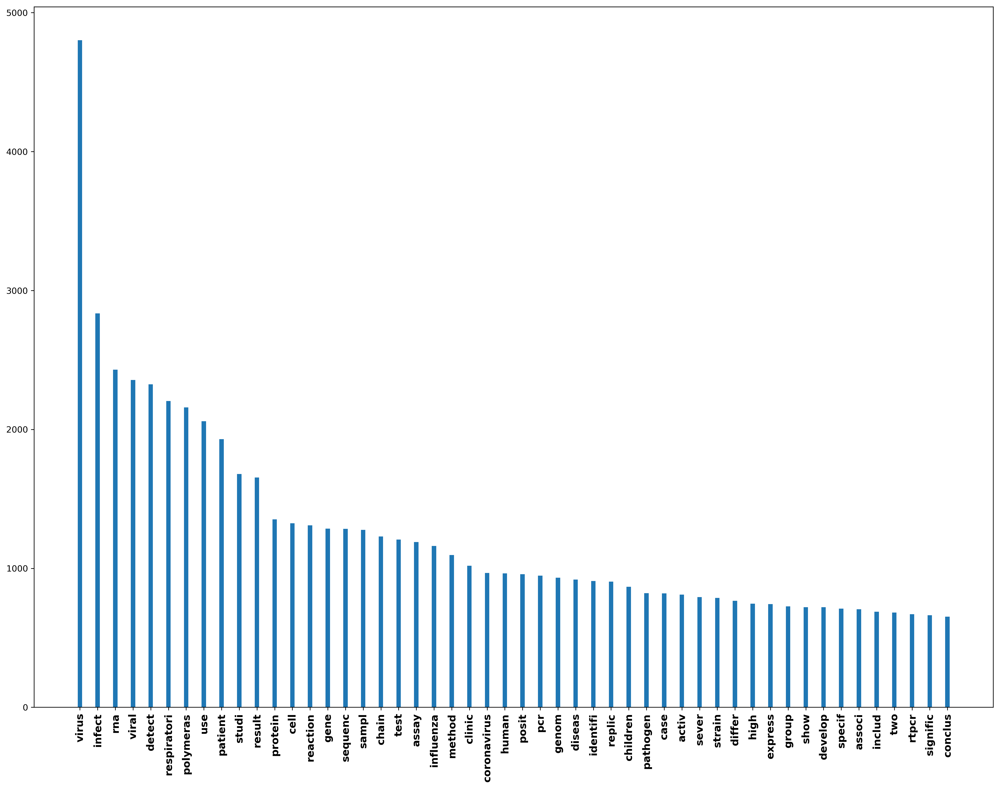

In [36]:
from collections import Counter
import matplotlib.pyplot as plt
import numpy as np

import matplotlib

matplotlib.rcParams['font.sans-serif'] = "Arial"
matplotlib.rcParams['figure.dpi'] = 300
barWidth = 0.25
plt.figure(figsize=(20,15))

counts = Counter(x)
common = counts.most_common(50)
labels = [item[0] for item in common]
number = [item[1] for item in common]
nbars = len(common)

plt.bar(np.arange(nbars), number,width=barWidth, tick_label=labels)
plt.xticks(rotation = 90, fontweight='bold',fontsize=12,)
plt.show()

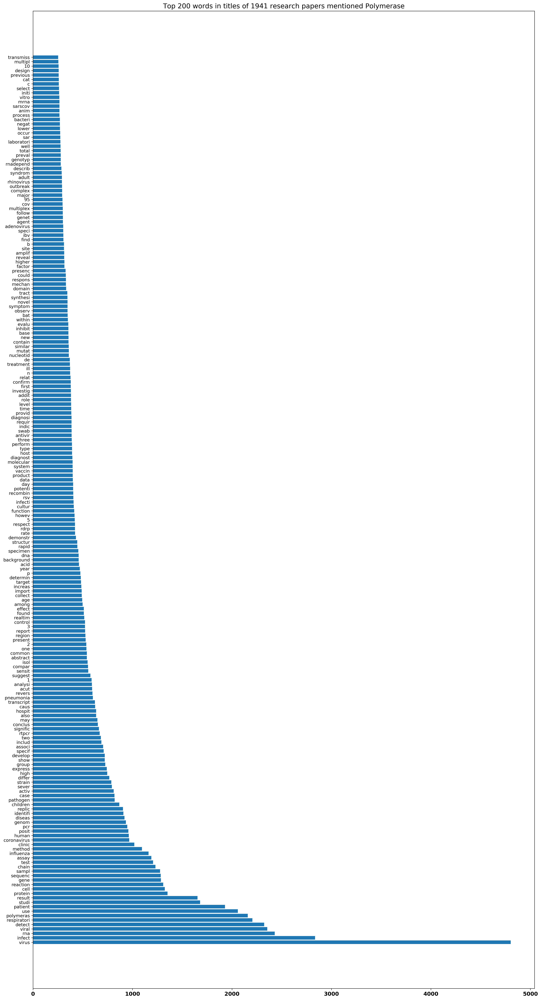

In [38]:
barWidth = 0.25
plt.figure(figsize=(20,40))

counts = Counter(x)
common = counts.most_common(200)
labels = [item[0] for item in common]
number = [item[1] for item in common]
nbars = len(common)

plt.barh(np.arange(nbars), number,tick_label=labels) #width=barWidth, 
plt.xticks( fontweight='bold',fontsize=12,) #rotation = 90,
plt.title('Top 200 words in titles of ' +str(df.ABS.shape[0])+  ' research papers mentioned Polymerase',fontsize=15)#,fontweight='bold'   #df2.title.shape
plt.show()

In [50]:
customize_stop_words2 = [
    'used', 'using', 'SARS CoV','MERS CoV','Abstract','found','result','method','conclusion','results','case','cases',
    'compared','many','well','including','identified','Although','present','Middle East','infection','patient'
    'infectious','treatment','China','East','Role','COVID','human','model','Chapter','viruses','methods','disease'
]
#capital letter must match

STOPWORDS2 = list(STOPWORDS)  + customize_stop_words2

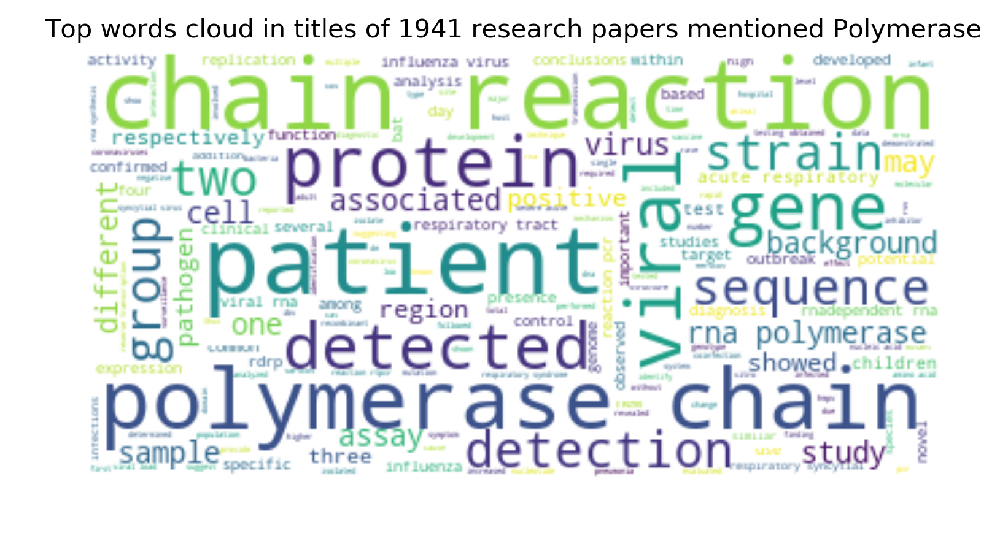

In [51]:
text = outString

# Create and generate a word cloud image:
wordcloud = WordCloud(stopwords = STOPWORDS2,  background_color="white").generate(text)

#matplotlib.rcParams['font.sans-serif'] = "Arial"
matplotlib.rcParams['figure.dpi'] = 300

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title('Top words cloud in titles of ' +str(df.ABS.shape[0])+  ' research papers mentioned Polymerase',fontsize=10)#,fontweight='bold'
plt.show()

#### The plot shows "polymerase chain" is a high frequency word. By domain knowledge we know it is becasue PCR. 

In [52]:
data1 = np.array(df.ABS.drop_duplicates(keep='last'))
data1

array(['abstract astrocytes produce granulocytemacrophage colonystimulating factor gmcsf and support the survival and proliferation of microglia to study the functions of gmcsf in the central nervous system cns we examined the effects of gmcsf on cytokine production by glial cells gmcsf induced interleukin6 il6 production by microglia but not by astrocytes in a dosedependent manner as assessed by bioassay and the detection of il6 mrna by reverse transcriptasepolymerase chain reaction rtpcr analysis gmcsf did not induce tumor necrosis factor tnfa or il1 in microglia and astrocytes whereas lipopolysaccharide induced all these cytokines the induction of il6 by gmcsf in microglia was completely inhibited by antibodies to gmcsf neither il3 nor macrophagecsf mcsf induced il6 production in microglia given that il1 and tnf monokines derived from microglia induce il6 production in astrocytes but not in microglia results indicate that astrocytes and microglia may mutually regulate il6 production

In [8]:
data1.shape


(1941,)

In [9]:
data1list=data1.tolist()

In [3]:
%%capture
# Install the latest Tensorflow version.
#!pip3 install --upgrade tensorflow-gpu
# Install TF-Hub.
!pip3 install tensorflow-hub
#!pip3 install seaborn

In [4]:
import numpy as np
import pandas as pd

import tensorflow as tf
import tensorflow_hub as hub

embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/3")

In [10]:
embeddings = embed(data1list)["outputs"]

#print(embeddings)

In [11]:
embeddings.shape

TensorShape([1941, 512])

In [12]:
NParray1941papers512vector=np.array(embeddings)
NParray1941papers512vector

array([[ 0.02409276,  0.00333246,  0.02617527, ..., -0.05257908,
        -0.02694643, -0.06477401],
       [ 0.00073825,  0.02878778,  0.00838286, ..., -0.05337695,
        -0.03477789,  0.00727506],
       [-0.02900779,  0.03677293,  0.01629622, ..., -0.04934358,
        -0.00588756, -0.03237622],
       ...,
       [-0.0604236 , -0.00013403, -0.05867178, ..., -0.05803579,
        -0.06144454, -0.05860412],
       [-0.01348849,  0.04927895, -0.05944375, ..., -0.03317856,
        -0.04884239, -0.04074986],
       [ 0.01909221,  0.01242393, -0.05794841, ..., -0.04703324,
        -0.00612303, -0.06096034]], dtype=float32)

In [13]:
testAbstract1=["background enterovirus 71 ev71 is one of the major causative agents of hand foot and mouth disease hfmd which is sometimes associated with severe central nervous system disease in children there is currently no specific medication for ev71 infection quercetin one of the most widely distributed flavonoids in plants has been demonstrated to inhibit various viral infections however investigation of the antiev71 mechanism has not been reported to date methods the antiev71 activity of quercetin was evaluated by phenotype screening determining the cytopathic effect cpe and ev71induced cells apoptosis the effects on ev71 replication were evaluated further by determining virus yield viral rna synthesis and protein expression respectively the mechanism of action against ev71 was determined from the effective stage and timeofaddition assays the possible inhibitory functions of quercetin via viral 2apro 3cpro or 3dpol were tested the interaction between ev71 3cpro and quercetin was predicted and calculated by molecular docking results quercetin inhibited ev71mediated cytopathogenic effects reduced ev71 progeny yields and prevented ev71induced apoptosis with low cytotoxicity investigation of the underlying mechanism of action revealed that quercetin exhibited a preventive effect against ev71 infection and inhibited viral adsorption moreover quercetin mediated its powerful therapeutic effects primarily by blocking the early postattachment stage of viral infection further experiments demonstrated that quercetin potently inhibited the activity of the ev71 protease 3cpro blocking viral replication but not the activity of the protease 2apro or the rna polymerase 3dpol modeling of the molecular binding of the 3cproquercetin complex revealed that quercetin was predicted to insert into the substratebinding pocket of ev71 3cpro blocking substrate recognition and thereby inhibiting ev71 3cpro activity conclusions quercetin can effectively prevent ev71induced cell injury with low toxicity to host cells quercetin may act in more than one way to deter viral infection exhibiting some preventive and a powerful therapeutic effect against ev71 further quercetin potently inhibits ev71 3cpro activity thereby blocking ev71 replication"]

In [14]:
testAbstract2=["background to investigate the effects and immunological mechanisms of the traditional chinese medicine xinjiaxiangruyin on controlling influenza virus fm1 strain infection in mice housed in a hygrothermal environment methods mice were housed in normal and hygrothermal environments and intranasally infected with influenza virus fm1 a highperformance liquid chromatography fingerprint of xinjiaxiangruyin was used to provide an analytical method for quality control realtime quantitative polymerase chain reaction rtqpcr was used to measure messenger rna expression of tolllike receptor 7 tlr7 myeloid differentiation primary response 88 myd88 and nuclear factorkappa b nfb p65 in the tlr7 signaling pathway and virus replication in the lungs western blotting was used to measure the expression levels of tlr7 myd88 and nfb p65 proteins flow cytometry was used to detect the proportion of th17tregulatory cells results xinjiaxiangruyin effectively alleviated lung inflammation in c57bl6 mice in hot and humid environments guizhimahuanggebantang significantly reduced lung inflammation in c57bl6 mice the expression of tlr7 myd88 and nfb p65 mrna in lung tissue of wt mice in the normal environment gzmhgbt group was significantly lower than that in the model group p  005 in wt mice exposed to the hot and humid environment the expression levels of tlr7 myd88 and nfb p65 mrna in the xjxry group were significantly different from those in the virus group the expression levels of tlr7 myd88 and nfb p65 protein in lung tissue of wt mice exposed to the normal environment gzmhgbt group was significantly lower than those in the model group in wt mice exposed to hot and humid environments the expression levels of tlr7 myd88 and nfb p65 protein in xjxry group were significantly different from those in the virus group conclusion guizhimahuanggebantang demonstrated a satisfactory therapeutic effect on mice infected with the influenza a virus fm1 strain in a normal environment and xinjiaxiangruyin demonstrated a clear therapeutic effect in damp and hot environments and may play a protective role against influenza through downregulation of the tlr7 signal pathway"]

In [15]:
Question1=['What are clinical effective therapeutics or drugs for COVID-19?']

In [16]:
embeddingsT1 = embed(testAbstract1)["outputs"]
embeddingsT2 = embed(testAbstract2)["outputs"]

embeddingsQ1 = embed(Question1)["outputs"]

test1=np.array(embeddingsT1)
test2=np.array(embeddingsT2)

question1=np.array(embeddingsQ1)

import textwrap

### Examples of recommend similar papers

In [17]:
result1 = np.sum(NParray1941papers512vector*test1,axis=1)/(np.sqrt(np.sum(NParray1941papers512vector*NParray1941papers512vector,axis=1))*np.sqrt(np.sum(test1*test1)))
maxRows1=result1.argsort()[-10:][::-1]  #https://stackoverflow.com/questions/6910641/how-do-i-get-indices-of-n-maximum-values-in-a-numpy-array
print("The indexes for most similar papers are:") 
print(maxRows1)
print("\n")
print("The cosine similarity for top 5 papers are:") 
print(result1[result1.argsort()[-10:][::-1]])
print("\n")
print("For Paper Abstract:\n")
print(textwrap.fill(testAbstract1[0],100))
print("\nWe found the top 10 most similar papers as listed below:\n")
print(df.ABS.iloc[maxRows1])

The indexes for most similar papers are:
[ 984 1499 1937 1064  663 1636  154   38  146  776]


The cosine similarity for top 5 papers are:
[1.0000001  0.8270296  0.77556515 0.7716375  0.7676147  0.76736087
 0.75756586 0.7570242  0.75692165 0.75613713]


For Paper Abstract:

background enterovirus 71 ev71 is one of the major causative agents of hand foot and mouth disease
hfmd which is sometimes associated with severe central nervous system disease in children there is
currently no specific medication for ev71 infection quercetin one of the most widely distributed
flavonoids in plants has been demonstrated to inhibit various viral infections however investigation
of the antiev71 mechanism has not been reported to date methods the antiev71 activity of quercetin
was evaluated by phenotype screening determining the cytopathic effect cpe and ev71induced cells
apoptosis the effects on ev71 replication were evaluated further by determining virus yield viral
rna synthesis and protein expressio

In [18]:
result2 = np.sum(NParray1941papers512vector*test2,axis=1)/(np.sqrt(np.sum(NParray1941papers512vector*NParray1941papers512vector,axis=1))*np.sqrt(np.sum(test2*test2)))
maxRows2=result2.argsort()[-10:][::-1]  #https://stackoverflow.com/questions/6910641/how-do-i-get-indices-of-n-maximum-values-in-a-numpy-array
print("The indexes for most similar papers are:") 
print(maxRows2)
print("\n")
print("The cosine similarity for top 5 papers are:") 
print(result2[result2.argsort()[-10:][::-1]])
print("\n")
print("For Paper Abstract:\n")
print(textwrap.fill(testAbstract2[0],100))
print("\nWe found the top 10 most similar papers as listed below:\n")
print(df.ABS.iloc[maxRows2])

The indexes for most similar papers are:
[1046 1453 1279 1383 1064 1168 1563  400  210 1419]


The cosine similarity for top 5 papers are:
[0.99999994 0.7110583  0.6851455  0.6791582  0.6723436  0.66990966
 0.66609055 0.6534611  0.64800745 0.6457796 ]


For Paper Abstract:

background to investigate the effects and immunological mechanisms of the traditional chinese
medicine xinjiaxiangruyin on controlling influenza virus fm1 strain infection in mice housed in a
hygrothermal environment methods mice were housed in normal and hygrothermal environments and
intranasally infected with influenza virus fm1 a highperformance liquid chromatography fingerprint
of xinjiaxiangruyin was used to provide an analytical method for quality control realtime
quantitative polymerase chain reaction rtqpcr was used to measure messenger rna expression of
tolllike receptor 7 tlr7 myeloid differentiation primary response 88 myd88 and nuclear factorkappa b
nfb p65 in the tlr7 signaling pathway and virus replica

### Example of Question Answering system

In [19]:
resultq1 = np.sum(NParray1941papers512vector*question1,axis=1)/(np.sqrt(np.sum(NParray1941papers512vector*NParray1941papers512vector,axis=1))*np.sqrt(np.sum(question1*question1)))
maxRowsq1=resultq1.argsort()[-20:][::-1]  #https://stackoverflow.com/questions/6910641/how-do-i-get-indices-of-n-maximum-values-in-a-numpy-array
print("The indexes for most similar papers are:") 
print(maxRowsq1)
print("\n")
print("The cosine similarity for top 20 papers are:") 
print(resultq1[resultq1.argsort()[-20:][::-1]])
print("\n")
print("For Question:\n")
print(textwrap.fill(Question1[0],100))
print("\nWe found the top 20 most related papers as listed below:\n")
print(df.ABS.iloc[maxRowsq1])

The indexes for most similar papers are:
[ 644  818 1457 1145 1829   66 1774  496 1825  637   84  298 1403 1467
 1263  436 1789  647 1273  217]


The cosine similarity for top 20 papers are:
[0.31485555 0.28105113 0.27972364 0.2649105  0.2526728  0.24850303
 0.24528085 0.23647133 0.23592094 0.2335433  0.22230253 0.22137865
 0.22077075 0.21867044 0.21549016 0.21536064 0.2152237  0.21099517
 0.20463014 0.20306927]


For Question:

What are clinical effective therapeutics or drugs for COVID-19?

We found the top 20 most related papers as listed below:

644     ltpgtltbgtltbgt there is no specific drug that...
818     limited data is available on feline leishmanio...
1457    please cite this paper as wathen et al 2012 an...
1145    background rapid molecular methods have create...
1829    introduction the differentiation of viral from...
66      abstract viruses are major pathogenic agents c...
1774    abstractthe global spread of sarscov2 requires...
496     in this study 26 blood samples